# Installing libraries and dependencies

In [1]:
import nltk
import spacy
!pip install squarify
nlp = spacy.load('en_core_web_sm')
nltk.download("stopwords")
nltk.download('popular')
# Install nltk Dependencies
nltk.download('maxent_ne_chunker')
nltk.download('words')
nltk.download('punkt')
nltk.download('data')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\SDO\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     C:\Users\SDO\AppData\Roaming\nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     C:\Users\SDO\AppData\Roaming\nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     C:\Users\SDO\AppData\Roaming\nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     C:\Users\SDO\AppData\Roaming\nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     C:\Users\SDO\AppData\R

True

# Importing libraries and dependencies

In [2]:
import nltk
from datetime import datetime
import spacy
import os
from os import listdir
import seaborn as sns
import csv
from os.path import isfile, join
from io import StringIO
import re
import string
import csv
import gensim
import pandas as pd
import matplotlib.pyplot as plt
from gensim.models import Word2Vec
from wordcloud import WordCloud, STOPWORDS
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
from collections import Counter
from nltk.stem import WordNetLemmatizer
from gensim.parsing.preprocessing import remove_stopwords
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from nltk.corpus import stopwords
from gensim.models.phrases import Phraser, Phrases
from spacy.matcher import Matcher, PhraseMatcher
from nltk.util import ngrams
nlp = spacy.load('en_core_web_sm')
matcher = Matcher(nlp.vocab)

# Model

**Creating word embeddings**

In [3]:
from gensim.models import Word2Vec
import string
import re
from nltk.corpus import stopwords
with open(r'skills.txt',encoding="utf8") as f:
    content = f.readlines()
# you may also want to remove whitespace characters like `\n` at the end of each line
content = [x.strip() for x in content] 

In [4]:
x=[]
for line in content:
    tokens=word_tokenize(line)
    tok=[w.lower() for w in tokens]
    table=str.maketrans('','',string.punctuation)
    strpp=[w.translate(table) for w in tok]
    words=[word for word in strpp if word.isalpha()]
    stop_words=set(stopwords.words('english'))
    words=[w for w in words if not w in stop_words]
    x.append(words)

In [5]:
texts=x

**Removing words that are not useful**

In [6]:
with open('common.txt') as f:
    content2 = f.read()
ntexts=[]
l=len(texts)
for j in range(l):
    s=texts[j]
    res = [i for i in s if i not in content2]
    ntexts.append(res)
print(texts[6])

['william', 'cleveland', 'introduced', 'data', 'science', 'independent', 'discipline', 'extending', 'field', 'statistics', 'incorporate', 'advances', 'computing', 'data', 'article', 'data', 'science', 'action', 'plan', 'expanding', 'technical', 'areas', 'field', 'statistics', 'published', 'volume', 'april', 'edition', 'international', 'statistical', 'review', 'revue', 'internationale', 'de', 'statistique', 'report', 'cleveland', 'establishes', 'six', 'technical', 'areas', 'believed', 'encompass', 'field', 'data', 'science', 'multidisciplinary', 'investigations', 'models', 'methods', 'data', 'computing', 'data', 'pedagogy', 'tool', 'evaluation', 'theory']


In [7]:
print(len(ntexts))
texts=ntexts

316


In [8]:
content=texts

In [9]:
common_terms = ["of", "with", "without", "and", "or", "the", "a"]
x=ntexts
# Create the relevant phrases from the list of sentences:
phrases = Phrases(x, common_terms=common_terms)
# The Phraser object is used from now on to transform sentences
bigram = Phraser(phrases)
# Applying the Phraser to transform our sentences
all_sentences = list(bigram[x])
model=gensim.models.Word2Vec(all_sentences,size=5000,min_count=2,workers=4,window=4)
model.save("final.model")
wrds=list(model.wv.vocab)
print(len(wrds))

1285


In [10]:
a=model.wv.most_similar("machine_learning")
b=model.wv.most_similar("analytics")
c=model.wv.most_similar("ai")

In [11]:
print(a)
print(b)
print(c)

[('data', 0.14307278394699097), ('software', 0.13207167387008667), ('system', 0.1267927885055542), ('models', 0.12624241411685944), ('used', 0.1257932335138321), ('deep_learning', 0.12390860170125961), ('one', 0.12289488315582275), ('learning', 0.1208973377943039), ('classification', 0.1178601086139679), ('data_science', 0.11483447253704071)]
[('deep_learning', 0.09446949511766434), ('layer', 0.0919799879193306), ('programming', 0.09183815121650696), ('may', 0.0910482183098793), ('time', 0.08932756632566452), ('models', 0.0886765569448471), ('data', 0.08824845403432846), ('used', 0.08750901371240616), ('one', 0.08724966645240784), ('learn', 0.08627299219369888)]
[('programming', 0.07198740541934967), ('software', 0.06211443245410919), ('engineering', 0.062087468802928925), ('large', 0.05825403332710266), ('deep_learning', 0.05583734065294266), ('model', 0.05534688010811806), ('software_development', 0.05352155864238739), ('stages', 0.05128272995352745), ('big_data', 0.05067905038595199

**ADDING new words in the vocab of pre-trained model**

In [12]:
model = Word2Vec.load("final.model") 
model.min_count = 1
docs = [["Oracle", "MERN"]]
model.build_vocab(docs, update=True)
model.train(docs, total_examples = len(docs), epochs = 10)
#model.train([["Oracle", "MERN"]], total_examples=1, epochs=1)

<ipython-input-12-3c4301e9f468>:2: DeprecationWarning: Call to deprecated `min_count` (Attribute will be removed in 4.0.0, use self.vocabulary.min_count instead).
  model.min_count = 1


(1, 20)

In [13]:
print(len(model.wv.vocab))

1287


In [14]:
d=model.wv.most_similar("Oracle")
d

[('dimension', 0.05537447705864906),
 ('possibly', 0.04366173595190048),
 ('style', 0.041339606046676636),
 ('databases', 0.03934955596923828),
 ('subject', 0.03862461447715759),
 ('curran', 0.03831964358687401),
 ('publishing', 0.03722734749317169),
 ('every', 0.03510517627000809),
 ('sentences', 0.034823235124349594),
 ('article', 0.03476891666650772)]

# **RESUME**

**Stopwords Section**

In [15]:
nlp_stopwords = stopwords.words('english')
gensim_stopwords = gensim.parsing.preprocessing.STOPWORDS
sp = spacy.load('en_core_web_sm')
spacy_stopwords = sp.Defaults.stop_words

stopwords_list = stopwords.words('english')

sw_list = ['summary','year','education','page','summary','college','university','company','skills','bachelor','country',
           'address','email','name','phone','house','jan','feb','mar','apr','may','june','july','aug','sep','oct','nov',
           'dec','com','gmail','school','hospital']

stopwords_list.extend(gensim_stopwords) #appending gensim stopwords in nltk
stopwords_list.extend(spacy_stopwords) #appending spacy stopwords in nltk
stopwords_list.extend(sw_list) #appending customized stopwords in nltk

**Function for cleaning data**

In [16]:
def clean_data(file_content):

    file_content = file_content.lower()
    file_content = re.sub('\[.*?\]', '', file_content)
    file_content = re.sub('[‘’“”…]', '', file_content)
    file_content = re.sub('\n', '', file_content) 
    file_content = re.sub('\t\t', '', file_content)
    file_content = re.sub('[%s]' % re.escape(string.punctuation), '', file_content)
    file_content = re.sub('\w*\d\w*', '', file_content)
    file_content = re.sub('\W', ' ', file_content)
    file_content = remove_stopwords(file_content)
    tokens = word_tokenize(file_content)
    tokens_without_sw = [word for word in tokens if not word in stopwords_list]
    lemmatizer = WordNetLemmatizer()
    lemmatized_output = ' '.join([lemmatizer.lemmatize(w) for w in tokens_without_sw])
    s = list(str(lemmatized_output))
    r  = ''.join([lemmatizer.lemmatize(r) for r in s])
    tokens2 = word_tokenize(r)
    return tokens2

##### **Function for extracting email**

In [17]:
def extract_email(text):
    email = re.compile(r'[a-zA-Z0-9-\.]+@[a-zA-Z-\.]*\.(com|edu|net)')
    matches = email.finditer(text)
    for match in matches:
        return(match.group(0))

**Function for extracting Phone**

In [18]:
def extract_phone(text):
    phone = re.compile(r'(?:(?:\+?([1-9]|[0-9][0-9]|[0-9][0-9][0-9])\s*(?:[.-]\s*)?)?(?:\(\s*([2-9]1[02-9]|[2-9][02-8]1|[2-9][02-8][02-9])\s*\)|([0-9][1-9]|[0-9]1[02-9]|[2-9][02-8]1|[2-9][02-8][02-9]))\s*(?:[.-]\s*)?)?([2-9]1[02-9]|[2-9][02-9]1|[2-9][02-9]{2})\s*(?:[.-]\s*)?([0-9]{4})(?:\s*(?:#|x\.?|ext\.?|extension)\s*(\d+))?')
    matches = phone.finditer(text)
    for match in matches:
        return(match.group(0))

**Function for extracting Name**

In [19]:
def extract_name(resume_text):
    nlp_text = nlp(resume_text)
    # First name and Last name are always Proper Nouns
    pattern = [{'POS': 'PROPN'}, {'POS': 'PROPN'}]
    matcher.add('NAME', [pattern]) #matching
    matches = matcher(nlp_text)
    for match_id, start, end in matches:
        span = nlp_text[start:end]
        return span.text

**Function for extracting technical skills**

In [20]:
def extract_skills(resume_text):
    nlp_text = nlp(resume_text)
    tokens = [token.text for token in nlp_text if not token.is_stop]
    data = pd.read_csv("skills.csv") 
    skills = list(data.columns.values)
    skillset = []
    for token in tokens:
        if token.lower() in skills:
            skillset.append(token)
    return [i.capitalize() for i in set([i.lower() for i in skillset])]

**Function for extracting education**

In [21]:
# Education Degrees
EDUCATION = [
            'BE','B.E.', 'B.E', 'BS', 'B.S', 
            'ME', 'M.E', 'M.E.', 'MS', 'M.S', 
            'BTECH', 'B.TECH', 'M.TECH', 'MTECH', 
            'SSC', 'HSC', 'CBSE', 'ICSE', 'X', 'XII',
            'Matriculation','BSC','PhD'
        ]
def extract_education(resume_text):
    nlp_text = nlp(resume_text)

    # Sentence Tokenizer
    nlp_text = [sent.string.strip() for sent in nlp_text.sents]

    edu = {}
    # Extract education degree
    for index, text in enumerate(nlp_text):
        for tex in text.split():
            # Replace all special symbols
            tex = re.sub(r'[?|$|.|!|,]', r'', tex)
            if tex.upper() in EDUCATION and tex not in STOPWORDS:
                edu[tex] = text + nlp_text[index + 1]

    # Extract year
    education = []
    for key in edu.keys():
        year = re.search(re.compile(r'(((20|19)(\d{2})))'), edu[key])
        if year:
            education.append((key, ''.join(year[0])))
        else:
            education.append(key)
    return education

**Function for extracting analytical skills**

In [22]:
def extract_analytical_skills(resume_text):
    nlp_text = nlp(resume_text)

    # removing stop words and implementing word tokenization
    tokens = [token.text for token in nlp_text if not token.is_stop]
    
    # reading the csv file
    data = pd.read_csv("AnalyticalSkills.csv") 
    
    # extract values
    a_skills = list(data.columns.values)
    
    a_skillset = []
    
    # check for one-grams (example: python)
    for token in tokens:
        if token.lower() in a_skills:
            a_skillset.append(token)
    
    return [i.capitalize() for i in set([i.lower() for i in a_skillset])]

**Function for extracting Leadership Skills**

In [23]:
def extract_leadership_skills(resume_text):
    nlp_text = nlp(resume_text)

    # removing stop words and implementing word tokenization
    tokens = [token.text for token in nlp_text if not token.is_stop]
    
    # reading the csv file
    data = pd.read_csv("LeadershipSkills.csv") 
    
    # extract values
    l_skills = list(data.columns.values)
    
    l_skillset = []
    
    # check for one-grams (example: python)
    for token in tokens:
        if token.lower() in l_skills:
            l_skillset.append(token)

    return [i.capitalize() for i in set([i.lower() for i in l_skillset])]

**Function for extracting Teamwork skills**

In [24]:
def extract_teamwork_skills(resume_text):
    nlp_text = nlp(resume_text)

    # removing stop words and implementing word tokenization
    tokens = [token.text for token in nlp_text if not token.is_stop]
    
    # reading the csv file
    data = pd.read_csv("TeamworkSkills.csv") 
    
    # extract values
    t_skills = list(data.columns.values)
    
    t_skillset = []
    
    # check for one-grams (example: python)
    for token in tokens:
        if token.lower() in t_skills:
            t_skillset.append(token)
    
    return [i.capitalize() for i in set([i.lower() for i in t_skillset])]

**Function for extracting Communication skills**

In [25]:
def extract_communication_skills(resume_text):
    nlp_text = nlp(resume_text)

    # removing stop words and implementing word tokenization
    tokens = [token.text for token in nlp_text if not token.is_stop]
    
    # reading the csv file
    data = pd.read_csv("CommunicationSkills.csv") 
    
    # extract values
    c_skills = list(data.columns.values)
    
    c_skillset = []
    
    # check for one-grams (example: python)
    for token in tokens:
        if token.lower() in c_skills:
            c_skillset.append(token)
    return [i.capitalize() for i in set([i.lower() for i in c_skillset])]

**Function for extracting action verbs**

In [26]:
def extract_action_verbs(resume_text):
    nlp_text = nlp(resume_text)

    # removing stop words and implementing word tokenization
    tokens = [token.text for token in nlp_text if not token.is_stop]
    
    # reading the csv file
    data = pd.read_csv("Action_words.csv") 
    
    # extract values
    c_skills = list(data.columns.values)
    
    c_skillset = []
    
    # check for one-grams (example: python)
    for token in tokens:
        if token.lower() in c_skills:
            c_skillset.append(token)
    return [i.capitalize() for i in set([i.lower() for i in c_skillset])]

**Function for extracting measureable results**

In [27]:
def extract_measureable_results(resume_text):
    nlp_text = nlp(resume_text)

    # removing stop words and implementing word tokenization
    tokens = [token.text for token in nlp_text if not token.is_stop]
    
    # reading the csv file
    data = pd.read_csv("Measurable_results.csv") 
    
    # extract values
    c_skills = list(data.columns.values)
    
    c_skillset = []
    
    # check for one-grams (example: python)
    for token in tokens:
        if token.lower() in c_skills:
            c_skillset.append(token)
    return [i.capitalize() for i in set([i.lower() for i in c_skillset])]

**Function for extracting result-driven skills**

In [28]:
def extract_result_driven_skills(resume_text):
    nlp_text = nlp(resume_text)

    # removing stop words and implementing word tokenization
    tokens = [token.text for token in nlp_text if not token.is_stop]
    
    # reading the csv file
    data = pd.read_csv("Result_driven_skills.csv") 
    
    # extract values
    c_skills = list(data.columns.values)
    
    c_skillset = []
    
    # check for one-grams (example: python)
    for token in tokens:
        if token.lower() in c_skills:
            c_skillset.append(token)
    return [i.capitalize() for i in set([i.lower() for i in c_skillset])]

**Function for extracting Strengths**

In [29]:
def extract_strength(resume_text):
    nlp_text = nlp(resume_text)

    # removing stop words and implementing word tokenization
    tokens = [token.text for token in nlp_text if not token.is_stop]
    
    # reading the csv file
    data = pd.read_csv("combined.csv") 
    
    # extract values
    strengths = list(data.columns.values)
    
    strengthsset = []
    
    # check for one-grams (example: python)
    for token in tokens:
        if token.lower() in strengths:
            strengthsset.append(token)
    
    return [i.capitalize() for i in set([i.lower() for i in strengthsset])]

**Function for cleaning through nlp**

In [30]:
def nlp_cleaning(content, file_content):
    digits = []
    name_nlp = []
    loc = []
    date = []
    norp = []
    law = []
    percent = []
    product = []
    time = []
    x = []
    
    doc = nlp(content)
    for ent in doc.ents:
    #print(f'Entity:{ent}, Label: {ent.label_}')
        if 'ORG' in ent.label_:
            x.append(ent)
        if 'CARDINAL' in ent.label_:
            digits.append(ent)
        if 'PERSON' in ent.label_:
            name_nlp.append(ent)
        if 'GPE' in ent.label_:
            loc.append(ent)
        if 'DATE' in ent.label_:
            date.append(ent)
        if 'NORP' in ent.label_:
            norp.append(ent)
        if 'LAW' in ent.label_:
            law.append(ent)
        if 'PERCENT' in ent.label_:
            percent.append(ent)
        if 'PRODUCT' in ent.label_:
            product.append(ent)
        if 'TIME' in ent.label_:
            time.append(ent)
    x = str(x)
    x_tokens = word_tokenize(x)
    date = str(date)
    date_tokens = word_tokenize(date)
    loc = str(loc)
    loc_tokens = word_tokenize(loc)
    digits = str(digits)
    digits_tokens = word_tokenize(digits)
    norp = str(norp)
    norp_tokens = word_tokenize(norp)
    law = str(law)
    law_tokens = word_tokenize(law)
    percent = str(percent)
    percent_tokens = word_tokenize(percent)
    product = str(product)
    product_tokens = word_tokenize(product)
    time = str(time)
    time_tokens = word_tokenize(time)
    
    mylist = [word for word in file_content if word not in date_tokens and not word in x_tokens and not word in loc_tokens and not word in digits_tokens 
              and word not in norp_tokens and not word in law_tokens and not word in percent_tokens and not word in 
              product_tokens and word not in time_tokens]
    
    lemmatizer = WordNetLemmatizer()
    final = ' '.join([lemmatizer.lemmatize(w) for w in mylist])
    return final

**Function for creating wordcloud**

In [31]:
def create_wordcloud(final):
    wordcloud = WordCloud(max_font_size=35, max_words=100, background_color="white").generate(final)
    plt.figure(figsize = (5,5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

**Function for creating wordcloud of skills**

In [32]:
def create_wordcloud_of_skills(skills):
    cloud = WordCloud(max_font_size=80,colormap="hsv").generate(skills)
    plt.figure(figsize=(12,12))
    plt.imshow(cloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

**Function for Experience**

In [33]:
def experience_finder(c):
    all_ex=[]
    month=["January","February","March","April","May","June","July","August","September","October","November","December"]
    for i in c:
        start_date=i[0].split()
        
        if start_date[0] in month:
            index=month.index(start_date[0])
            index+=1
        start_date = datetime(int(start_date[-1]),index,1,0, 0, 0)
        end_date=i[3].split()
        
        if end_date[0] in month:
            index=month.index(end_date[0])
            index+=1
        
        end_date = datetime(int(end_date[-1]),index,1,0, 0, 0)
        experince=end_date-start_date
        if float(str(experince).split(",")[0].split()[0])<365:
            experince=float(str(experince).split(",")[0].split()[0])
            experince=experince/365
            experince*=12
            experince=str(experince)+ " months"
        elif float(str(experince).split(",")[0].split()[0])>=365:    
            experince=experince/365
            experince=str(experince).split(",")[0].split()[0]+ " years"
        all_ex.append(experince)
    
    return all_ex

**Reading Reseume from directory**

In [34]:
mypath=r'Resumes'
#Path for the files
onlyfiles = [os.path.join(mypath, f) for f in os.listdir(mypath) if os.path.isfile(os.path.join(mypath, f))]

In [35]:
len(onlyfiles)

50

In [36]:
onlyfiles

['Resumes\\Ahmed Zubair - Resume.txt',
 "Resumes\\Akram's Resume.txt",
 "Resumes\\Arhum Hayat Qazi's Resume.txt",
 'Resumes\\ASHER H KHAN Resume.txt',
 'Resumes\\CV (Areeb Aziz).txt',
 'Resumes\\cv-HammadRaza.txt',
 'Resumes\\Daniyal Resume.txt',
 'Resumes\\FaizainullahkhalohoCV.txt',
 'Resumes\\farrukhkhancv.txt',
 'Resumes\\Ghulam_Nabi.txt',
 'Resumes\\Hamzaafaq hussaincv.txt',
 "Resumes\\Haseeb's  Resume.txt",
 'Resumes\\HibaRESUME .txt',
 "Resumes\\IFTIKHAR's_Resume.txt",
 'Resumes\\irtezaRessume.txt',
 "Resumes\\Iyman Ahmed's Resume 2.txt",
 'Resumes\\ManeshKumar-Resume.txt',
 'Resumes\\MOIZ BIN ATA LinkedIn CV (1).txt',
 'Resumes\\MOIZ BIN ATA LinkedIn CV.txt',
 'Resumes\\Muhammad Faraz Ozair - Resume.txt',
 'Resumes\\Nabeel Khan - Director Infrastructure-ML-V2.txt',
 'Resumes\\Nabeel Khan-Chief Business Analyst.txt',
 'Resumes\\Nabeel Khan-Chief Data Scientist.txt',
 'Resumes\\Nabeel Khan-Machine Learning.txt',
 'Resumes\\Nabeel Khan-PreSales.txt',
 'Resumes\\NasirCV.txt',
 'Res

**Function for creating Personal Deatils csv**

In [37]:
header = ['Name','Email','Phone','Education','Expereince','Technical Skills','Analytical Skills','Leadership Skills',
          'Teamwork Skills','Communication Skills','Action verbs']    

with open('Personal Details.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(header)

**Function for creating csv for Visualization**

In [38]:
header = ['Name','Expereince','Analytical Skills','Leadership Skills','Teamwork Skills','Communication Skills','Action verbs',
          'Measureable Results','Result-driven Skills','Strengths','Soft Skills']    

with open('Details.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(header)

# Information Extraction

In [39]:
f = []
list1 = []


def main(file):
    txt_file = open(file,'rt',encoding = 'utf-8')
    content = txt_file.read()
    file_content = content
    #######################################################################
    date = []
    doc = nlp(content)
    exp = []
    
    for ent in doc.ents:
        if 'DATE' in ent.label_:
            date.append(ent)
    m = str(date)
    try: 
        c = re.findall(r"(?P<fmonth>\w+(?P<fh>.)\d+)\s*(\s|-|to)\s*(?P<smonth>\w+(?P<sh>.)\d+|present|date|now)",m)
        all_experience=experience_finder(c)
        count=0
        for x in all_experience:
            if "years" in x:
                x=float(x.split()[0])
                count=count+x
            elif 'months' in x:
                x=float(x.split()[0])/12
                count=count+x
                exp = count

    except:
        exp = 0
    ######################################################################
    
    final_list = [] 
    details = []
    
    name = extract_name(file_content)
    print("Name : ",name)
    
    email = extract_email(file_content)
    print("\nEmail : ",email)
    
    phone = extract_phone(file_content)
    print("\nPhone : ",phone)
    
    technical_skills = extract_skills(file_content)
    print("\nTechincal Skills : ",technical_skills)
    
    analytical_skills = extract_analytical_skills(file_content)
    a = len(analytical_skills)
    print("\nAnalytical Skills : ",analytical_skills)
    
    try:
        
        listToStr = ' '.join([str(elem) for elem in analytical_skills])
        print("\n**************************************** WORLCLOUD FOR ANALYTICAL SKILLS ****************************************")
        wordcloud = create_wordcloud(listToStr)
    except:
        print("No analytical skill")
    
    leadership_skills = extract_leadership_skills(file_content)
    b = len(leadership_skills)
    print(" \nLeadership Skills : ",leadership_skills)
    
    try: 
        listToStr = ' '.join([str(elem) for elem in leadership_skills])
        print("\n**************************************** WORLCLOUD FOR LEADERSHIP SKILLS ****************************************")
        wordcloud = create_wordcloud(listToStr)
    except:
        print("No leadership skill")
    
    teamwork_skills = extract_teamwork_skills(file_content)
    c = len(teamwork_skills)
    print(" \nTeamwork Skills : ",teamwork_skills)
    
    try: 
        listToStr = ' '.join([str(elem) for elem in teamwork_skills])
        print("\n**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************")
        wordcloud = create_wordcloud(listToStr)
    except:
        print("No Teamwork skill")
    
    communication_skills = extract_communication_skills(file_content)
    d = len(communication_skills)
    print(" \nCommunication Skills : ",communication_skills)
    
    try: 
        listToStr = ' '.join([str(elem) for elem in communication_skills])
        print("\n***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************")
        wordcloud = create_wordcloud(listToStr)
    except:
        print("No communication skill")
    
    action_verbs = extract_action_verbs(file_content)
    e = len(action_verbs)
    print(" \nAction Verbs :  ",action_verbs)
    
    
    try: 
        listToStr = ' '.join([str(elem) for elem in action_verbs])
        print("\n***************************************** WORLCLOUD FOR ACTION VERBS ****************************************")
        wordcloud = create_wordcloud(listToStr)
    except:
        print("No action verbs")
    
    measureable_result = extract_measureable_results(file_content)
    f = len(measureable_result)
    print(" \nMeasureable Results :  ",measureable_result)
    try:
        
        listToStr = ' '.join([str(elem) for elem in measureable_result])
        print("\n**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************")
        wordcloud = create_wordcloud(listToStr)
    except:
        print("No measureable result")
    
    result_driven_skills = extract_result_driven_skills(file_content)
    g = len(result_driven_skills)
    print(" \nResult driven skills :  ",result_driven_skills)
    
    
    try:
        listToStr = ' '.join([str(elem) for elem in result_driven_skills])
        print("\n**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************")
        wordcloud = create_wordcloud(listToStr)
    except:
        print("No result driven skill")
    
    strength = extract_strength(file_content)
    print(" \nStrength : ",strength)
    
    education = extract_education(file_content)
    print(" \nEducation : ",education)
    
    print("\nExperience",exp)
    
    strengths_skills = strength + technical_skills
    h = len(strengths_skills)
    
    soft_skills = analytical_skills + leadership_skills + teamwork_skills + communication_skills + action_verbs + measureable_result + result_driven_skills  
    i = len(soft_skills)
    
    final_list.append(name)
    final_list.append(email)
    final_list.append(phone)
    final_list.append(education)
    final_list.append(exp)
    final_list.append(technical_skills)
    final_list.append(analytical_skills)
    final_list.append(leadership_skills)
    final_list.append(teamwork_skills)
    final_list.append(communication_skills)
    final_list.append(action_verbs)
    
    details.append(name)
    details.append(exp)
    details.append(a)
    details.append(b)
    details.append(c)
    details.append(d)
    details.append(e)
    details.append(f)
    details.append(g)
    details.append(h)
    details.append(i)

   
    with open(r'Personal Details.csv', 'a+', newline='') as f:
        writer = csv.writer(f)
        writer.writerow(final_list)
    
    with open(r'Details.csv', 'a+', newline='') as f:
        writer = csv.writer(f)
        writer.writerow(details)
    
    file_content = clean_data(file_content)
    file_content = nlp_cleaning(content,file_content)

    
    print("\n***************************************** WORLCLOUD FOR RESUME ****************************************")
    wordcloud = create_wordcloud(file_content)
    list1 = [file_content]
    
    print("\n**************************************** WORLCLOUD FOR STRENGTH ****************************************")
    listToStr = ' '.join([str(elem) for elem in strengths_skills])
    wordcloud = create_wordcloud(listToStr)
    
    print("\n**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************")
    listToStr = ' '.join([str(elem) for elem in soft_skills])
    try : 
        wordcloud = create_wordcloud_of_skills(listToStr)
    except:
        print(" ")
    
    print("\n******************************************* SOFT SKILLS CLASSIFICATION **************************************\n")
    
    labels = ['Analytical Skills','Leadership Skills','Teamwork Skills','Communication Skills']
    data1 = [a,b,c,d]
    colors = ['lightskyblue','greenyellow','hotpink','gold']
    fig1, ax1 = plt.subplots()
    plt.pie(data1, colors = colors, labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.85)
    #draw circle
    centre_circle = plt.Circle((0,0),0.70,fc='white')
    fig = plt.gcf()
    fig.gca().add_artist(centre_circle)
    # Equal aspect ratio ensures that pie is drawn as a circle
    ax1.axis('equal')  
    plt.tight_layout()
    plt.show()
    
    print("\n******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************\n")
    p = len(soft_skills)
    q = len(strengths_skills)
    labels = ['Soft Skills','Technical Skills']
    data2 = [p,q]
    colors = ['lightskyblue','greenyellow']
    fig1, ax1 = plt.subplots()
    plt.pie(data2, colors = colors, labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.85)
    #draw circle
    centre_circle = plt.Circle((0,0),0.70,fc='white')
    fig = plt.gcf()
    fig.gca().add_artist(centre_circle)
    # Equal aspect ratio ensures that pie is drawn as a circle
    ax1.axis('equal')  
    plt.tight_layout()
    plt.show()

# CREATING PROFILE

In [40]:
def create_profile(file):
    model=Word2Vec.load("final.model")
    txt_file = open(file,'rt',encoding = 'utf-8')
    text = txt_file.read()
    text = text.lower()
    stats = [nlp(text[0]) for text in model.wv.most_similar("statistics")]
    NLP = [nlp(text[0]) for text in model.wv.most_similar("language")]
    ML = [nlp(text[0]) for text in model.wv.most_similar("machine_learning")]
    DL = [nlp(text[0]) for text in model.wv.most_similar("deep")]
    AI = [nlp(text[0]) for text in model.wv.most_similar("artificial_intelligence")]
    python = [nlp(text[0]) for text in model.wv.most_similar("python")]
    Data_Engineering = [nlp(text[0]) for text in model.wv.most_similar("data")]
    print("*******************************************")
    #print(stats_words,NLP_words)
    matcher = PhraseMatcher(nlp.vocab)
    matcher.add('Stats', None, *stats)
    matcher.add('NLP', None, *NLP)
    matcher.add('ML', None, *ML)
    matcher.add('DL', None, *DL)
    matcher.add('Python', None, *python)
    matcher.add('AI', None, *AI)
    matcher.add('DE', None, *Data_Engineering)
    doc = nlp(text)
    
    d = []  
    matches = matcher(doc)
    for match_id, start, end in matches:
        rule_id = nlp.vocab.strings[match_id]  # get the unicode I
        span = doc[start : end]               # get the matched slice of the doc
        d.append((rule_id, span.text))      
    keywords = "\n".join(f'{i[0]} {i[1]} ({j})' for i,j in Counter(d).items())
    print("KEYWORDS")
    print(keywords)
    
    ## convertimg string of keywords to dataframe
    df = pd.read_csv(StringIO(keywords),names = ['Keywords_List'])
    df1 = pd.DataFrame(df.Keywords_List.str.split(' ',1).tolist(),columns = ['Subject','Keyword'])
    df2 = pd.DataFrame(df1.Keyword.str.split('(',1).tolist(),columns = ['Keyword', 'Count'])
    df3 = pd.concat([df1['Subject'],df2['Keyword'], df2['Count']], axis =1) 
    df3['Count'] = df3['Count'].apply(lambda x: x.rstrip(")"))
    print("********************DF********************")
    print(df)
    
    base = os.path.basename(file)
    filename = os.path.splitext(base)[0]
    
       
    name = filename.split('_')
    print(name)
    name2 = name[0]
    name2 = name2.lower()
    ## converting str to dataframe
    name3 = pd.read_csv(StringIO(name2),names = ['Candidate Name'])
    
    dataf = pd.concat([name3['Candidate Name'], df3['Subject'], df3['Keyword'], df3['Count']], axis = 1)
    dataf['Candidate Name'].fillna(dataf['Candidate Name'].iloc[0], inplace = True)
    print("******************DATAF**************")
    print(dataf)

    return(dataf)

# MAIN FUNCTION

Name :  ePaging |

Email :  ahmedzubair2h2o@gmail.com

Phone :  +9233103728

Techincal Skills :  ['P', 'Windows', 'Asp', 'Os', 'C++', 'Oracle', 'Sql', 'R', 'Falcon', 'Ai', 'Photoshop', 'Networking', 'Python', 'Visio', 'Linux', 'System', 'Xml', 'Automation', 'Database', 'C', 'Seo', 'Website', 'Programming', 'Visual', 'Html', 'Try', 'Android', 'Adobe', 'Editing', 'Email', 'Communication', 'Engineering', 'Architecture', 'Video', 'Java', 'Css']

Analytical Skills :  ['Created', 'Developed']

**************************************** WORLCLOUD FOR ANALYTICAL SKILLS ****************************************


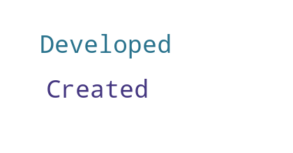

 
Leadership Skills :  ['Institute']

**************************************** WORLCLOUD FOR LEADERSHIP SKILLS ****************************************


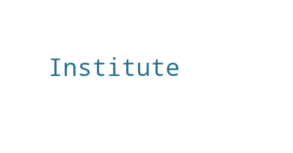

 
Teamwork Skills :  ['Worked', 'Managed', 'Team', 'Help']

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************


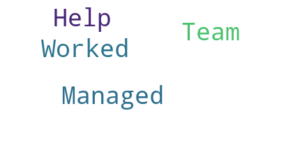

 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   ['Designed', 'Developed']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


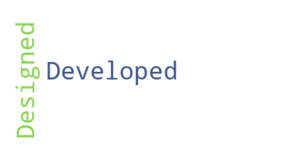

 
Measureable Results :   ['Saved']

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************


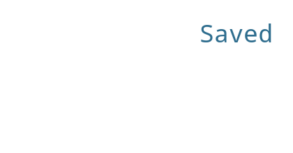

 
Result driven skills :   ['Saved']

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************


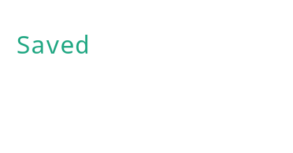

 
Strength :  ['S', 'Editing', 'Asp', 'Seo', 'History', 'Python', 'Sql', 'R', 'Automation', 'Android', 'Xml', 'Html', 'Java', 'Css', 'C']
 
Education :  [('MS', '2016'), 'ME']

Experience 0.4219178082191781

***************************************** WORLCLOUD FOR RESUME ****************************************


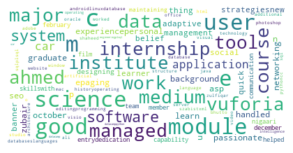


**************************************** WORLCLOUD FOR STRENGTH ****************************************


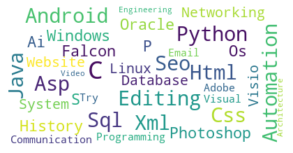


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


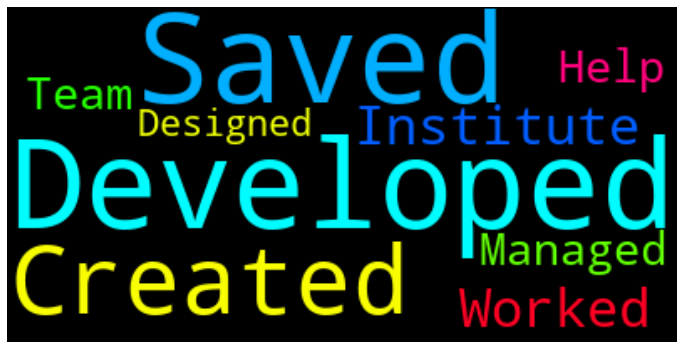


******************************************* SOFT SKILLS CLASSIFICATION **************************************



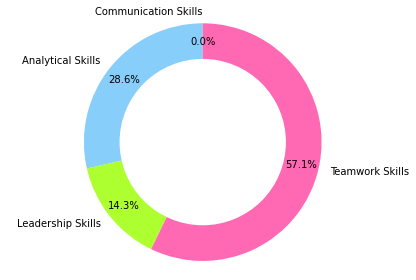


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



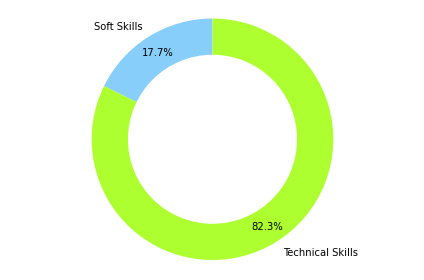

None
*******************************************
KEYWORDS
Stats learn (1)
ML data (2)
NLP data (2)
AI data (2)
Stats data (2)
DL data (2)
Python data (2)
NLP programming (1)
AI programming (1)
Stats programming (1)
DE programming (1)
Python programming (1)
AI java (1)
ML system (3)
NLP system (3)
AI system (3)
Stats system (3)
DE system (3)
DL system (3)
DE systems (2)
ML software (2)
NLP software (2)
AI software (2)
Stats software (2)
DE software (2)
DL software (2)
Python software (2)
Python based (1)
ML used (1)
NLP used (1)
DE used (1)
Python used (1)
DL use (1)
ML models (1)
********************DF********************
             Keywords_List
0          Stats learn (1)
1              ML data (2)
2             NLP data (2)
3              AI data (2)
4           Stats data (2)
5              DL data (2)
6          Python data (2)
7      NLP programming (1)
8       AI programming (1)
9    Stats programming (1)
10      DE programming (1)
11  Python programming (1)
12             AI j

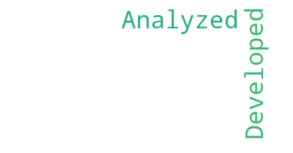

 
Leadership Skills :  []

**************************************** WORLCLOUD FOR LEADERSHIP SKILLS ****************************************
No leadership skill
 
Teamwork Skills :  ['Team', 'Supervised', 'Help']

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************


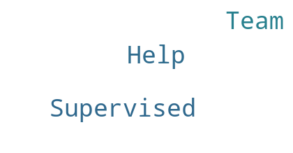

 
Communication Skills :  ['Summarize', 'Trained', 'Performed']

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************


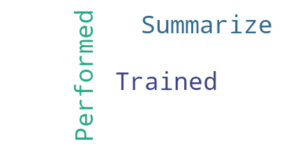

 
Action Verbs :   ['Analyzed', 'Trained', 'Developed', 'Introduced', 'Designed', 'Supervised', 'Performed', 'Earned']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


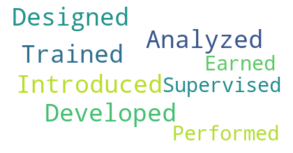

 
Measureable Results :   ['%']

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************
No measureable result
 
Result driven skills :   ['Advance']

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************


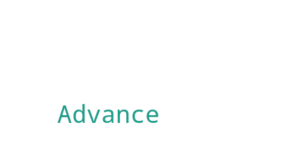

 
Strength :  ['Research', 'Statistics', 'Pandas', 'Postgresql', 'Python', 'Sql', 'Clustering', 'Algorithms', 'Opencv', 'Sqlite', 'Processing', 'Git']
 
Education :  []

Experience []

***************************************** WORLCLOUD FOR RESUME ****************************************


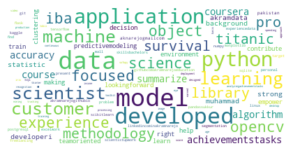


**************************************** WORLCLOUD FOR STRENGTH ****************************************


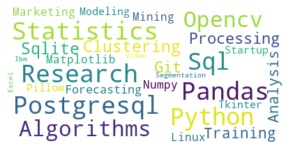


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


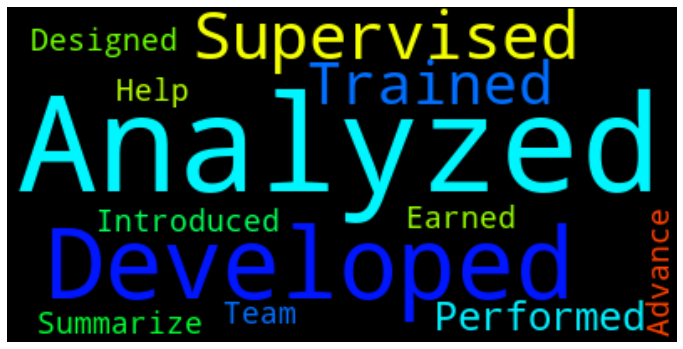


******************************************* SOFT SKILLS CLASSIFICATION **************************************



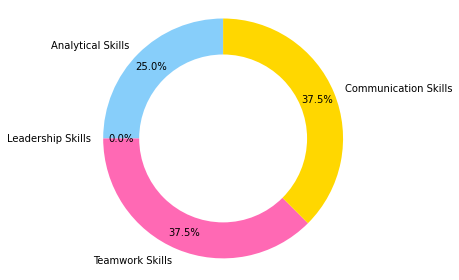


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



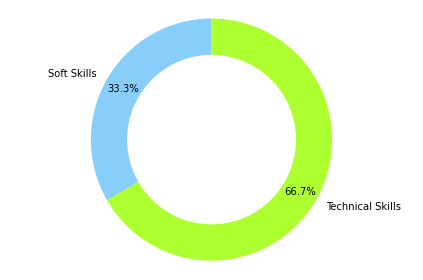

None
*******************************************
KEYWORDS
ML data (9)
NLP data (9)
AI data (9)
Stats data (9)
DL data (9)
Python data (9)
Python using (2)
ML models (1)
Stats learn (2)
AI processing (1)
Python based (1)
AI model (5)
ML learning (3)
NLP learning (3)
Stats learning (3)
DL learning (3)
Python learning (3)
********************DF********************
          Keywords_List
0           ML data (9)
1          NLP data (9)
2           AI data (9)
3        Stats data (9)
4           DL data (9)
5       Python data (9)
6      Python using (2)
7         ML models (1)
8       Stats learn (2)
9     AI processing (1)
10     Python based (1)
11         AI model (5)
12      ML learning (3)
13     NLP learning (3)
14   Stats learning (3)
15      DL learning (3)
16  Python learning (3)
["Akram's Resume"]
******************DATAF**************
    Candidate Name Subject      Keyword Count
0   akram's resume      ML        data      9
1   akram's resume     NLP        data      9
2   akram

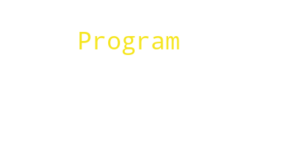

 
Leadership Skills :  []

**************************************** WORLCLOUD FOR LEADERSHIP SKILLS ****************************************
No leadership skill
 
Teamwork Skills :  ['Organized', 'Team']

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************


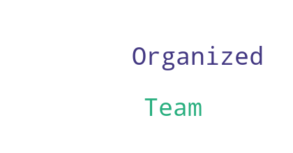

 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   ['Organized', 'Completed']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


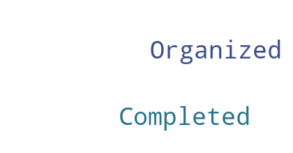

 
Measureable Results :   []

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************
No measureable result
 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Spanish', 'Research', 'Docker', 'Flask', 'Python', 'Security', 'Sql', 'Wordpress', 'Urdu', 'Sqa', 'English', 'Animation', 'Tensorflow', 'C']
 
Education :  []

Experience 0

***************************************** WORLCLOUD FOR RESUME ****************************************


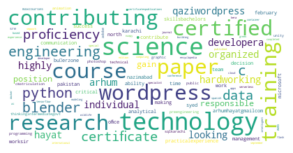


**************************************** WORLCLOUD FOR STRENGTH ****************************************


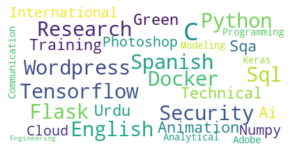


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


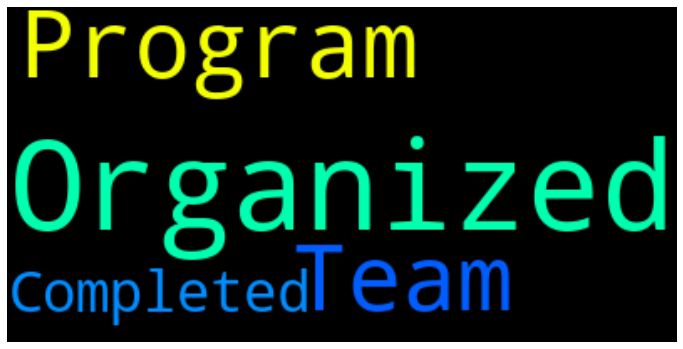


******************************************* SOFT SKILLS CLASSIFICATION **************************************



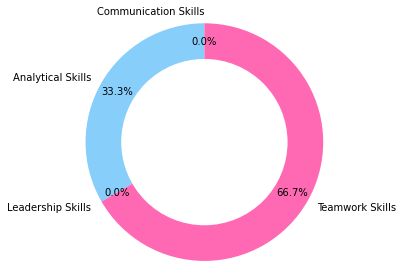


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



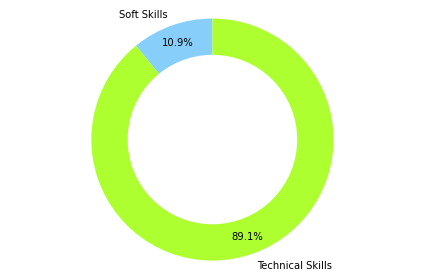

None
*******************************************
KEYWORDS
NLP programming (1)
AI programming (1)
Stats programming (1)
DE programming (1)
Python programming (1)
Python using (1)
Python based (1)
ML data (2)
NLP data (2)
AI data (2)
Stats data (2)
DL data (2)
Python data (2)
NLP development (1)
DE development (1)
Python development (1)
********************DF********************
             Keywords_List
0      NLP programming (1)
1       AI programming (1)
2    Stats programming (1)
3       DE programming (1)
4   Python programming (1)
5         Python using (1)
6         Python based (1)
7              ML data (2)
8             NLP data (2)
9              AI data (2)
10          Stats data (2)
11             DL data (2)
12         Python data (2)
13     NLP development (1)
14      DE development (1)
15  Python development (1)
["Arhum Hayat Qazi's Resume"]
******************DATAF**************
               Candidate Name Subject       Keyword Count
0   arhum hayat qazi's resume     N

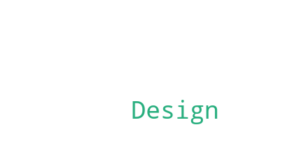

 
Teamwork Skills :  []

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************
No Teamwork skill
 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   ['Defined']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


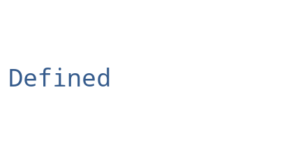

 
Measureable Results :   []

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************
No measureable result
 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Scheme', 'Bootstrap', 'Python', 'Javascript', 'Wordpress', 'Html', 'Css']
 
Education :  ['MS']

Experience []

***************************************** WORLCLOUD FOR RESUME ****************************************


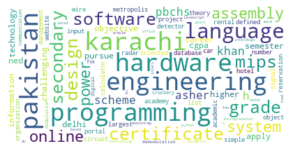


**************************************** WORLCLOUD FOR STRENGTH ****************************************


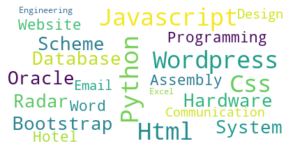


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


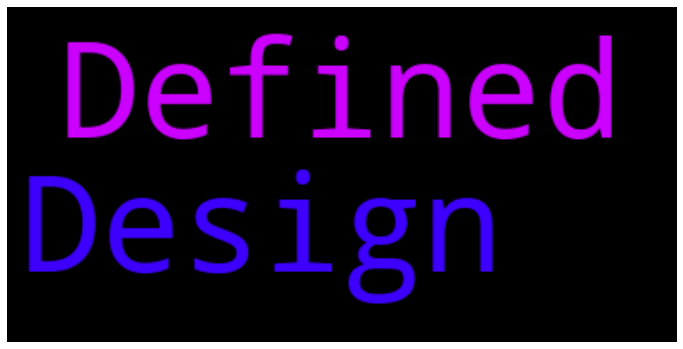


******************************************* SOFT SKILLS CLASSIFICATION **************************************



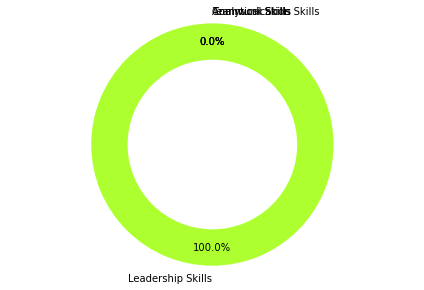


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



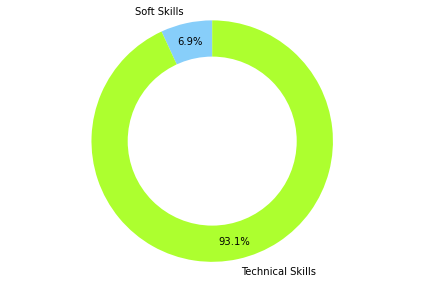

None
*******************************************
KEYWORDS
ML software (2)
NLP software (2)
AI software (2)
Stats software (2)
DE software (2)
DL software (2)
Python software (2)
NLP programming (4)
AI programming (4)
Stats programming (4)
DE programming (4)
Python programming (4)
ML system (4)
NLP system (4)
AI system (4)
Stats system (4)
DE system (4)
DL system (4)
ML used (1)
NLP used (1)
DE used (1)
Python used (1)
Python using (1)
AI language (2)
DE systems (2)
Python based (1)
********************DF********************
             Keywords_List
0          ML software (2)
1         NLP software (2)
2          AI software (2)
3       Stats software (2)
4          DE software (2)
5          DL software (2)
6      Python software (2)
7      NLP programming (4)
8       AI programming (4)
9    Stats programming (4)
10      DE programming (4)
11  Python programming (4)
12           ML system (4)
13          NLP system (4)
14           AI system (4)
15        Stats system (4)
16         

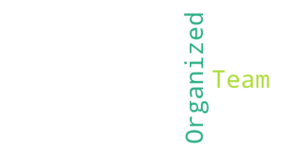

 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   ['Organized', 'Participated']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


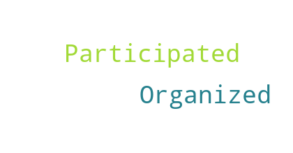

 
Measureable Results :   ['%']

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************
No measureable result
 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Research', 'Python', 'Music', 'Urdu', 'Html', 'English', 'Java', 'Css', 'C']
 
Education :  []

Experience []

***************************************** WORLCLOUD FOR RESUME ****************************************


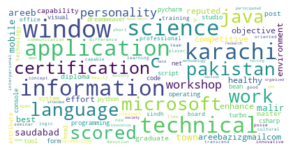


**************************************** WORLCLOUD FOR STRENGTH ****************************************


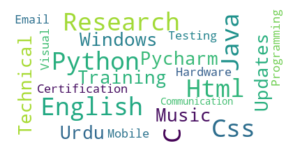


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


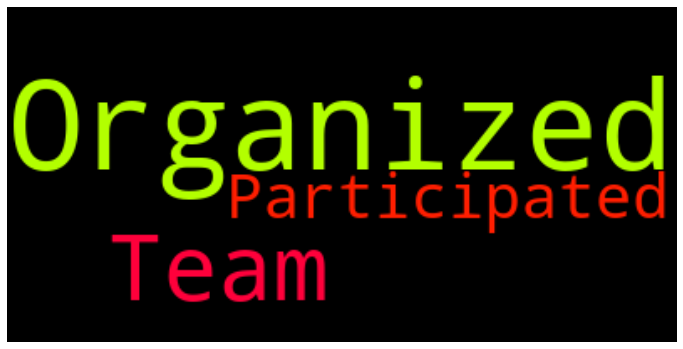


******************************************* SOFT SKILLS CLASSIFICATION **************************************



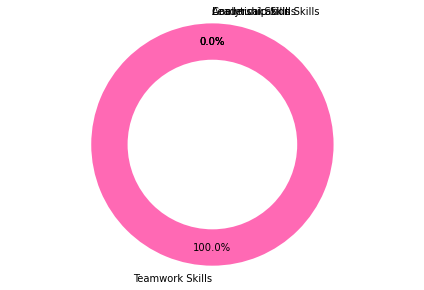


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



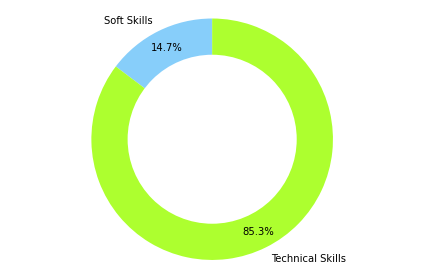

None
*******************************************
KEYWORDS
Stats may (1)
DE may (1)
DL may (1)
NLP programming (1)
AI programming (1)
Stats programming (1)
DE programming (1)
Python programming (1)
AI java (2)
DE systems (1)
ML learning (1)
NLP learning (1)
Stats learning (1)
DL learning (1)
Python learning (1)
ML software (1)
NLP software (1)
AI software (1)
Stats software (1)
DE software (1)
DL software (1)
Python software (1)
********************DF********************
             Keywords_List
0            Stats may (1)
1               DE may (1)
2               DL may (1)
3      NLP programming (1)
4       AI programming (1)
5    Stats programming (1)
6       DE programming (1)
7   Python programming (1)
8              AI java (2)
9           DE systems (1)
10         ML learning (1)
11        NLP learning (1)
12      Stats learning (1)
13         DL learning (1)
14     Python learning (1)
15         ML software (1)
16        NLP software (1)
17         AI software (1)
18      Stat

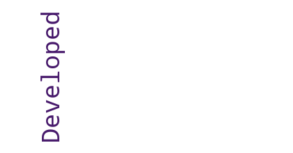

 
Leadership Skills :  []

**************************************** WORLCLOUD FOR LEADERSHIP SKILLS ****************************************
No leadership skill
 
Teamwork Skills :  ['Worked', 'Managing', 'Team']

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************


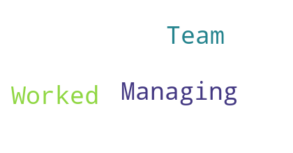

 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   ['Completed', 'Developed']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


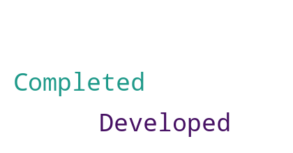

 
Measureable Results :   ['Sales']

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************


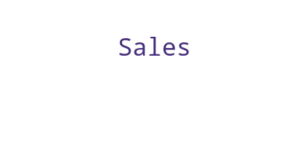

 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Bootstrap', 'Sql', 'Javascript', 'Sales', 'Mysql', 'Android', 'Urdu', 'Html', 'English', 'Firebase', 'Css']
 
Education :  ['BS']

Experience 0

***************************************** WORLCLOUD FOR RESUME ****************************************


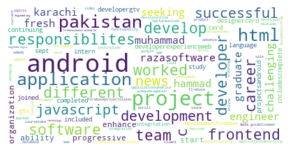


**************************************** WORLCLOUD FOR STRENGTH ****************************************


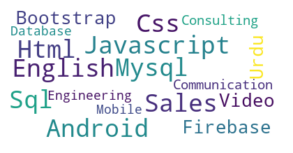


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


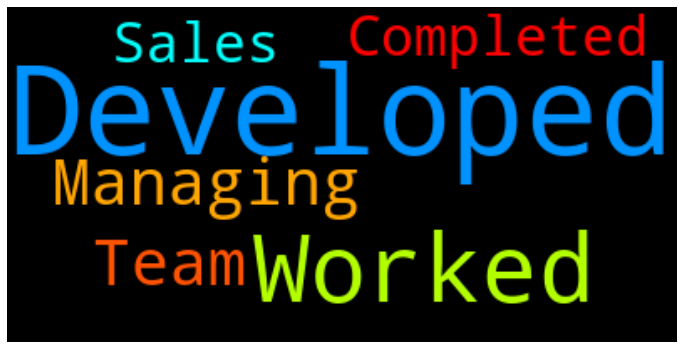


******************************************* SOFT SKILLS CLASSIFICATION **************************************



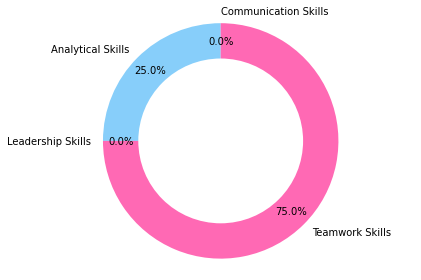


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



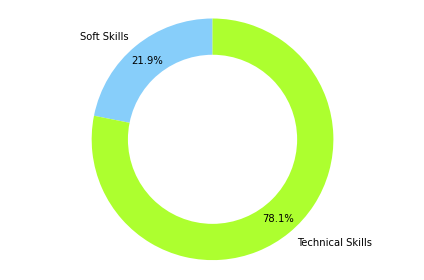

None
*******************************************
KEYWORDS
ML software (3)
NLP software (3)
AI software (3)
Stats software (3)
DE software (3)
DL software (3)
Python software (3)
Python using (2)
NLP development (4)
DE development (4)
Python development (4)
ML data (1)
NLP data (1)
AI data (1)
Stats data (1)
DL data (1)
Python data (1)
********************DF********************
             Keywords_List
0          ML software (3)
1         NLP software (3)
2          AI software (3)
3       Stats software (3)
4          DE software (3)
5          DL software (3)
6      Python software (3)
7         Python using (2)
8      NLP development (4)
9       DE development (4)
10  Python development (4)
11             ML data (1)
12            NLP data (1)
13             AI data (1)
14          Stats data (1)
15             DL data (1)
16         Python data (1)
['cv-HammadRaza']
******************DATAF**************
   Candidate Name Subject       Keyword Count
0   cv-hammadraza      ML     so

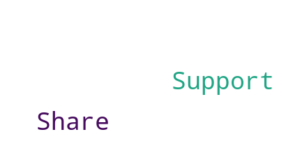

 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   []

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************
No action verbs
 
Measureable Results :   []

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************
No measureable result
 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Tensorflow', 'Pandas', 'Python', 'Electronics', 'Processing', 'Urdu', 'Rest', 'English', 'Git', 'Sap']
 
Education :  [('MS', '2018')]

Experience 0

***************************************** WORLCLOUD FOR RESUME ****************************************


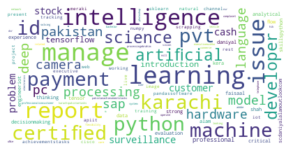


**************************************** WORLCLOUD FOR STRENGTH ****************************************


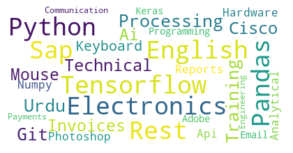


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


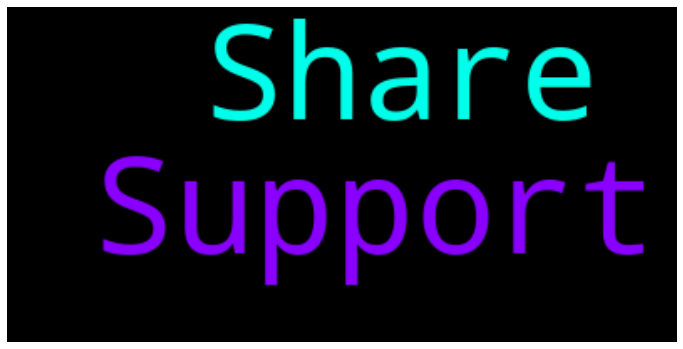


******************************************* SOFT SKILLS CLASSIFICATION **************************************



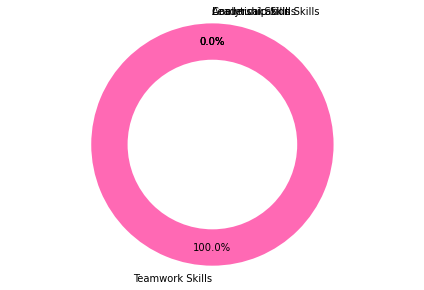


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



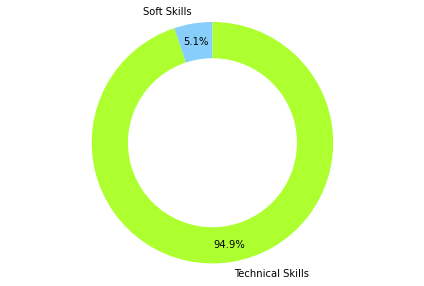

None
*******************************************
KEYWORDS
ML data (1)
NLP data (1)
AI data (1)
Stats data (1)
DL data (1)
Python data (1)
ML learning (5)
NLP learning (5)
Stats learning (5)
DL learning (5)
Python learning (5)
ML software (4)
NLP software (4)
AI software (4)
Stats software (4)
DE software (4)
DL software (4)
Python software (4)
AI processing (3)
ML models (1)
AI language (2)
DE systems (1)
NLP programming (1)
AI programming (1)
Stats programming (1)
DE programming (1)
Python programming (1)
Python using (1)
AI model (1)
********************DF********************
             Keywords_List
0              ML data (1)
1             NLP data (1)
2              AI data (1)
3           Stats data (1)
4              DL data (1)
5          Python data (1)
6          ML learning (5)
7         NLP learning (5)
8       Stats learning (5)
9          DL learning (5)
10     Python learning (5)
11         ML software (4)
12        NLP software (4)
13         AI software (4)
14      St

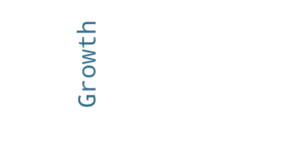

 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Python', 'Sql', 'Javascript', 'Mongodb', 'Urdu', 'English', 'C']
 
Education :  []

Experience 0

***************************************** WORLCLOUD FOR RESUME ****************************************


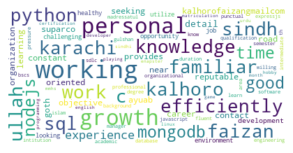


**************************************** WORLCLOUD FOR STRENGTH ****************************************


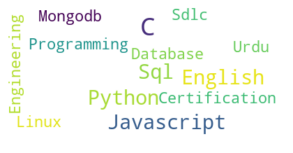


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


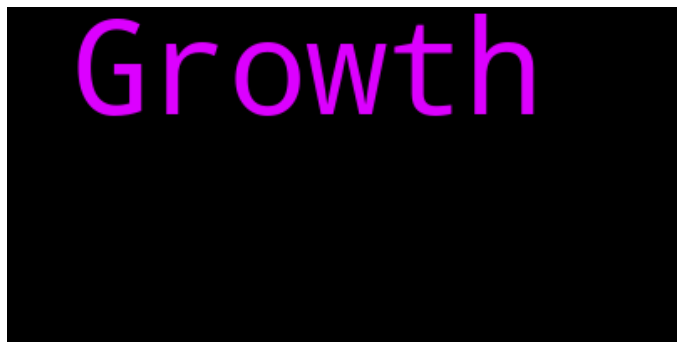


******************************************* SOFT SKILLS CLASSIFICATION **************************************



<ipython-input-39-14cbadeba58c>:202: MatplotlibDeprecationWarning: normalize=None does not normalize if the sum is less than 1 but this behavior is deprecated since 3.3 until two minor releases later. After the deprecation period the default value will be normalize=True. To prevent normalization pass normalize=False 
  plt.pie(data1, colors = colors, labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.85)


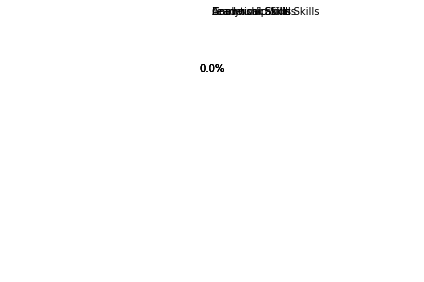


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



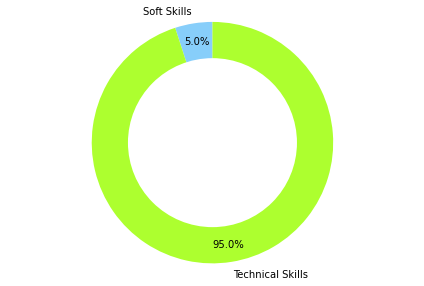

None
*******************************************
KEYWORDS
ML learning (1)
NLP learning (1)
Stats learning (1)
DL learning (1)
Python learning (1)
NLP development (1)
DE development (1)
Python development (1)
AI language (1)
ML software (1)
NLP software (1)
AI software (1)
Stats software (1)
DE software (1)
DL software (1)
Python software (1)
Stats learn (1)
NLP programming (1)
AI programming (1)
Stats programming (1)
DE programming (1)
Python programming (1)
********************DF********************
             Keywords_List
0          ML learning (1)
1         NLP learning (1)
2       Stats learning (1)
3          DL learning (1)
4      Python learning (1)
5      NLP development (1)
6       DE development (1)
7   Python development (1)
8          AI language (1)
9          ML software (1)
10        NLP software (1)
11         AI software (1)
12      Stats software (1)
13         DE software (1)
14         DL software (1)
15     Python software (1)
16         Stats learn (1)
17     N

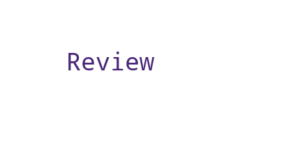

 
Teamwork Skills :  ['Review']

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************


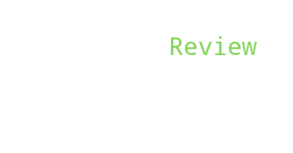

 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   []

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************
No action verbs
 
Measureable Results :   ['Growth']

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************


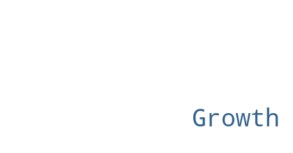

 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Bootstrap', 'Flask', 'Recruiting', 'Python', 'Sql', 'Javascript', 'Urdu', 'Html', 'English', 'Firebase', 'Css']
 
Education :  ['Me', ('BSC', '2015')]

Experience 0

***************************************** WORLCLOUD FOR RESUME ****************************************


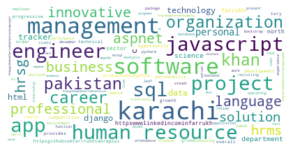


**************************************** WORLCLOUD FOR STRENGTH ****************************************


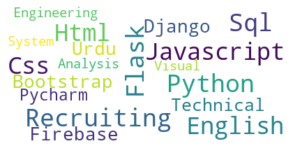


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


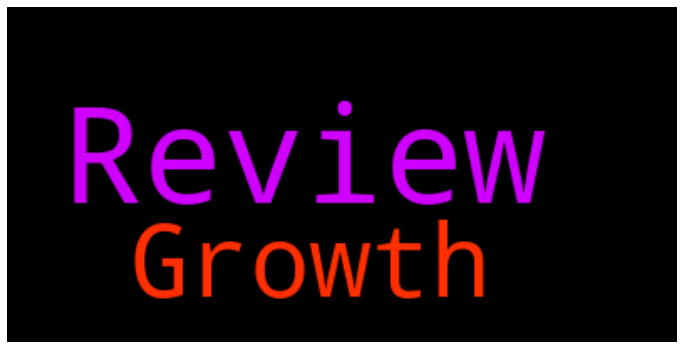


******************************************* SOFT SKILLS CLASSIFICATION **************************************



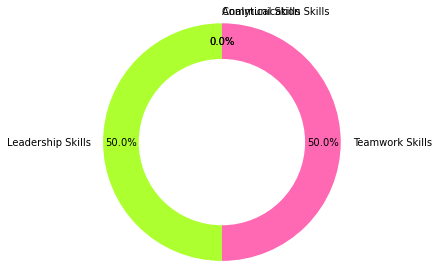


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



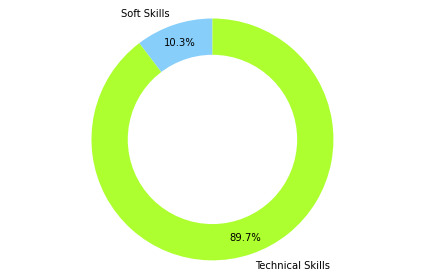

None
*******************************************
KEYWORDS
ML software (4)
NLP software (4)
AI software (4)
Stats software (4)
DE software (4)
DL software (4)
Python software (4)
NLP development (1)
DE development (1)
Python development (1)
DL also (1)
NLP business (2)
ML system (3)
NLP system (3)
AI system (3)
Stats system (3)
DE system (3)
DL system (3)
ML one (1)
Stats one (1)
DE one (1)
DL one (1)
Python one (1)
ML data (2)
NLP data (2)
AI data (2)
Stats data (2)
DL data (2)
Python data (2)
AI language (1)
********************DF********************
             Keywords_List
0          ML software (4)
1         NLP software (4)
2          AI software (4)
3       Stats software (4)
4          DE software (4)
5          DL software (4)
6      Python software (4)
7      NLP development (1)
8       DE development (1)
9   Python development (1)
10             DL also (1)
11        NLP business (2)
12           ML system (3)
13          NLP system (3)
14           AI system (3)
15        

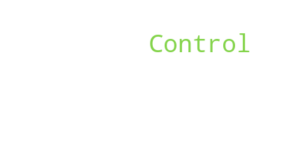

 
Teamwork Skills :  ['Team', 'Support']

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************


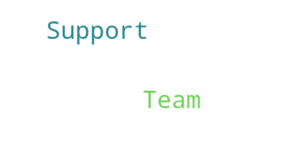

 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   ['Controlled']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


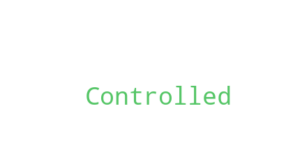

 
Measureable Results :   []

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************
No measureable result
 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Visualization', 'Bootstrap', 'Nosql', 'Python', 'Sql', 'Javascript', 'Jquery', 'Html', 'Analytics', 'Java', 'Css']
 
Education :  [('BE', '2018')]

Experience []

***************************************** WORLCLOUD FOR RESUME ****************************************


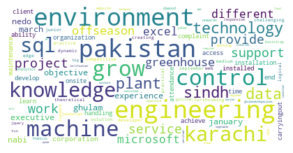


**************************************** WORLCLOUD FOR STRENGTH ****************************************


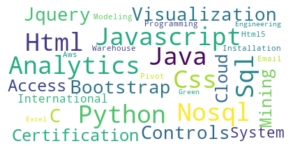


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


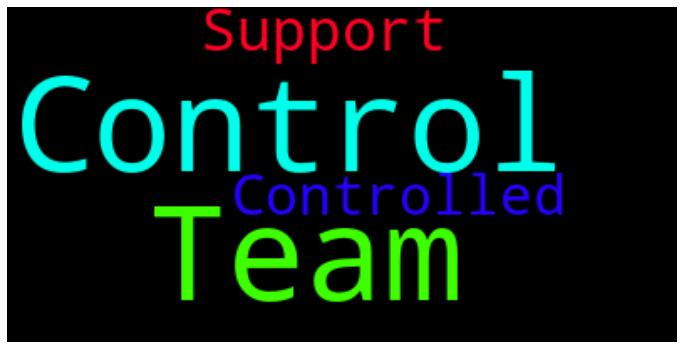


******************************************* SOFT SKILLS CLASSIFICATION **************************************



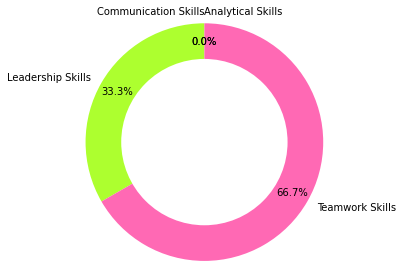


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



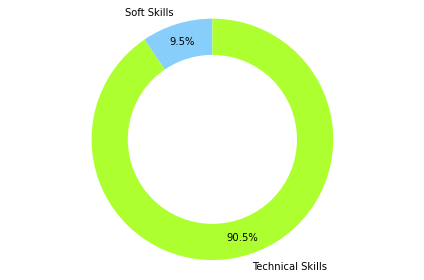

None
*******************************************
KEYWORDS
Stats learn (1)
Python using (1)
ML system (3)
NLP system (3)
AI system (3)
Stats system (3)
DE system (3)
DL system (3)
ML data (4)
NLP data (4)
AI data (4)
Stats data (4)
DL data (4)
Python data (4)
NLP business (1)
ML used (1)
NLP used (1)
DE used (1)
Python used (1)
NLP programming (1)
AI programming (1)
Stats programming (1)
DE programming (1)
Python programming (1)
AI java (1)
********************DF********************
             Keywords_List
0          Stats learn (1)
1         Python using (1)
2            ML system (3)
3           NLP system (3)
4            AI system (3)
5         Stats system (3)
6            DE system (3)
7            DL system (3)
8              ML data (4)
9             NLP data (4)
10             AI data (4)
11          Stats data (4)
12             DL data (4)
13         Python data (4)
14        NLP business (1)
15             ML used (1)
16            NLP used (1)
17             DE used (1)


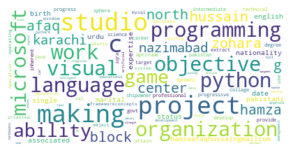


**************************************** WORLCLOUD FOR STRENGTH ****************************************


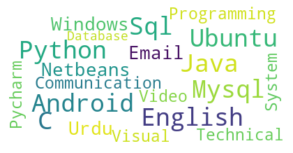


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************
 

******************************************* SOFT SKILLS CLASSIFICATION **************************************



<ipython-input-39-14cbadeba58c>:202: MatplotlibDeprecationWarning: normalize=None does not normalize if the sum is less than 1 but this behavior is deprecated since 3.3 until two minor releases later. After the deprecation period the default value will be normalize=True. To prevent normalization pass normalize=False 
  plt.pie(data1, colors = colors, labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.85)


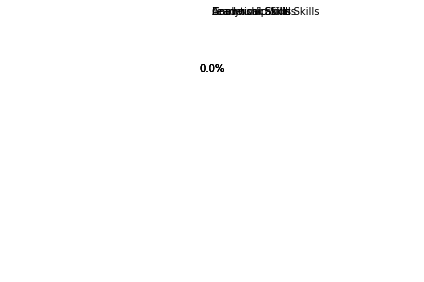


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



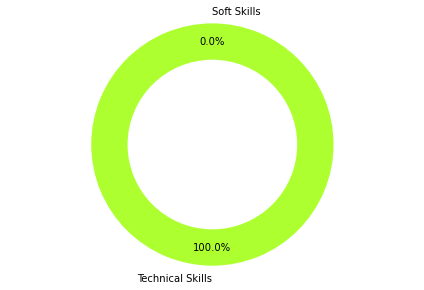

None
*******************************************
KEYWORDS
AI language (1)
DL use (1)
DL also (1)
NLP programming (2)
AI programming (2)
Stats programming (2)
DE programming (2)
Python programming (2)
AI java (1)
DE systems (1)
NLP development (1)
DE development (1)
Python development (1)
ML system (3)
NLP system (3)
AI system (3)
Stats system (3)
DE system (3)
DL system (3)
Python using (2)
********************DF********************
             Keywords_List
0          AI language (1)
1               DL use (1)
2              DL also (1)
3      NLP programming (2)
4       AI programming (2)
5    Stats programming (2)
6       DE programming (2)
7   Python programming (2)
8              AI java (1)
9           DE systems (1)
10     NLP development (1)
11      DE development (1)
12  Python development (1)
13           ML system (3)
14          NLP system (3)
15           AI system (3)
16        Stats system (3)
17           DE system (3)
18           DL system (3)
19        Python using 

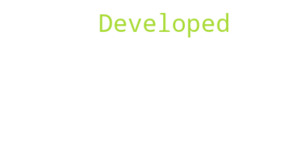

 
Leadership Skills :  ['Design', 'Control', 'Pioneer']

**************************************** WORLCLOUD FOR LEADERSHIP SKILLS ****************************************


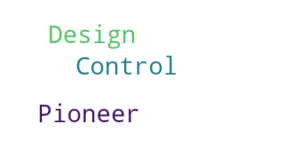

 
Teamwork Skills :  ['Worked', 'Supervised', 'Support']

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************


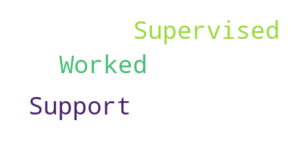

 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   ['Awarded', 'Motivated', 'Supervised', 'Developed']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


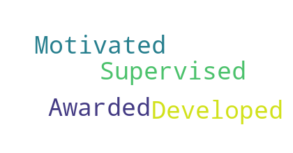

 
Measureable Results :   []

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************
No measureable result
 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Php', 'Python', 'Sql', 'Algorithms', 'Arduino', 'Git', 'Processing', 'Android', 'Urdu', 'English', 'Java', 'C']
 
Education :  [('BS', '2016')]

Experience []

***************************************** WORLCLOUD FOR RESUME ****************************************


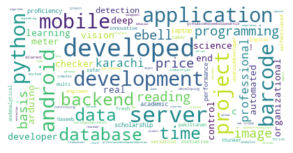


**************************************** WORLCLOUD FOR STRENGTH ****************************************


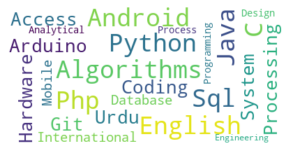


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


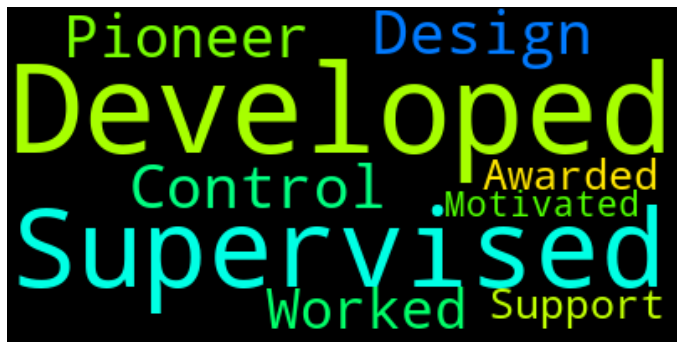


******************************************* SOFT SKILLS CLASSIFICATION **************************************



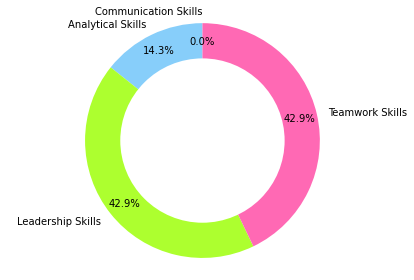


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



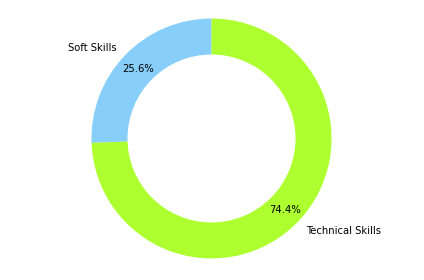

None
*******************************************
KEYWORDS
ML software (1)
NLP software (1)
AI software (1)
Stats software (1)
DE software (1)
DL software (1)
Python software (1)
DL also (1)
NLP development (5)
DE development (5)
Python development (5)
AI java (1)
ML learning (3)
NLP learning (3)
Stats learning (3)
DL learning (3)
Python learning (3)
ML data (3)
NLP data (3)
AI data (3)
Stats data (3)
DL data (3)
Python data (3)
NLP programming (3)
AI programming (3)
Stats programming (3)
DE programming (3)
Python programming (3)
ML system (8)
NLP system (8)
AI system (8)
Stats system (8)
DE system (8)
DL system (8)
Python using (3)
NLP business (1)
Stats process (1)
ML used (2)
NLP used (2)
DE used (2)
Python used (2)
AI processing (1)
Stats learn (1)
********************DF********************
             Keywords_List
0          ML software (1)
1         NLP software (1)
2          AI software (1)
3       Stats software (1)
4          DE software (1)
5          DL software (1)
6     

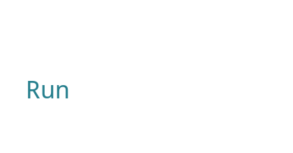

 
Leadership Skills :  ['Design']

**************************************** WORLCLOUD FOR LEADERSHIP SKILLS ****************************************


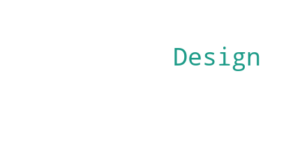

 
Teamwork Skills :  ['Worked', 'Team']

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************


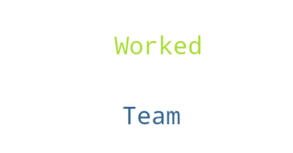

 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   ['Prepared', 'Integrated']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


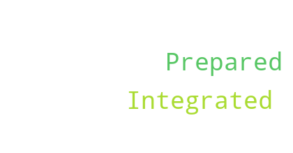

 
Measureable Results :   ['%', 'Saved']

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************


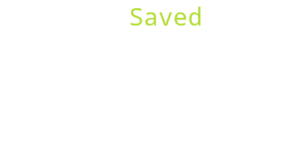

 
Result driven skills :   ['Save', 'Saved']

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************


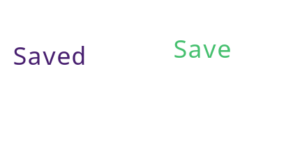

 
Strength :  ['Logistics', 'Php', 'Postgresql', 'Python', 'Sql', 'Javascript', 'Mysql', 'Wordpress', 'Matlab', 'Html', 'Android', 'Css']
 
Education :  ['MS']

Experience []

***************************************** WORLCLOUD FOR RESUME ****************************************


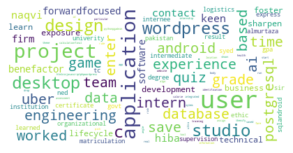


**************************************** WORLCLOUD FOR STRENGTH ****************************************


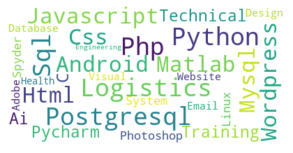


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


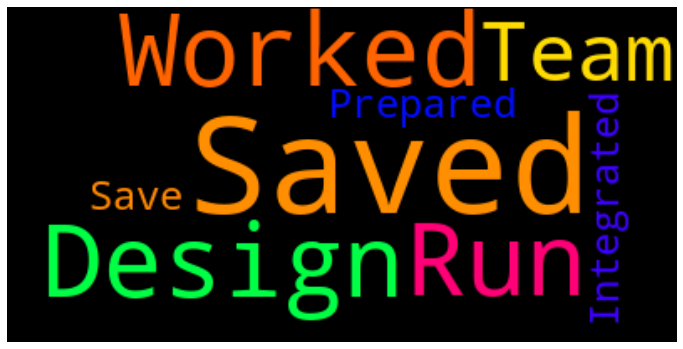


******************************************* SOFT SKILLS CLASSIFICATION **************************************



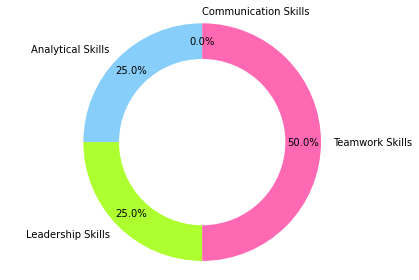


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



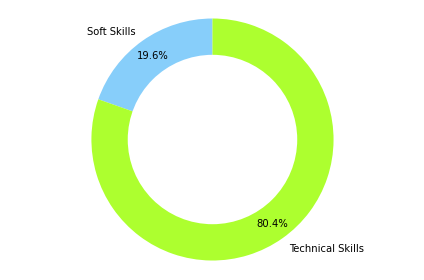

None
*******************************************
KEYWORDS
ML software (1)
NLP software (1)
AI software (1)
Stats software (1)
DE software (1)
DL software (1)
Python software (1)
NLP development (1)
DE development (1)
Python development (1)
NLP business (1)
Stats learn (1)
ML system (2)
NLP system (2)
AI system (2)
Stats system (2)
DE system (2)
DL system (2)
Python based (2)
Python using (5)
ML data (2)
NLP data (2)
AI data (2)
Stats data (2)
DL data (2)
Python data (2)
********************DF********************
             Keywords_List
0          ML software (1)
1         NLP software (1)
2          AI software (1)
3       Stats software (1)
4          DE software (1)
5          DL software (1)
6      Python software (1)
7      NLP development (1)
8       DE development (1)
9   Python development (1)
10        NLP business (1)
11         Stats learn (1)
12           ML system (2)
13          NLP system (2)
14           AI system (2)
15        Stats system (2)
16           DE system 

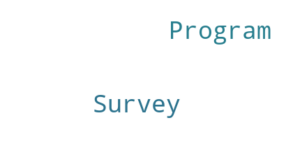

 
Leadership Skills :  ['Design']

**************************************** WORLCLOUD FOR LEADERSHIP SKILLS ****************************************


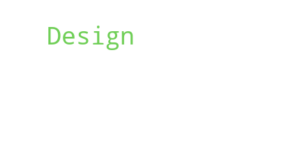

 
Teamwork Skills :  ['Team']

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************


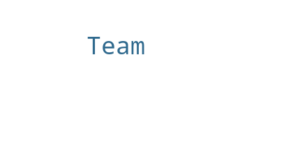

 
Communication Skills :  ['Trained']

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************


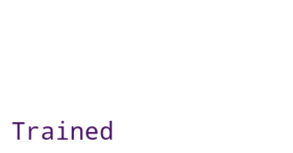

 
Action Verbs :   ['Collected', 'Trained', 'Calculated']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


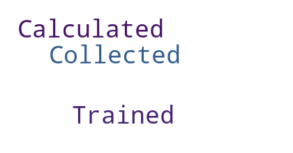

 
Measureable Results :   ['Average', '%']

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************


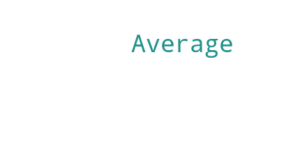

 
Result driven skills :   ['Fixed', 'Lower']

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************


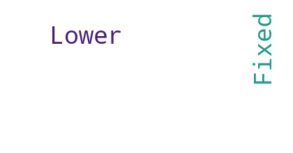

 
Strength :  ['Communications', 'Tensorflow', 'Statistics', 'Pandas', 'Poetry', 'Python', 'Writing', 'Sql', 'Music', 'R', 'Matlab', 'Urdu', 'English', 'Reviews', 'Tableau', 'Github']
 
Education :  [('BS', '2019')]

Experience []

***************************************** WORLCLOUD FOR RESUME ****************************************


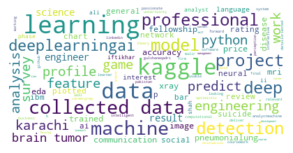


**************************************** WORLCLOUD FOR STRENGTH ****************************************


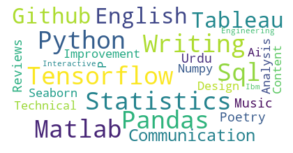


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


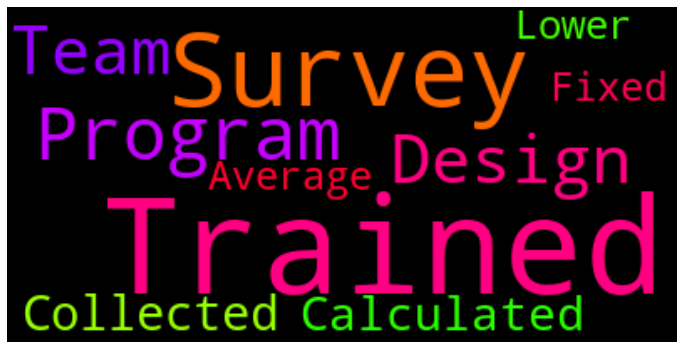


******************************************* SOFT SKILLS CLASSIFICATION **************************************



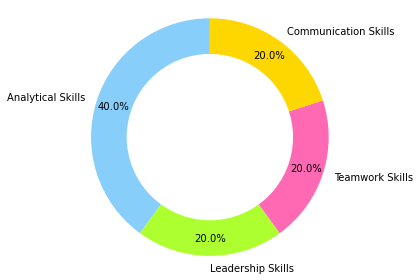


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



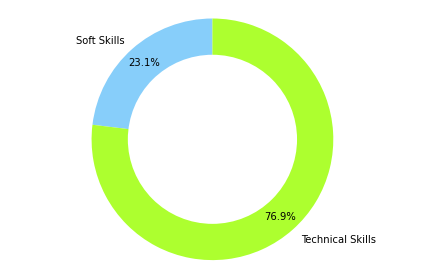

None
*******************************************
KEYWORDS
ML data (12)
NLP data (12)
AI data (12)
Stats data (12)
DL data (12)
Python data (12)
ML learning (9)
NLP learning (9)
Stats learning (9)
DL learning (9)
Python learning (9)
NLP business (1)
ML software (1)
NLP software (1)
AI software (1)
Stats software (1)
DE software (1)
DL software (1)
Python software (1)
DE systems (1)
Python using (4)
NLP development (1)
DE development (1)
Python development (1)
Stats learn (1)
AI model (4)
AI language (1)
********************DF********************
             Keywords_List
0             ML data (12)
1            NLP data (12)
2             AI data (12)
3          Stats data (12)
4             DL data (12)
5         Python data (12)
6          ML learning (9)
7         NLP learning (9)
8       Stats learning (9)
9          DL learning (9)
10     Python learning (9)
11        NLP business (1)
12         ML software (1)
13        NLP software (1)
14         AI software (1)
15      Stats sof

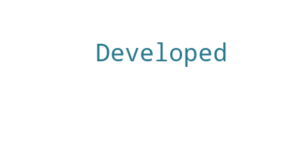

 
Leadership Skills :  []

**************************************** WORLCLOUD FOR LEADERSHIP SKILLS ****************************************
No leadership skill
 
Teamwork Skills :  ['Team']

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************


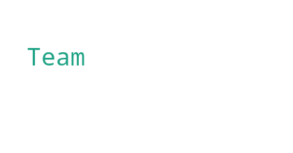

 
Communication Skills :  ['Wrote', 'Author']

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************


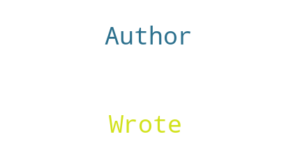

 
Action Verbs :   ['Provided', 'Developed']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


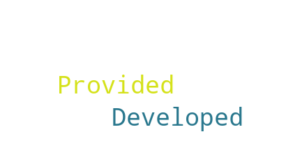

 
Measureable Results :   ['%', 'Growth']

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************


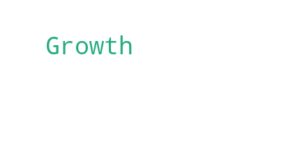

 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Research', 'Bootstrap', 'Seo', 'Php', 'Codeigniter', 'Wordpress', 'Urdu', 'Html', 'English', 'Analytics', 'Css']
 
Education :  [('XII', '2018'), 'MS']

Experience 0

***************************************** WORLCLOUD FOR RESUME ****************************************


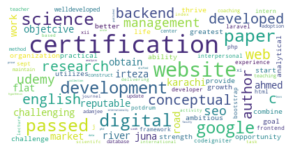


**************************************** WORLCLOUD FOR STRENGTH ****************************************


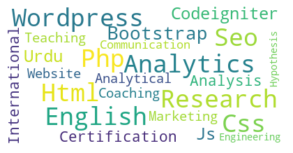


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


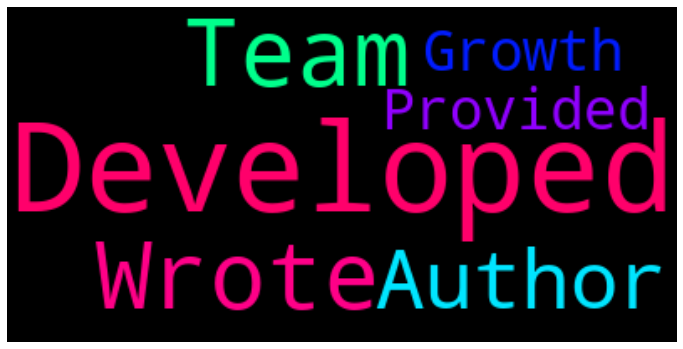


******************************************* SOFT SKILLS CLASSIFICATION **************************************



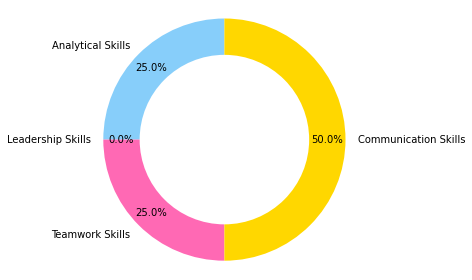


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



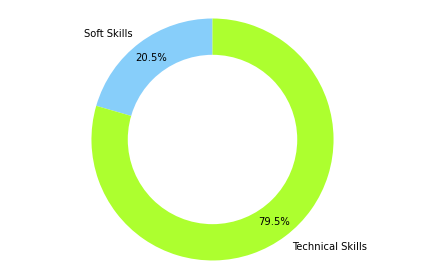

None
*******************************************
KEYWORDS
Python using (1)
AI methods (1)
Python based (1)
ML data (1)
NLP data (1)
AI data (1)
Stats data (1)
DL data (1)
Python data (1)
Stats may (1)
DE may (1)
DL may (1)
AI model (1)
NLP development (3)
DE development (3)
Python development (3)
********************DF********************
             Keywords_List
0         Python using (1)
1           AI methods (1)
2         Python based (1)
3              ML data (1)
4             NLP data (1)
5              AI data (1)
6           Stats data (1)
7              DL data (1)
8          Python data (1)
9            Stats may (1)
10              DE may (1)
11              DL may (1)
12            AI model (1)
13     NLP development (3)
14      DE development (3)
15  Python development (3)
['irtezaRessume']
******************DATAF**************
   Candidate Name Subject       Keyword Count
0   irtezaressume  Python        using      1
1   irtezaressume      AI      methods      1
2   ir

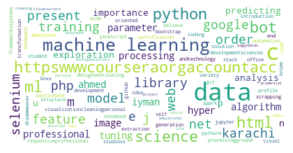


**************************************** WORLCLOUD FOR STRENGTH ****************************************


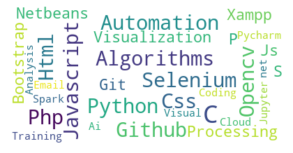


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************
 

******************************************* SOFT SKILLS CLASSIFICATION **************************************



<ipython-input-39-14cbadeba58c>:202: MatplotlibDeprecationWarning: normalize=None does not normalize if the sum is less than 1 but this behavior is deprecated since 3.3 until two minor releases later. After the deprecation period the default value will be normalize=True. To prevent normalization pass normalize=False 
  plt.pie(data1, colors = colors, labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.85)


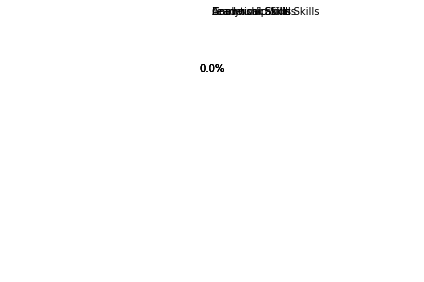


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



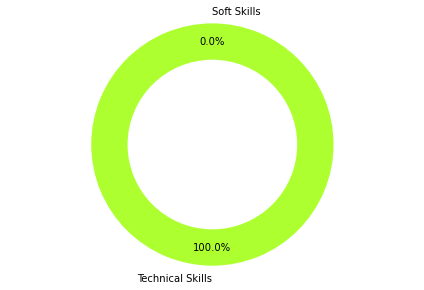

None
*******************************************
KEYWORDS
ML learning (4)
NLP learning (4)
Stats learning (4)
DL learning (4)
Python learning (4)
AI processing (2)
ML models (2)
ML data (9)
NLP data (9)
AI data (9)
Stats data (9)
DL data (9)
Python data (9)
NLP development (2)
DE development (2)
Python development (2)
DE systems (1)
********************DF********************
             Keywords_List
0          ML learning (4)
1         NLP learning (4)
2       Stats learning (4)
3          DL learning (4)
4      Python learning (4)
5        AI processing (2)
6            ML models (2)
7              ML data (9)
8             NLP data (9)
9              AI data (9)
10          Stats data (9)
11             DL data (9)
12         Python data (9)
13     NLP development (2)
14      DE development (2)
15  Python development (2)
16          DE systems (1)
["Iyman Ahmed's Resume 2"]
******************DATAF**************
            Candidate Name Subject       Keyword Count
0   iyman ahmed'

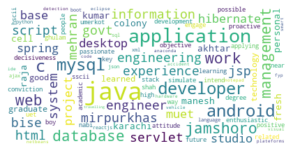


**************************************** WORLCLOUD FOR STRENGTH ****************************************


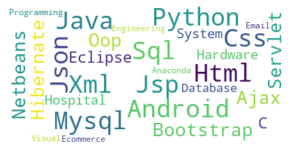


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************
 

******************************************* SOFT SKILLS CLASSIFICATION **************************************



<ipython-input-39-14cbadeba58c>:202: MatplotlibDeprecationWarning: normalize=None does not normalize if the sum is less than 1 but this behavior is deprecated since 3.3 until two minor releases later. After the deprecation period the default value will be normalize=True. To prevent normalization pass normalize=False 
  plt.pie(data1, colors = colors, labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.85)


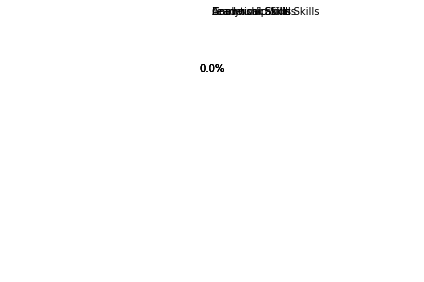


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



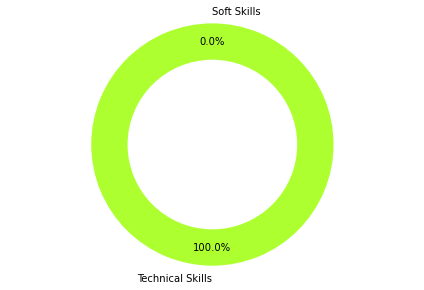

None
*******************************************
KEYWORDS
DE systems (2)
NLP development (1)
DE development (1)
Python development (1)
ML system (5)
NLP system (5)
AI system (5)
Stats system (5)
DE system (5)
DL system (5)
ML learning (1)
NLP learning (1)
Stats learning (1)
DL learning (1)
Python learning (1)
AI java (9)
AI language (1)
Python using (2)
NLP programming (1)
AI programming (1)
Stats programming (1)
DE programming (1)
Python programming (1)
********************DF********************
             Keywords_List
0           DE systems (2)
1      NLP development (1)
2       DE development (1)
3   Python development (1)
4            ML system (5)
5           NLP system (5)
6            AI system (5)
7         Stats system (5)
8            DE system (5)
9            DL system (5)
10         ML learning (1)
11        NLP learning (1)
12      Stats learning (1)
13         DL learning (1)
14     Python learning (1)
15             AI java (9)
16         AI language (1)
17        Py

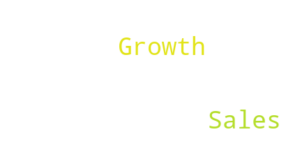

 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Sql', 'Sales', 'Basic', 'Java', 'C']
 
Education :  []

Experience 0.4191780821917808

***************************************** WORLCLOUD FOR RESUME ****************************************


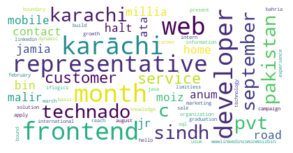


**************************************** WORLCLOUD FOR STRENGTH ****************************************


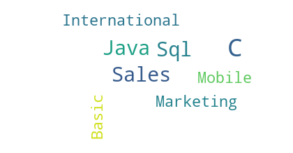


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


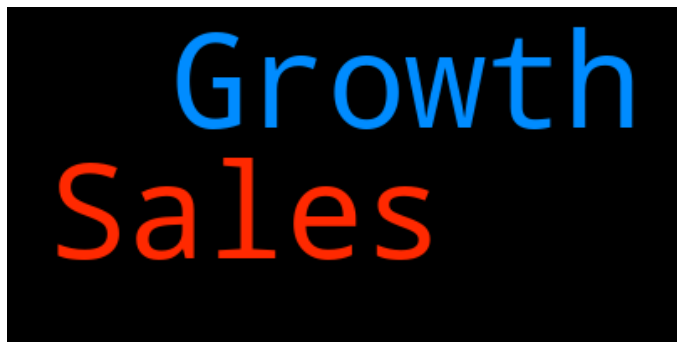


******************************************* SOFT SKILLS CLASSIFICATION **************************************



<ipython-input-39-14cbadeba58c>:202: MatplotlibDeprecationWarning: normalize=None does not normalize if the sum is less than 1 but this behavior is deprecated since 3.3 until two minor releases later. After the deprecation period the default value will be normalize=True. To prevent normalization pass normalize=False 
  plt.pie(data1, colors = colors, labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.85)


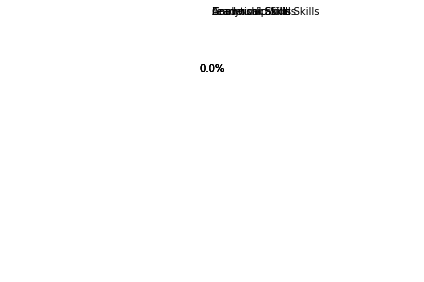


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



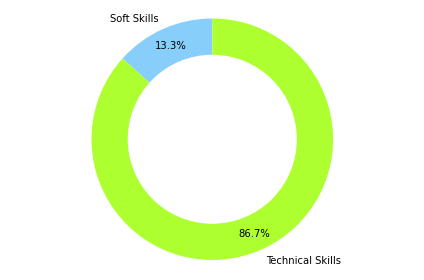

None
*******************************************
KEYWORDS
AI java (1)
********************DF********************
  Keywords_List
0   AI java (1)
['MOIZ BIN ATA LinkedIn CV (1)']
******************DATAF**************
                 Candidate Name Subject Keyword Count
0  moiz bin ata linkedin cv (1)      AI   java      1
Name :  Anum Homes

Email :  abdulmoiz6789@gmail.com

Phone :  2264041

Techincal Skills :  ['C++', 'Sql', 'Sales', 'Marketing', 'International', 'Mobile', 'Java', 'C']

Analytical Skills :  []

**************************************** WORLCLOUD FOR ANALYTICAL SKILLS ****************************************
No analytical skill
 
Leadership Skills :  []

**************************************** WORLCLOUD FOR LEADERSHIP SKILLS ****************************************
No leadership skill
 
Teamwork Skills :  []

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************
No Teamwork skill
 
Communication Skills :  []

*

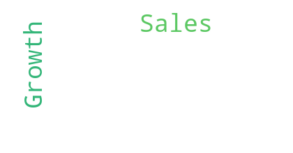

 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Sql', 'Sales', 'Basic', 'Java', 'C']
 
Education :  []

Experience 0.4191780821917808

***************************************** WORLCLOUD FOR RESUME ****************************************


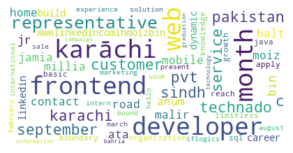


**************************************** WORLCLOUD FOR STRENGTH ****************************************


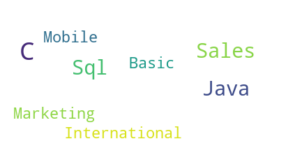


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


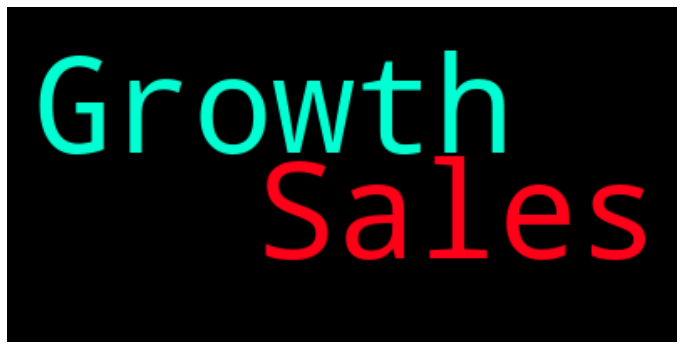


******************************************* SOFT SKILLS CLASSIFICATION **************************************



<ipython-input-39-14cbadeba58c>:202: MatplotlibDeprecationWarning: normalize=None does not normalize if the sum is less than 1 but this behavior is deprecated since 3.3 until two minor releases later. After the deprecation period the default value will be normalize=True. To prevent normalization pass normalize=False 
  plt.pie(data1, colors = colors, labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.85)


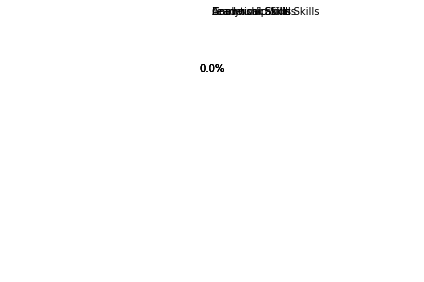


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



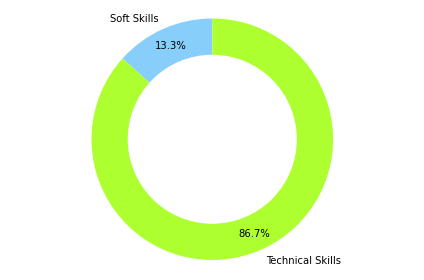

None
*******************************************
KEYWORDS
AI java (1)
********************DF********************
  Keywords_List
0   AI java (1)
['MOIZ BIN ATA LinkedIn CV']
******************DATAF**************
             Candidate Name Subject Keyword Count
0  moiz bin ata linkedin cv      AI   java      1
Name :  Muhammad Faraz

Email :  farazozair@gmail.com

Phone :  +92-304-3543715

Techincal Skills :  ['Training', 'Physics', 'C++', 'Chemistry', 'Python', 'Access', 'Sql', 'Cloud', 'Marketing', 'Wordpress', 'System', 'English', 'Database', 'Mathematics', 'Analytical', 'C']

Analytical Skills :  ['Developed']

**************************************** WORLCLOUD FOR ANALYTICAL SKILLS ****************************************


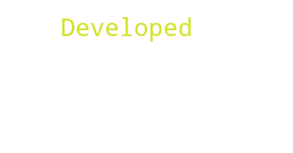

 
Leadership Skills :  []

**************************************** WORLCLOUD FOR LEADERSHIP SKILLS ****************************************
No leadership skill
 
Teamwork Skills :  ['Team']

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************


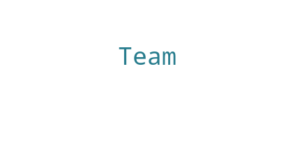

 
Communication Skills :  ['Trained']

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************


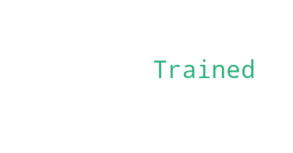

 
Action Verbs :   ['Trained', 'Developed', 'Implemented']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


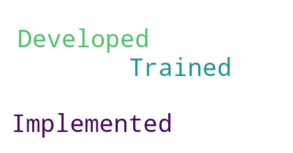

 
Measureable Results :   []

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************
No measureable result
 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Physics', 'Chemistry', 'Python', 'Sql', 'Wordpress', 'Urdu', 'English', 'Prestashop', 'Mathematics', 'C']
 
Education :  [('BS', '2018'), ('MS', '2016')]

Experience []

***************************************** WORLCLOUD FOR RESUME ****************************************


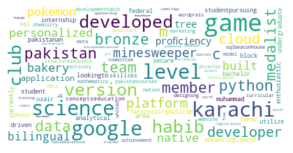


**************************************** WORLCLOUD FOR STRENGTH ****************************************


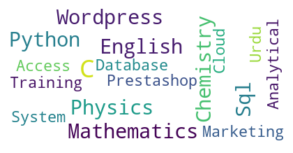


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


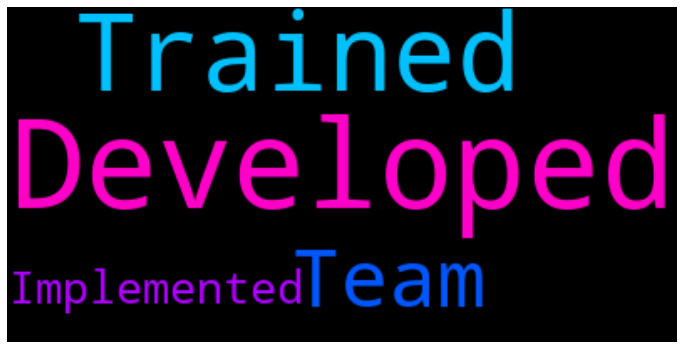


******************************************* SOFT SKILLS CLASSIFICATION **************************************



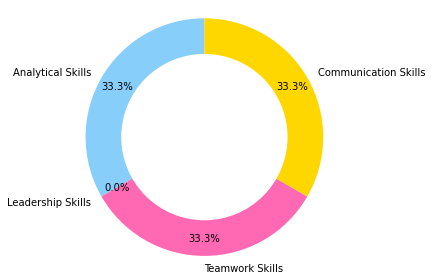


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



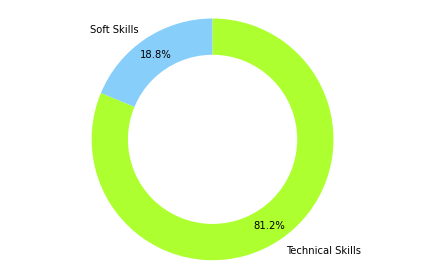

None
*******************************************
KEYWORDS
NLP development (1)
DE development (1)
Python development (1)
ML data (2)
NLP data (2)
AI data (2)
Stats data (2)
DL data (2)
Python data (2)
ML system (2)
NLP system (2)
AI system (2)
Stats system (2)
DE system (2)
DL system (2)
AI model (1)
Python using (2)
ML used (1)
NLP used (1)
DE used (1)
Python used (1)
********************DF********************
             Keywords_List
0      NLP development (1)
1       DE development (1)
2   Python development (1)
3              ML data (2)
4             NLP data (2)
5              AI data (2)
6           Stats data (2)
7              DL data (2)
8          Python data (2)
9            ML system (2)
10          NLP system (2)
11           AI system (2)
12        Stats system (2)
13           DE system (2)
14           DL system (2)
15            AI model (1)
16        Python using (2)
17             ML used (1)
18            NLP used (1)
19             DE used (1)
20         Python u

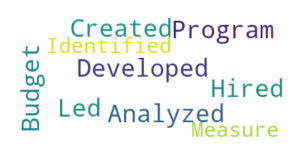

 
Leadership Skills :  ['Oversee', 'Design', 'Review', 'Coach', 'Produce', 'Streamlined']

**************************************** WORLCLOUD FOR LEADERSHIP SKILLS ****************************************


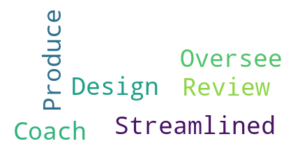

 
Teamwork Skills :  ['Review', 'Support', 'Managed', 'Conducted', 'Managing', 'Share', 'Planned', 'Team', 'Plan']

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************


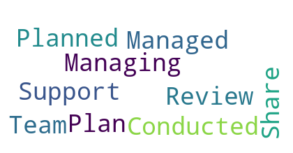

 
Communication Skills :  ['Translate', 'Trained', 'Summarize', 'Wrote', 'Define', 'Performed', 'Negotiated']

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************


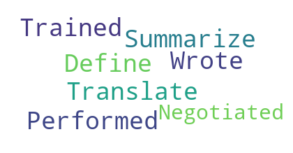

 
Action Verbs :   ['Supported', 'Analyzed', 'Led', 'Conducted', 'Designed', 'Founded', 'Established', 'Negotiated', 'Defined', 'Identified', 'Performed', 'Spearheaded', 'Evaluated', 'Implemented', 'Launched', 'Executed', 'Directed', 'Trained', 'Arranged', 'Introduced', 'Integrated', 'Streamlined', 'Planned', 'Provided', 'Developed', 'Projected', 'Structured']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


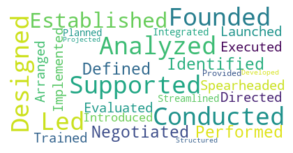

 
Measureable Results :   ['Increased', '%', '$', 'Sales', 'Revenue', 'Volume']

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************


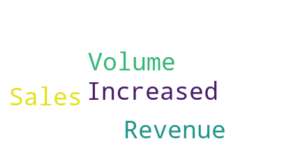

 
Result driven skills :   ['Solve', 'Upgrade', 'Maximize']

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************


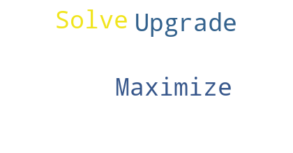

 
Strength :  ['Communications', 'History', 'Unix', 'Algorithms', 'Microservices', 'Statistics', 'Python', 'Sales', 'Opencv', 'Budgeting', 'Xml', 'Reviews', 'Tableau', 'Analytics', 'Dynamodb', 'Scrum', 'Saas', 'Licensing', 'Driving', 'Typing', 'Research', 'Security', 'Drawing', 'Cognos', 'Itsm', 'Tensorflow']
 
Education :  ['x']

Experience 7.750684931506849

***************************************** WORLCLOUD FOR RESUME ****************************************


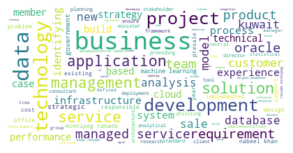


**************************************** WORLCLOUD FOR STRENGTH ****************************************


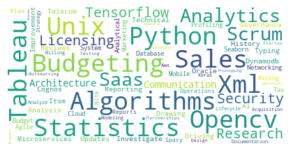


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


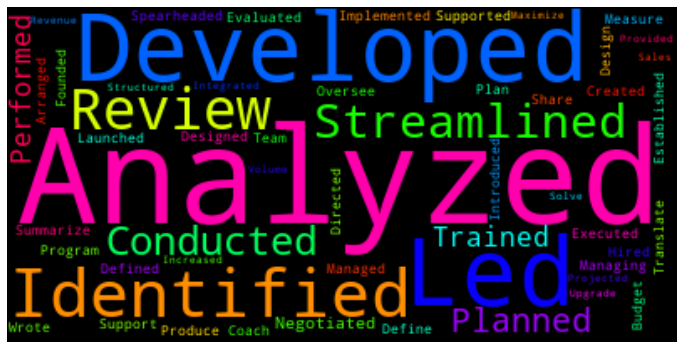


******************************************* SOFT SKILLS CLASSIFICATION **************************************



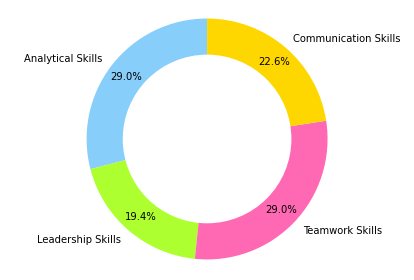


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



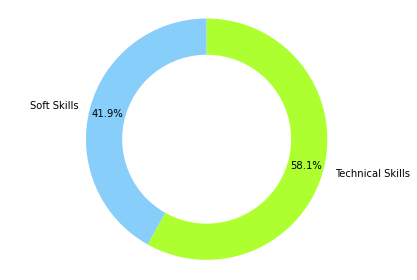

None
*******************************************
KEYWORDS
NLP business (28)
Python based (9)
ML data (21)
NLP data (21)
AI data (21)
Stats data (21)
DL data (21)
Python data (21)
ML models (5)
DE systems (6)
Python using (12)
NLP development (15)
DE development (15)
Python development (15)
Stats process (5)
ML learning (9)
NLP learning (9)
Stats learning (9)
DL learning (9)
Python learning (9)
AI various (2)
AI methods (1)
Stats learn (2)
DL use (3)
AI model (3)
ML system (8)
NLP system (8)
AI system (8)
Stats system (8)
DE system (8)
DL system (8)
ML used (2)
NLP used (2)
DE used (2)
Python used (2)
ML one (1)
Stats one (1)
DE one (1)
DL one (1)
Python one (1)
DL also (1)
********************DF********************
              Keywords_List
0         NLP business (28)
1          Python based (9)
2              ML data (21)
3             NLP data (21)
4              AI data (21)
5           Stats data (21)
6              DL data (21)
7          Python data (21)
8             ML models

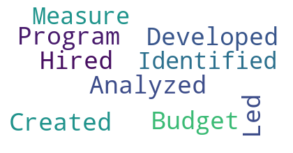

 
Leadership Skills :  ['Oversee', 'Design', 'Coordinate', 'Implement', 'Produce']

**************************************** WORLCLOUD FOR LEADERSHIP SKILLS ****************************************


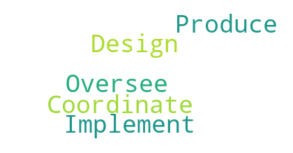

 
Teamwork Skills :  ['Organized', 'Coordinate', 'Support', 'Worked', 'Managed', 'Conducted', 'Managing', 'Supervised', 'Help', 'Share', 'Planned', 'Team']

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************


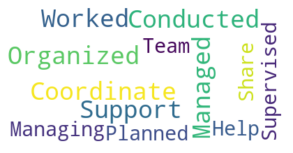

 
Communication Skills :  ['Trained', 'Wrote', 'Define', 'Collaborated', 'Conveyed', 'Performed']

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************


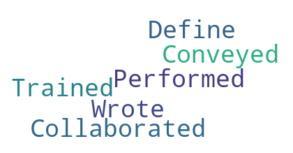

 
Action Verbs :   ['Supported', 'Analyzed', 'Scheduled', 'Led', 'Conducted', 'Designed', 'Participated', 'Organized', 'Collaborated', 'Defined', 'Identified', 'Performed', 'Spearheaded', 'Evaluated', 'Implemented', 'Executed', 'Directed', 'Trained', 'Arranged', 'Integrated', 'Planned', 'Coordinated', 'Developed', 'Supervised', 'Systematized', 'Structured']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


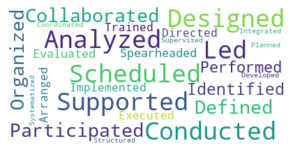

 
Measureable Results :   ['Increased', '%', '$', 'Growth', 'Sales', 'Revenue', 'Volume']

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************


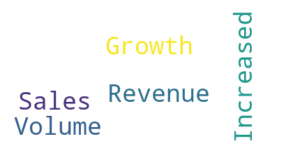

 
Result driven skills :   ['Solve', 'Improve', 'Maximize', 'Change', 'Save', 'Upgrade', 'Fix']

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************


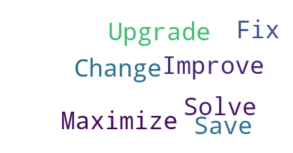

 
Strength :  ['Communications', 'Informix', 'History', 'Sql', 'Algorithms', 'Visualization', 'Statistics', 'Python', 'Sales', 'Processing', 'Analytics', 'Scrum', 'Saas', 'Licensing', 'Etl', 'Driving', 'Research', 'Compliance', 'Writing', 'Pandas', 'Uml', 'Clustering', 'Rest', 'Itsm']
 
Education :  ['x']

Experience 4.750684931506849

***************************************** WORLCLOUD FOR RESUME ****************************************


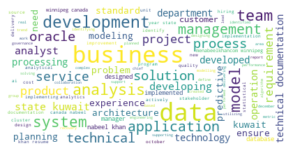


**************************************** WORLCLOUD FOR STRENGTH ****************************************


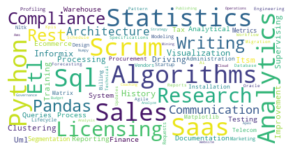


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


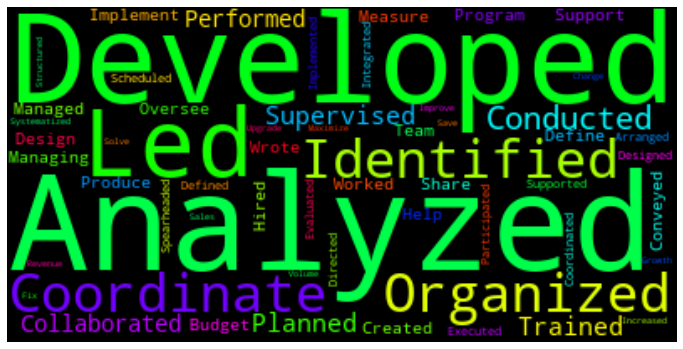


******************************************* SOFT SKILLS CLASSIFICATION **************************************



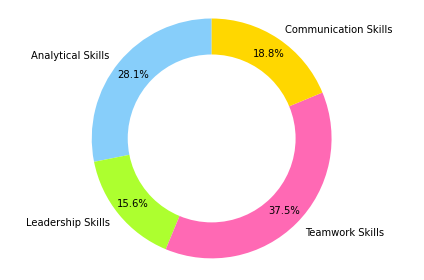


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



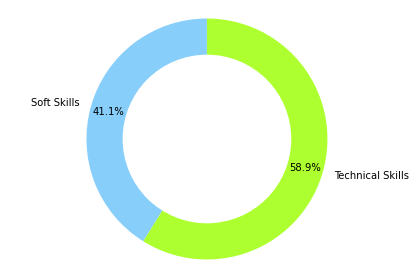

None
*******************************************
KEYWORDS
NLP business (39)
Stats process (9)
DE systems (13)
NLP development (16)
DE development (16)
Python development (16)
ML models (7)
ML data (46)
NLP data (46)
AI data (46)
Stats data (46)
DL data (46)
Python data (46)
AI various (5)
Python using (15)
AI model (6)
ML system (14)
NLP system (14)
AI system (14)
Stats system (14)
DE system (14)
DL system (14)
Python based (5)
ML learning (3)
NLP learning (3)
Stats learning (3)
DL learning (3)
Python learning (3)
Stats learn (2)
ML used (3)
NLP used (3)
DE used (3)
Python used (3)
DL use (2)
AI methods (1)
ML classification (1)
ML software (2)
NLP software (2)
AI software (2)
Stats software (2)
DE software (2)
DL software (2)
Python software (2)
AI processing (6)
********************DF********************
              Keywords_List
0         NLP business (39)
1         Stats process (9)
2           DE systems (13)
3      NLP development (16)
4       DE development (16)
5   Python dev

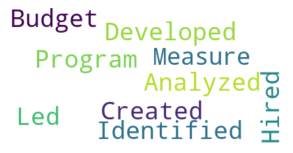

 
Leadership Skills :  ['Oversee', 'Design', 'Coordinate', 'Administer', 'Implement', 'Produce']

**************************************** WORLCLOUD FOR LEADERSHIP SKILLS ****************************************


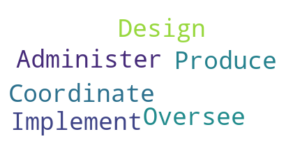

 
Teamwork Skills :  ['Organized', 'Coordinate', 'Support', 'Worked', 'Managed', 'Conducted', 'Supervised', 'Help', 'Planned', 'Team']

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************


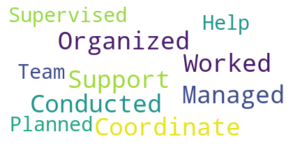

 
Communication Skills :  ['Trained', 'Wrote', 'Define', 'Collaborated', 'Conveyed', 'Performed']

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************


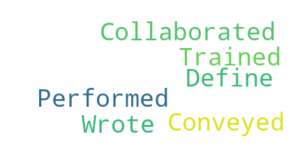

 
Action Verbs :   ['Analyzed', 'Scheduled', 'Led', 'Conducted', 'Designed', 'Participated', 'Organized', 'Reorganized', 'Collaborated', 'Identified', 'Performed', 'Spearheaded', 'Implemented', 'Influenced', 'Executed', 'Directed', 'Trained', 'Arranged', 'Setup', 'Integrated', 'Planned', 'Coordinated', 'Developed', 'Supervised', 'Systematized', 'Structured']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


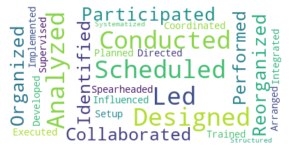

 
Measureable Results :   ['%', 'Increased', '$', 'Sales', 'Revenue', 'Volume']

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************


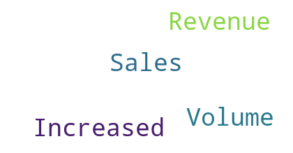

 
Result driven skills :   ['Solve', 'Maximize', 'Change', 'Save', 'Increase', 'Fix']

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************


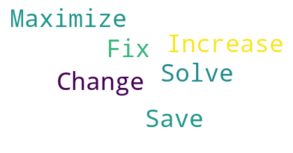

 
Strength :  ['Informix', 'History', 'Sql', 'Algorithms', 'Unix', 'Visualization', 'Statistics', 'Itil', 'Python', 'Sales', 'Opencv', 'Processing', 'Matlab', 'Analytics', 'Licensing', 'Etl', 'Kernel', 'Translation', 'Research', 'Compliance', 'Writing', 'Pandas', 'Hadoop', 'Uml', 'Security', 'Clustering', 'Rest', 'Itsm', 'Tensorflow']
 
Education :  ['x']

Experience 4.750684931506849

***************************************** WORLCLOUD FOR RESUME ****************************************


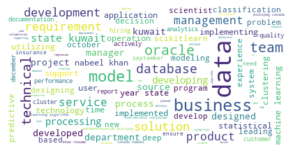


**************************************** WORLCLOUD FOR STRENGTH ****************************************


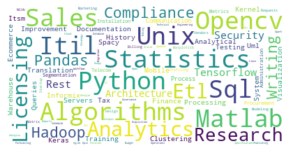


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


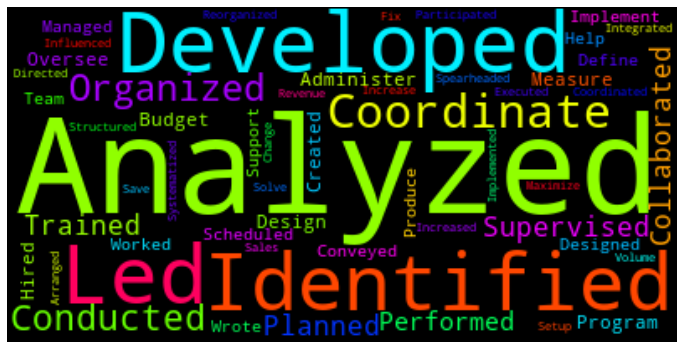


******************************************* SOFT SKILLS CLASSIFICATION **************************************



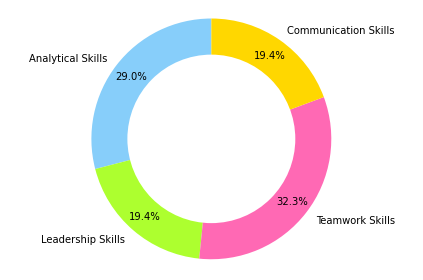


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



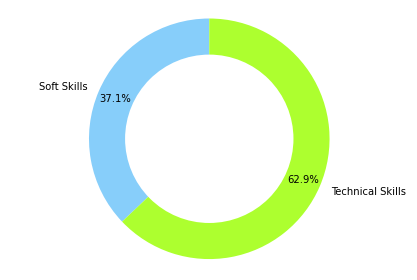

None
*******************************************
KEYWORDS
ML data (58)
NLP data (58)
AI data (58)
Stats data (58)
DL data (58)
Python data (58)
NLP business (21)
Python based (6)
ML models (12)
ML classification (4)
AI various (9)
DE systems (4)
Python using (20)
ML learning (10)
NLP learning (10)
Stats learning (10)
DL learning (10)
Python learning (10)
Stats learn (5)
NLP development (11)
DE development (11)
Python development (11)
Stats process (5)
AI methods (2)
ML system (14)
NLP system (14)
AI system (14)
Stats system (14)
DE system (14)
DL system (14)
AI model (5)
ML used (4)
NLP used (4)
DE used (4)
Python used (4)
AI language (1)
AI processing (8)
ML software (2)
NLP software (2)
AI software (2)
Stats software (2)
DE software (2)
DL software (2)
Python software (2)
DL use (1)
********************DF********************
              Keywords_List
0              ML data (58)
1             NLP data (58)
2              AI data (58)
3           Stats data (58)
4              DL dat

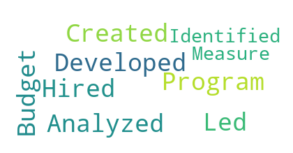

 
Leadership Skills :  ['Oversee', 'Design', 'Coach', 'Produce', 'Streamlined']

**************************************** WORLCLOUD FOR LEADERSHIP SKILLS ****************************************


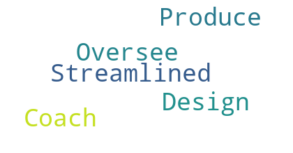

 
Teamwork Skills :  ['Support', 'Worked', 'Managed', 'Conducted', 'Managing', 'Help', 'Share', 'Planned', 'Team', 'Plan']

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************


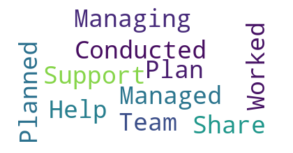

 
Communication Skills :  ['Translate', 'Trained', 'Summarize', 'Wrote', 'Define', 'Performed']

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************


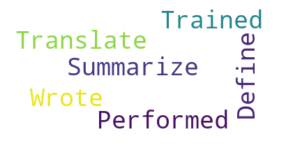

 
Action Verbs :   ['Supported', 'Analyzed', 'Led', 'Conducted', 'Designed', 'Founded', 'Established', 'Advised', 'Defined', 'Identified', 'Performed', 'Spearheaded', 'Evaluated', 'Implemented', 'Launched', 'Executed', 'Directed', 'Trained', 'Arranged', 'Introduced', 'Integrated', 'Streamlined', 'Planned', 'Developed', 'Projected', 'Structured']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


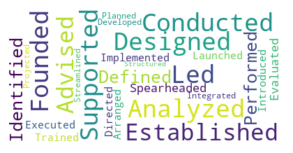

 
Measureable Results :   ['Increased', '%', '$', 'Growth', 'Sales', 'Revenue', 'Volume']

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************


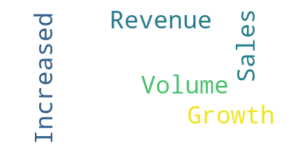

 
Result driven skills :   ['Solve', 'Upgrade', 'Maximize']

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************


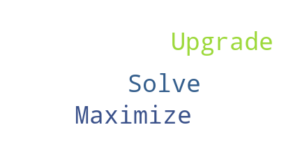

 
Strength :  ['Communications', 'History', 'Sql', 'Algorithms', 'Unix', 'Mongodb', 'Statistics', 'Python', 'Sales', 'Opencv', 'Budgeting', 'Processing', 'Xml', 'Tableau', 'Angularjs', 'Analytics', 'Scrum', 'Saas', 'Licensing', 'Driving', 'Typing', 'Research', 'Security', 'Clustering', 'Cognos', 'Translation', 'Itsm', 'Tensorflow']
 
Education :  ['x']

Experience 7.750684931506849

***************************************** WORLCLOUD FOR RESUME ****************************************


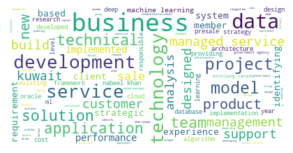


**************************************** WORLCLOUD FOR STRENGTH ****************************************


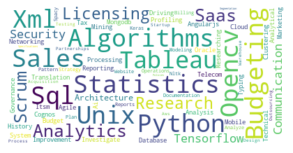


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


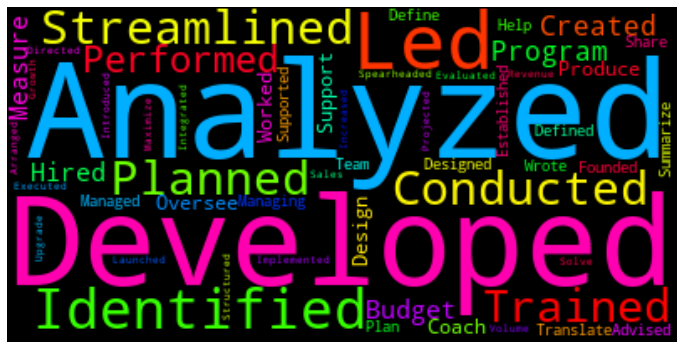


******************************************* SOFT SKILLS CLASSIFICATION **************************************



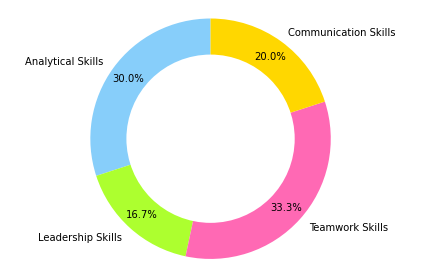


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



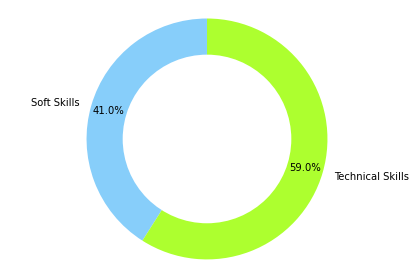

None
*******************************************
KEYWORDS
ML data (19)
NLP data (19)
AI data (19)
Stats data (19)
DL data (19)
Python data (19)
ML learning (11)
NLP learning (11)
Stats learning (11)
DL learning (11)
Python learning (11)
NLP business (27)
Python based (9)
ML models (8)
DE systems (6)
Python using (12)
NLP development (15)
DE development (15)
Python development (15)
Stats process (2)
ML software (1)
NLP software (1)
AI software (1)
Stats software (1)
DE software (1)
DL software (1)
Python software (1)
AI various (3)
AI methods (1)
Stats learn (2)
AI model (4)
DL use (2)
ML system (8)
NLP system (8)
AI system (8)
Stats system (8)
DE system (8)
DL system (8)
AI processing (1)
ML used (1)
NLP used (1)
DE used (1)
Python used (1)
ML classification (1)
ML one (1)
Stats one (1)
DE one (1)
DL one (1)
Python one (1)
DL also (1)
********************DF********************
              Keywords_List
0              ML data (19)
1             NLP data (19)
2              AI data (19

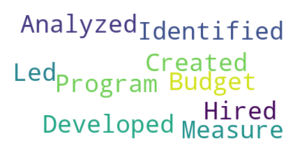

 
Leadership Skills :  ['Oversee', 'Design', 'Coordinate', 'Implement', 'Produce']

**************************************** WORLCLOUD FOR LEADERSHIP SKILLS ****************************************


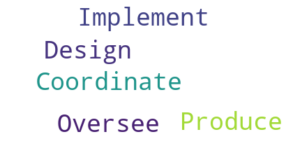

 
Teamwork Skills :  ['Organized', 'Coordinate', 'Support', 'Worked', 'Managed', 'Conducted', 'Managing', 'Supervised', 'Help', 'Share', 'Planned', 'Team', 'Assist']

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************


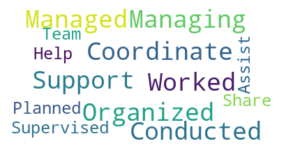

 
Communication Skills :  ['Translate', 'Trained', 'Wrote', 'Define', 'Collaborated', 'Conveyed', 'Performed']

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************


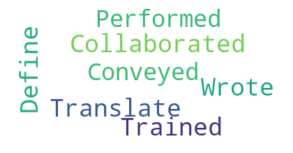

 
Action Verbs :   ['Supported', 'Analyzed', 'Scheduled', 'Led', 'Conducted', 'Assigned', 'Designed', 'Participated', 'Organized', 'Collaborated', 'Defined', 'Identified', 'Performed', 'Spearheaded', 'Evaluated', 'Implemented', 'Executed', 'Directed', 'Trained', 'Arranged', 'Integrated', 'Planned', 'Coordinated', 'Developed', 'Supervised', 'Systematized', 'Structured']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


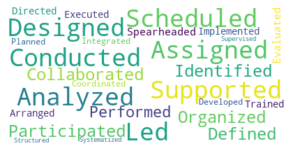

 
Measureable Results :   ['Increased', '%', '$', 'Growth', 'Sales', 'Revenue', 'Volume']

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************


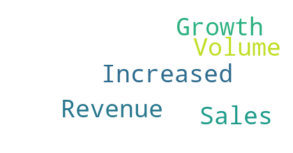

 
Result driven skills :   ['Solve', 'Maximize', 'Change', 'Save', 'Upgrade', 'Fix']

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************


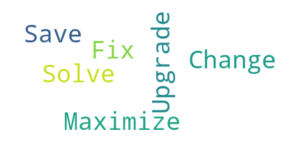

 
Strength :  ['Communications', 'Informix', 'History', 'Sql', 'Algorithms', 'Visualization', 'Statistics', 'Python', 'Sales', 'Processing', 'Analytics', 'Scrum', 'Saas', 'Licensing', 'Etl', 'Driving', 'Research', 'Compliance', 'Writing', 'Pandas', 'Uml', 'Clustering', 'Rest', 'Itsm']
 
Education :  ['x']

Experience 4.750684931506849

***************************************** WORLCLOUD FOR RESUME ****************************************


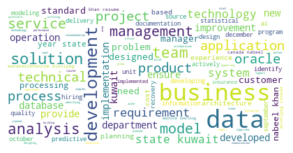


**************************************** WORLCLOUD FOR STRENGTH ****************************************


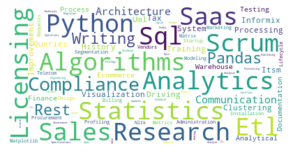


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


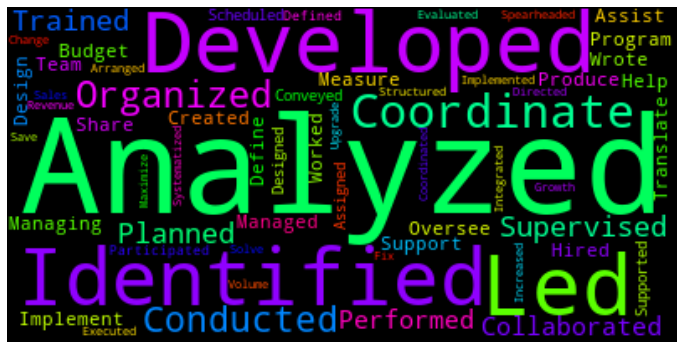


******************************************* SOFT SKILLS CLASSIFICATION **************************************



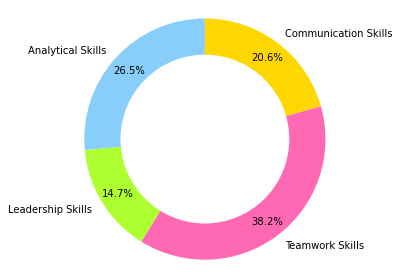


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



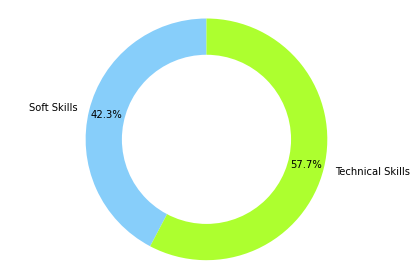

None
*******************************************
KEYWORDS
NLP business (36)
Python based (7)
Stats process (9)
DE systems (8)
NLP development (18)
DE development (18)
Python development (18)
ML models (7)
ML data (43)
NLP data (43)
AI data (43)
Stats data (43)
DL data (43)
Python data (43)
AI various (5)
Python using (14)
ML learning (5)
NLP learning (5)
Stats learning (5)
DL learning (5)
Python learning (5)
ML system (16)
NLP system (16)
AI system (16)
Stats system (16)
DE system (16)
DL system (16)
AI model (5)
Stats learn (2)
ML used (3)
NLP used (3)
DE used (3)
Python used (3)
DL use (2)
AI methods (1)
ML classification (1)
ML software (2)
NLP software (2)
AI software (2)
Stats software (2)
DE software (2)
DL software (2)
Python software (2)
AI processing (5)
********************DF********************
              Keywords_List
0         NLP business (36)
1          Python based (7)
2         Stats process (9)
3            DE systems (8)
4      NLP development (18)
5       DE deve

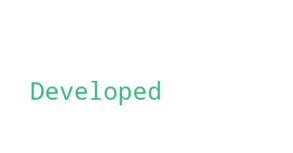

 
Leadership Skills :  []

**************************************** WORLCLOUD FOR LEADERSHIP SKILLS ****************************************
No leadership skill
 
Teamwork Skills :  ['Worked', 'Help']

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************


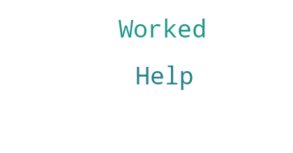

 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   ['Designed', 'Generated', 'Integrated', 'Developed']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


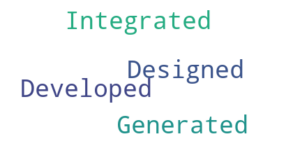

 
Measureable Results :   []

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************
No measureable result
 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Manufacturing', 'Flask', 'Sql', 'Basic', 'Sqlite', 'Odoo', 'Statistics', 'Postgresql', 'Python', 'Soapui', 'Jquery', 'Oop', 'Html', 'Android', 'Javascript', 'Soap', 'Erp', 'Rest', 'Css']
 
Education :  []

Experience 0

***************************************** WORLCLOUD FOR RESUME ****************************************


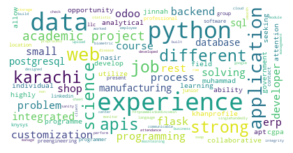


**************************************** WORLCLOUD FOR STRENGTH ****************************************


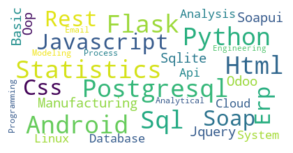


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


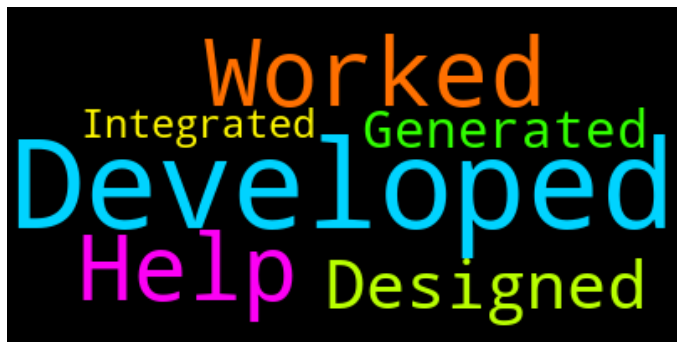


******************************************* SOFT SKILLS CLASSIFICATION **************************************



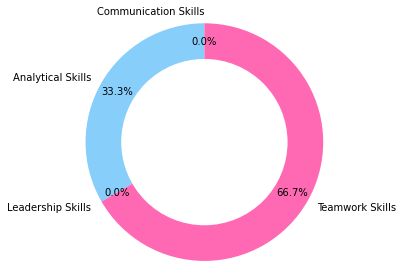


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



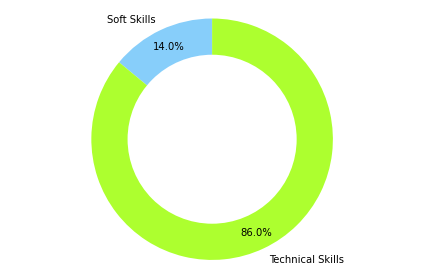

None
*******************************************
KEYWORDS
ML learning (1)
NLP learning (1)
Stats learning (1)
DL learning (1)
Python learning (1)
ML software (1)
NLP software (1)
AI software (1)
Stats software (1)
DE software (1)
DL software (1)
Python software (1)
ML data (8)
NLP data (8)
AI data (8)
Stats data (8)
DL data (8)
Python data (8)
Stats process (2)
ML used (2)
NLP used (2)
DE used (2)
Python used (2)
NLP business (1)
ML system (1)
NLP system (1)
AI system (1)
Stats system (1)
DE system (1)
DL system (1)
NLP programming (2)
AI programming (2)
Stats programming (2)
DE programming (2)
Python programming (2)
AI model (1)
ML models (1)
DE systems (1)
Python based (1)
DL also (1)
AI language (1)
********************DF********************
             Keywords_List
0          ML learning (1)
1         NLP learning (1)
2       Stats learning (1)
3          DL learning (1)
4      Python learning (1)
5          ML software (1)
6         NLP software (1)
7          AI software (1)
8 

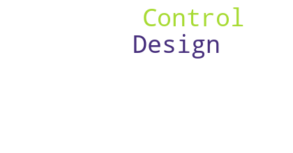

 
Teamwork Skills :  ['Served', 'Managed', 'Team', 'Conducted']

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************


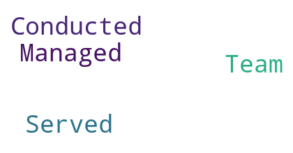

 
Communication Skills :  ['Communicate']

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************


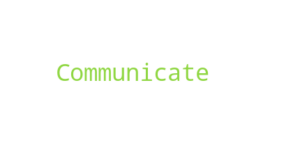

 
Action Verbs :   ['Designed', 'Conducted']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


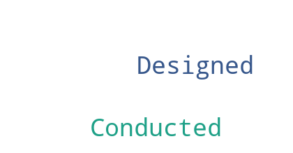

 
Measureable Results :   []

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************
No measureable result
 
Result driven skills :   ['Reduce']

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************


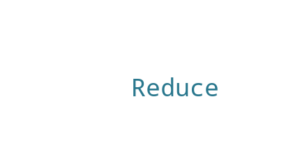

 
Strength :  ['Research', 'Statistics', 'Writing', 'Pandas', 'Php', 'Python', 'Security', 'Sql', 'Javascript', 'Mysql', 'Algorithms', 'Entrepreneurship', 'Processing', 'Java', 'Css', 'C']
 
Education :  []

Experience []

***************************************** WORLCLOUD FOR RESUME ****************************************


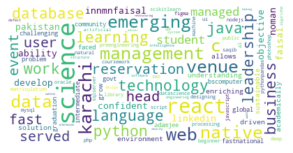


**************************************** WORLCLOUD FOR STRENGTH ****************************************


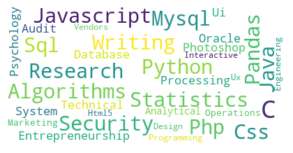


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


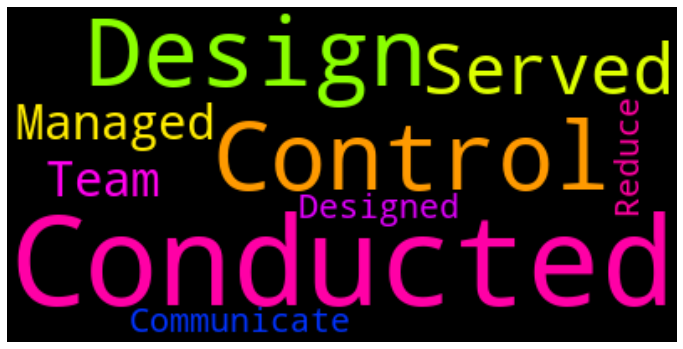


******************************************* SOFT SKILLS CLASSIFICATION **************************************



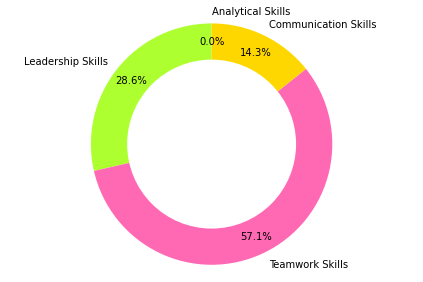


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



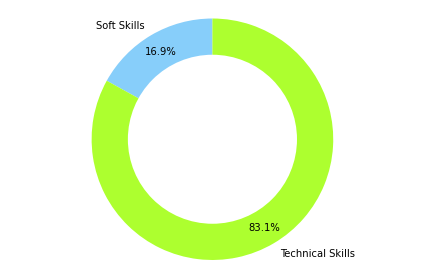

None
*******************************************
KEYWORDS
DL also (2)
AI java (2)
ML data (4)
NLP data (4)
AI data (4)
Stats data (4)
DL data (4)
Python data (4)
ML learning (2)
NLP learning (2)
Stats learning (2)
DL learning (2)
Python learning (2)
Stats learn (1)
AI language (1)
AI processing (1)
ML software (1)
NLP software (1)
AI software (1)
Stats software (1)
DE software (1)
DL software (1)
Python software (1)
DE systems (1)
ML system (1)
NLP system (1)
AI system (1)
Stats system (1)
DE system (1)
DL system (1)
NLP programming (1)
AI programming (1)
Stats programming (1)
DE programming (1)
Python programming (1)
NLP business (1)
ML used (1)
NLP used (1)
DE used (1)
Python used (1)
********************DF********************
             Keywords_List
0              DL also (2)
1              AI java (2)
2              ML data (4)
3             NLP data (4)
4              AI data (4)
5           Stats data (4)
6              DL data (4)
7          Python data (4)
8          ML lear

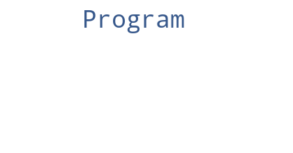

 
Leadership Skills :  []

**************************************** WORLCLOUD FOR LEADERSHIP SKILLS ****************************************
No leadership skill
 
Teamwork Skills :  []

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************
No Teamwork skill
 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   []

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************
No action verbs
 
Measureable Results :   []

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************
No measureable result
 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Pandas', '

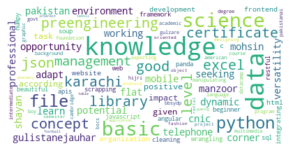


**************************************** WORLCLOUD FOR STRENGTH ****************************************


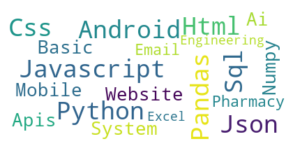


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


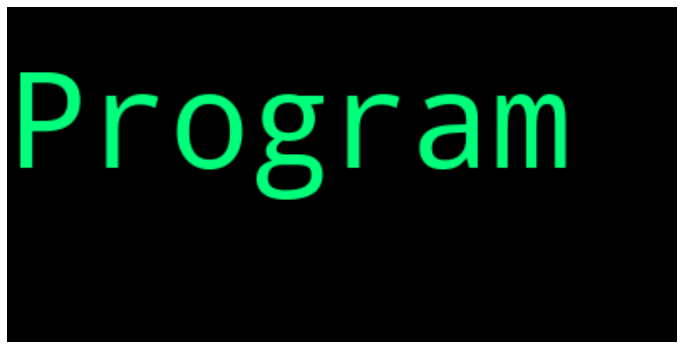


******************************************* SOFT SKILLS CLASSIFICATION **************************************



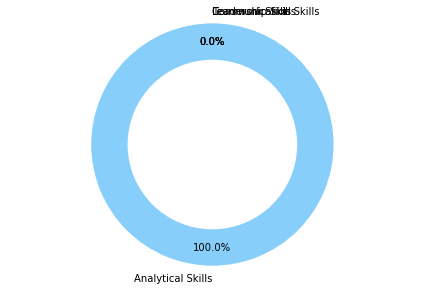


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



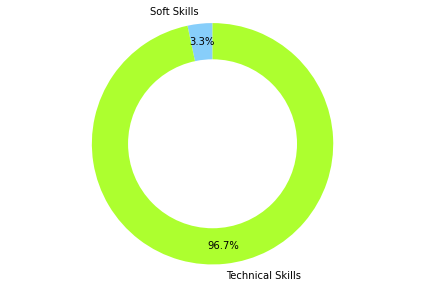

None
*******************************************
KEYWORDS
Stats learn (1)
NLP development (1)
DE development (1)
Python development (1)
Python using (4)
ML data (7)
NLP data (7)
AI data (7)
Stats data (7)
DL data (7)
Python data (7)
AI language (1)
ML system (2)
NLP system (2)
AI system (2)
Stats system (2)
DE system (2)
DL system (2)
********************DF********************
             Keywords_List
0          Stats learn (1)
1      NLP development (1)
2       DE development (1)
3   Python development (1)
4         Python using (4)
5              ML data (7)
6             NLP data (7)
7              AI data (7)
8           Stats data (7)
9              DL data (7)
10         Python data (7)
11         AI language (1)
12           ML system (2)
13          NLP system (2)
14           AI system (2)
15        Stats system (2)
16           DE system (2)
17           DL system (2)
['Python Resume (1)']
******************DATAF**************
       Candidate Name Subject       Keyword Cou

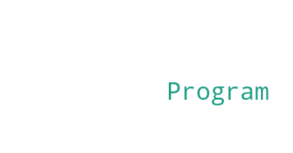

 
Leadership Skills :  []

**************************************** WORLCLOUD FOR LEADERSHIP SKILLS ****************************************
No leadership skill
 
Teamwork Skills :  []

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************
No Teamwork skill
 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   []

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************
No action verbs
 
Measureable Results :   []

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************
No measureable result
 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Pandas', '

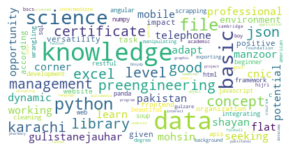


**************************************** WORLCLOUD FOR STRENGTH ****************************************


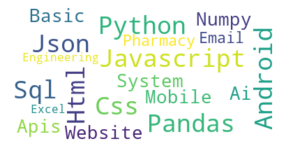


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


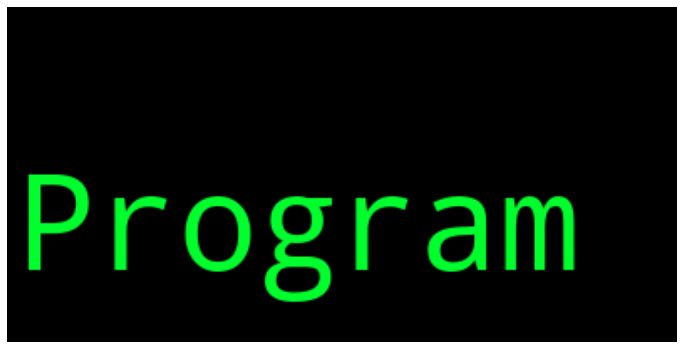


******************************************* SOFT SKILLS CLASSIFICATION **************************************



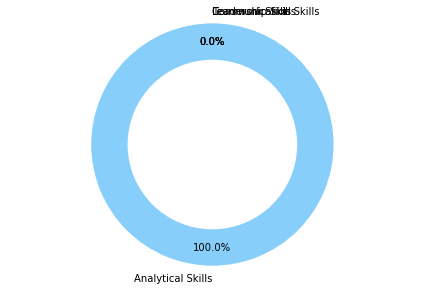


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



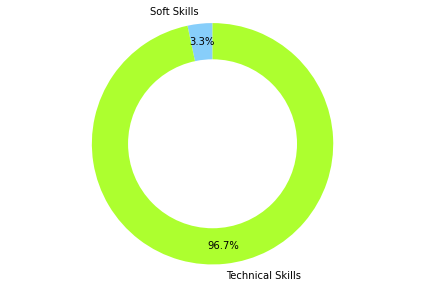

None
*******************************************
KEYWORDS
Stats learn (1)
NLP development (1)
DE development (1)
Python development (1)
Python using (4)
ML data (7)
NLP data (7)
AI data (7)
Stats data (7)
DL data (7)
Python data (7)
AI language (1)
ML system (2)
NLP system (2)
AI system (2)
Stats system (2)
DE system (2)
DL system (2)
********************DF********************
             Keywords_List
0          Stats learn (1)
1      NLP development (1)
2       DE development (1)
3   Python development (1)
4         Python using (4)
5              ML data (7)
6             NLP data (7)
7              AI data (7)
8           Stats data (7)
9              DL data (7)
10         Python data (7)
11         AI language (1)
12           ML system (2)
13          NLP system (2)
14           AI system (2)
15        Stats system (2)
16           DE system (2)
17           DL system (2)
['Python Resume']
******************DATAF**************
   Candidate Name Subject       Keyword Count
0   p

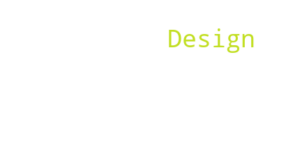

 
Teamwork Skills :  ['Team']

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************


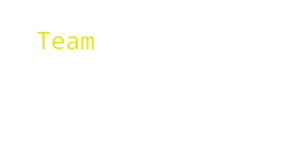

 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   ['Educated']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


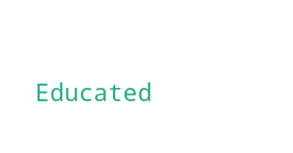

 
Measureable Results :   []

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************
No measureable result
 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Balsamiq', 'Invision', 'Php', 'Nosql', 'Python', 'Sql', 'Javascript', 'Wordpress', 'Animation', 'Firebase']
 
Education :  [('BE', '2013'), 'MS']

Experience 0

***************************************** WORLCLOUD FOR RESUME ****************************************


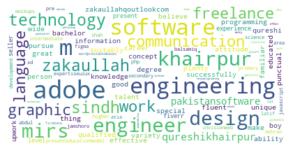


**************************************** WORLCLOUD FOR STRENGTH ****************************************


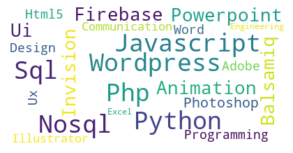


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


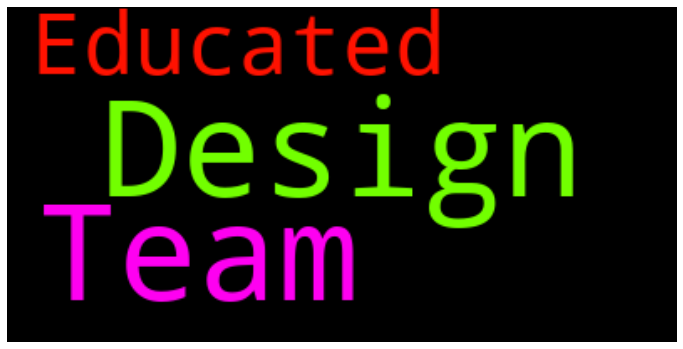


******************************************* SOFT SKILLS CLASSIFICATION **************************************



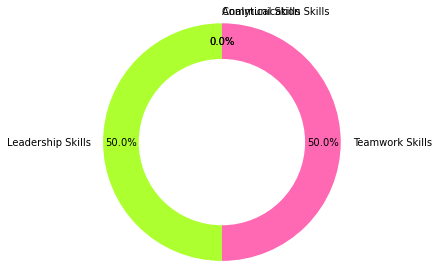


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



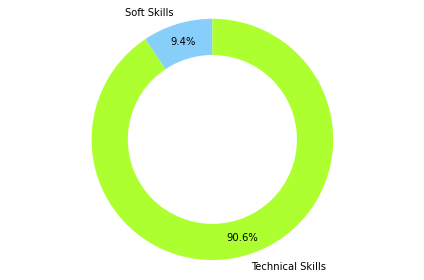

None
*******************************************
KEYWORDS
ML software (5)
NLP software (5)
AI software (5)
Stats software (5)
DE software (5)
DL software (5)
Python software (5)
NLP programming (2)
AI programming (2)
Stats programming (2)
DE programming (2)
Python programming (2)
ML one (1)
Stats one (1)
DE one (1)
DL one (1)
Python one (1)
AI language (1)
AI model (1)
NLP development (1)
DE development (1)
Python development (1)
ML data (1)
NLP data (1)
AI data (1)
Stats data (1)
DL data (1)
Python data (1)
********************DF********************
             Keywords_List
0          ML software (5)
1         NLP software (5)
2          AI software (5)
3       Stats software (5)
4          DE software (5)
5          DL software (5)
6      Python software (5)
7      NLP programming (2)
8       AI programming (2)
9    Stats programming (2)
10      DE programming (2)
11  Python programming (2)
12              ML one (1)
13           Stats one (1)
14              DE one (1)
15         

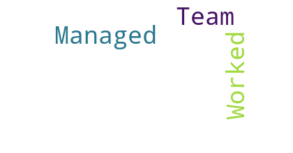

 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   ['Updated', 'Setup', 'Completed']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


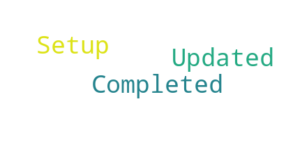

 
Measureable Results :   ['Growth']

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************


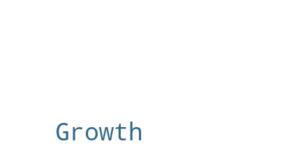

 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Polish', 'Css', 'Python', 'Javascript', 'Mysql', 'Jquery', 'Wordpress', 'Urdu', 'Html', 'English', 'Java', 'Scripting', 'C']
 
Education :  ['BS', ('HSC', '2017'), ('SSC', '2017')]

Experience []

***************************************** WORLCLOUD FOR RESUME ****************************************


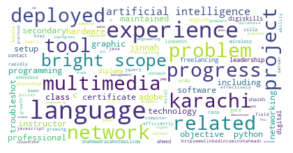


**************************************** WORLCLOUD FOR STRENGTH ****************************************


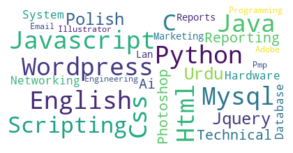


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


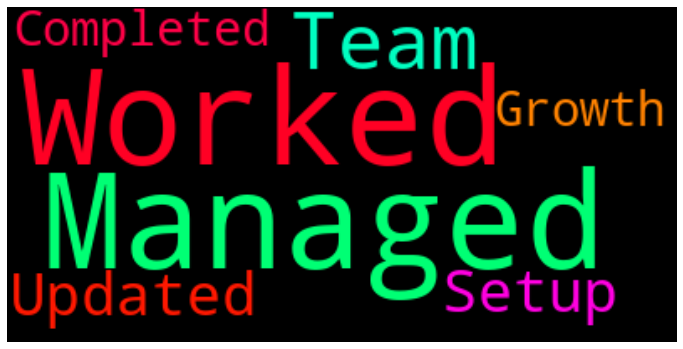


******************************************* SOFT SKILLS CLASSIFICATION **************************************



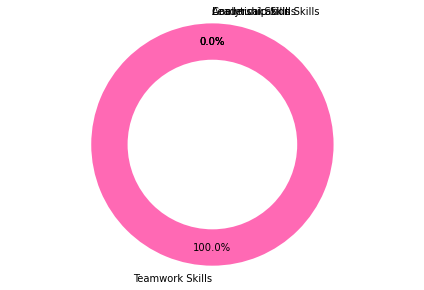


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



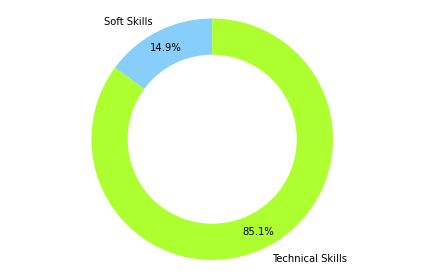

None
*******************************************
KEYWORDS
AI language (3)
Stats learn (1)
NLP programming (2)
AI programming (2)
Stats programming (2)
DE programming (2)
Python programming (2)
AI java (1)
ML software (2)
NLP software (2)
AI software (2)
Stats software (2)
DE software (2)
DL software (2)
Python software (2)
Python using (1)
ML system (1)
NLP system (1)
AI system (1)
Stats system (1)
DE system (1)
DL system (1)
ML one (1)
Stats one (1)
DE one (1)
DL one (1)
Python one (1)
********************DF********************
             Keywords_List
0          AI language (3)
1          Stats learn (1)
2      NLP programming (2)
3       AI programming (2)
4    Stats programming (2)
5       DE programming (2)
6   Python programming (2)
7              AI java (1)
8          ML software (2)
9         NLP software (2)
10         AI software (2)
11      Stats software (2)
12         DE software (2)
13         DL software (2)
14     Python software (2)
15        Python using (1)
16    

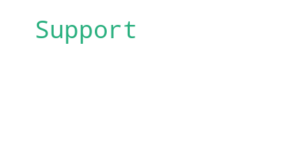

 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   []

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************
No action verbs
 
Measureable Results :   ['%', 'Growth']

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************


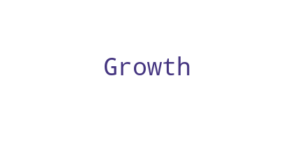

 
Result driven skills :   ['Advance']

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************


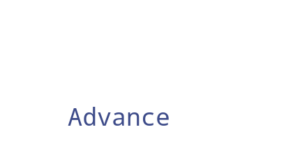

 
Strength :  ['Writing', 'Python', 'Security', 'Sql', 'Algorithms', 'Clustering', 'Processing', 'Regex', 'Tableau', 'Java']
 
Education :  []

Experience []

***************************************** WORLCLOUD FOR RESUME ****************************************


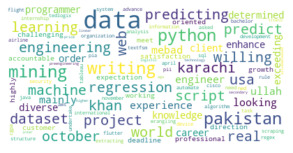


**************************************** WORLCLOUD FOR STRENGTH ****************************************


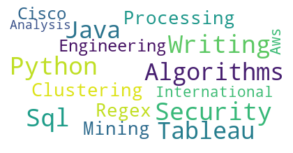


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


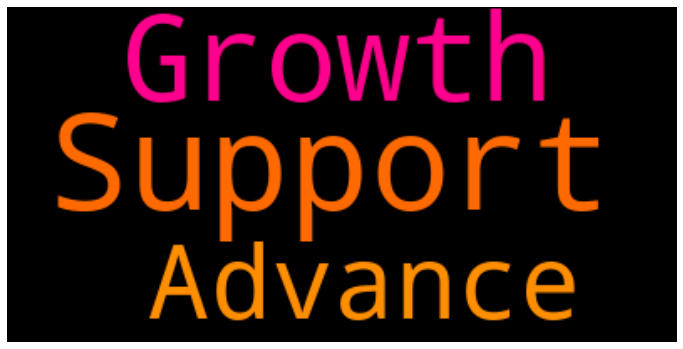


******************************************* SOFT SKILLS CLASSIFICATION **************************************



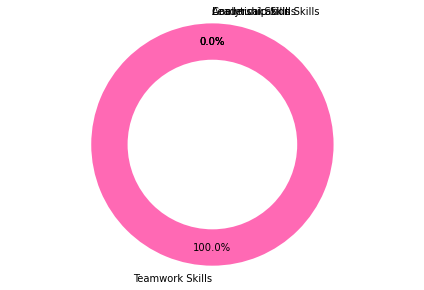


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



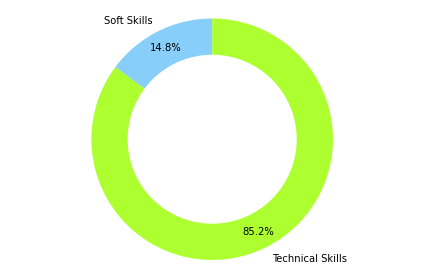

None
*******************************************
KEYWORDS
ML learning (2)
NLP learning (2)
Stats learning (2)
DL learning (2)
Python learning (2)
ML data (8)
NLP data (8)
AI data (8)
Stats data (8)
DL data (8)
Python data (8)
NLP development (1)
DE development (1)
Python development (1)
AI java (1)
Python using (7)
DE systems (1)
AI language (1)
AI processing (1)
********************DF********************
             Keywords_List
0          ML learning (2)
1         NLP learning (2)
2       Stats learning (2)
3          DL learning (2)
4      Python learning (2)
5              ML data (8)
6             NLP data (8)
7              AI data (8)
8           Stats data (8)
9              DL data (8)
10         Python data (8)
11     NLP development (1)
12      DE development (1)
13  Python development (1)
14             AI java (1)
15        Python using (7)
16          DE systems (1)
17         AI language (1)
18       AI processing (1)
['Resume Ebad']
******************DATAF************

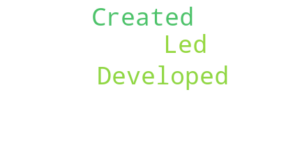

 
Leadership Skills :  ['Institute']

**************************************** WORLCLOUD FOR LEADERSHIP SKILLS ****************************************


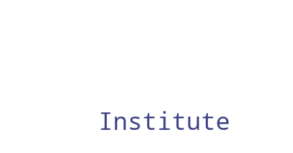

 
Teamwork Skills :  ['Worked', 'Planned', 'Conducted']

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************


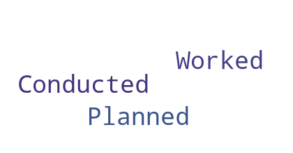

 
Communication Skills :  ['Communicate']

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************


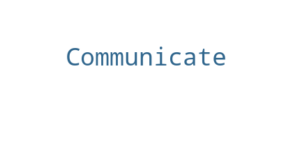

 
Action Verbs :   ['Developed', 'Motivated', 'Led', 'Conducted', 'Designed', 'Integrated', 'Started', 'Participated', 'Planned', 'Implemented']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


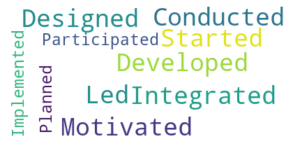

 
Measureable Results :   []

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************
No measureable result
 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Ajax', 'Sql', 'Algorithms', 'Mongodb', 'Git', 'Python', 'Opencv', 'Processing', 'Xml', 'Junit', 'Mysql', 'Driving', 'Jquery', 'Selenium', 'Html', 'Android', 'Jsp', 'Bootstrap', 'Php', 'Nosql', 'Javascript', 'Json', 'Rest', 'Java', 'Css']
 
Education :  []

Experience 0

***************************************** WORLCLOUD FOR RESUME ****************************************


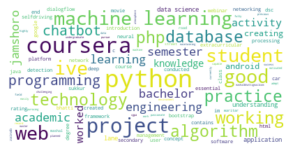


**************************************** WORLCLOUD FOR STRENGTH ****************************************


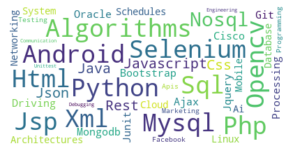


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


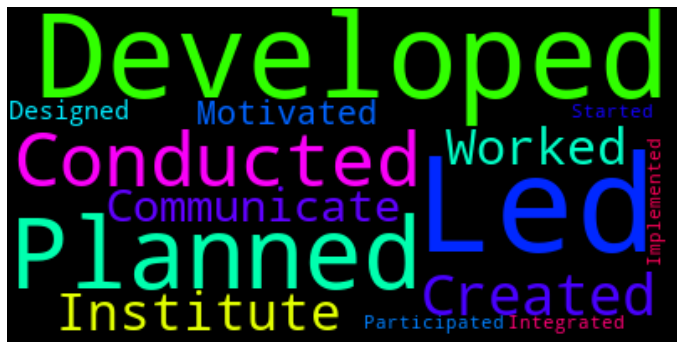


******************************************* SOFT SKILLS CLASSIFICATION **************************************



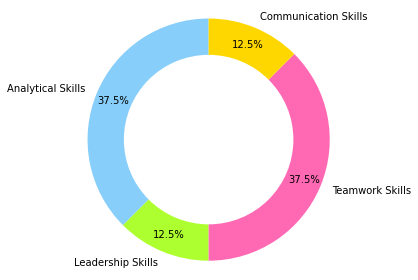


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



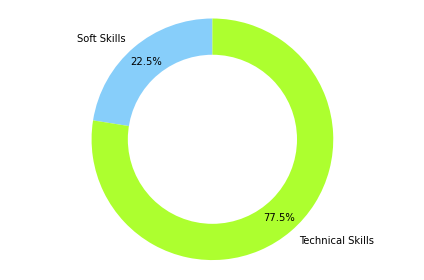

None
*******************************************
KEYWORDS
ML software (2)
NLP software (2)
AI software (2)
Stats software (2)
DE software (2)
DL software (2)
Python software (2)
ML data (4)
NLP data (4)
AI data (4)
Stats data (4)
DL data (4)
Python data (4)
ML learning (8)
NLP learning (8)
Stats learning (8)
DL learning (8)
Python learning (8)
DL also (4)
AI java (2)
AI processing (2)
NLP development (1)
DE development (1)
Python development (1)
NLP programming (4)
AI programming (4)
Stats programming (4)
DE programming (4)
Python programming (4)
ML system (2)
NLP system (2)
AI system (2)
Stats system (2)
DE system (2)
DL system (2)
Python using (5)
AI language (1)
Python based (1)
********************DF********************
             Keywords_List
0          ML software (2)
1         NLP software (2)
2          AI software (2)
3       Stats software (2)
4          DE software (2)
5          DL software (2)
6      Python software (2)
7              ML data (4)
8             NLP data 

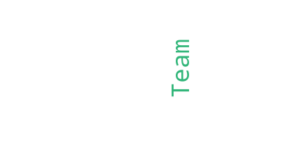

 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   []

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************
No action verbs
 
Measureable Results :   []

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************
No measureable result
 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Writing', 'Python', 'Sql']
 
Education :  [('BE', '1992'), 'MS']

Experience 0

***************************************** WORLCLOUD FOR RESUME ****************************************


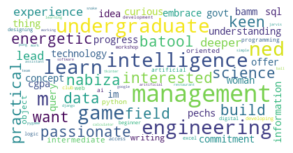


**************************************** WORLCLOUD FOR STRENGTH ****************************************


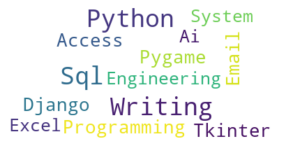


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


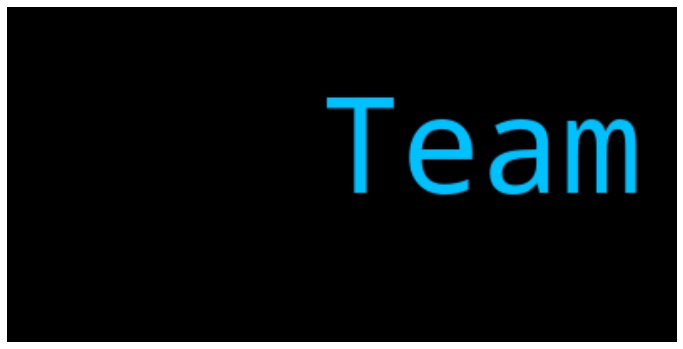


******************************************* SOFT SKILLS CLASSIFICATION **************************************



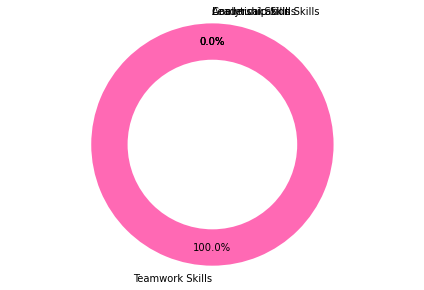


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



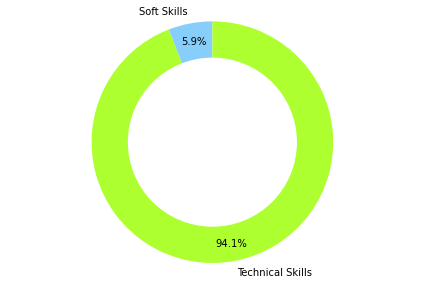

None
*******************************************
KEYWORDS
ML data (1)
NLP data (1)
AI data (1)
Stats data (1)
DL data (1)
Python data (1)
Stats learn (2)
ML system (2)
NLP system (2)
AI system (2)
Stats system (2)
DE system (2)
DL system (2)
NLP programming (1)
AI programming (1)
Stats programming (1)
DE programming (1)
Python programming (1)
NLP development (1)
DE development (1)
Python development (1)
Python using (1)
ML software (1)
NLP software (1)
AI software (1)
Stats software (1)
DE software (1)
DL software (1)
Python software (1)
ML learning (1)
NLP learning (1)
Stats learning (1)
DL learning (1)
Python learning (1)
********************DF********************
             Keywords_List
0              ML data (1)
1             NLP data (1)
2              AI data (1)
3           Stats data (1)
4              DL data (1)
5          Python data (1)
6          Stats learn (2)
7            ML system (2)
8           NLP system (2)
9            AI system (2)
10        Stats system (2)
1

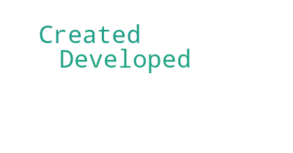

 
Leadership Skills :  []

**************************************** WORLCLOUD FOR LEADERSHIP SKILLS ****************************************
No leadership skill
 
Teamwork Skills :  ['Worked', 'Team']

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************


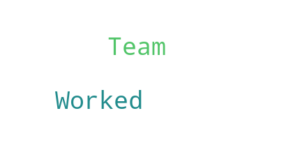

 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   ['Designed', 'Developed']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


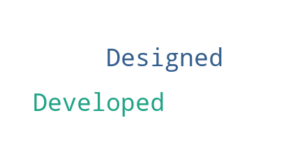

 
Measureable Results :   ['%']

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************
No measureable result
 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Python', 'Sql', 'Javascript', 'Html', 'Java', 'Css', 'C']
 
Education :  [('BS', '2015')]

Experience 0

***************************************** WORLCLOUD FOR RESUME ****************************************


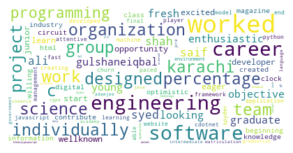


**************************************** WORLCLOUD FOR STRENGTH ****************************************


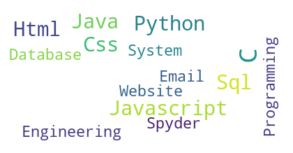


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


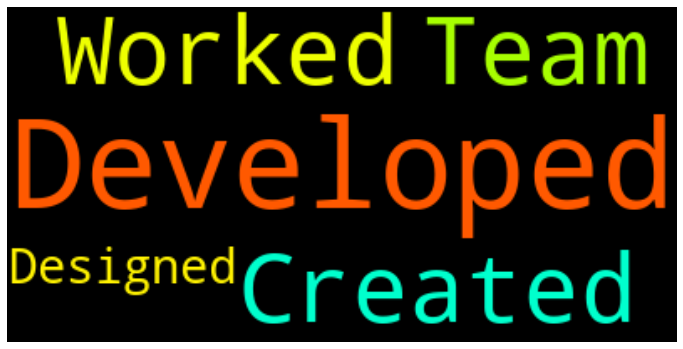


******************************************* SOFT SKILLS CLASSIFICATION **************************************



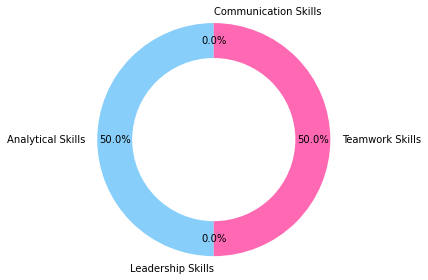


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



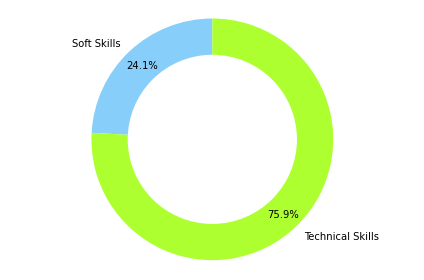

None
*******************************************
KEYWORDS
ML software (3)
NLP software (3)
AI software (3)
Stats software (3)
DE software (3)
DL software (3)
Python software (3)
Stats learn (1)
ML system (1)
NLP system (1)
AI system (1)
Stats system (1)
DE system (1)
DL system (1)
Python using (2)
ML learning (1)
NLP learning (1)
Stats learning (1)
DL learning (1)
Python learning (1)
AI model (1)
NLP programming (2)
AI programming (2)
Stats programming (2)
DE programming (2)
Python programming (2)
AI java (1)
ML data (1)
NLP data (1)
AI data (1)
Stats data (1)
DL data (1)
Python data (1)
********************DF********************
             Keywords_List
0          ML software (3)
1         NLP software (3)
2          AI software (3)
3       Stats software (3)
4          DE software (3)
5          DL software (3)
6      Python software (3)
7          Stats learn (1)
8            ML system (1)
9           NLP system (1)
10           AI system (1)
11        Stats system (1)
12         

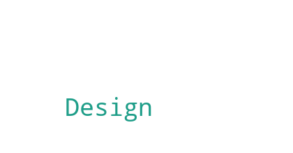

 
Teamwork Skills :  []

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************
No Teamwork skill
 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   ['Awarded']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


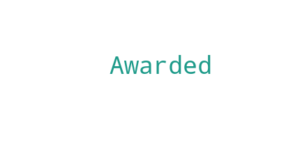

 
Measureable Results :   []

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************
No measureable result
 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Bootstrap', 'Python', 'Sql', 'Javascript', 'Basic', 'Wordpress', 'Urdu', 'Html', 'English']
 
Education :  ['MS']

Experience []

***************************************** WORLCLOUD FOR RESUME ****************************************


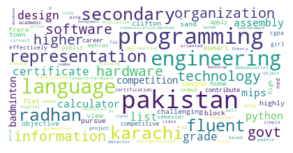


**************************************** WORLCLOUD FOR STRENGTH ****************************************


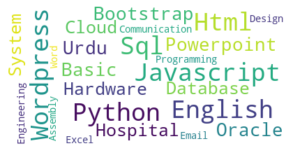


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


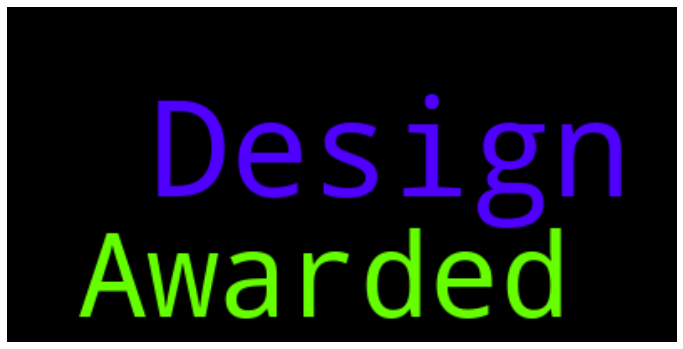


******************************************* SOFT SKILLS CLASSIFICATION **************************************



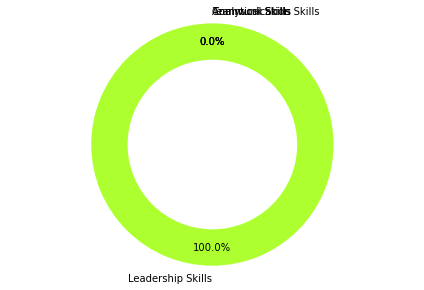


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



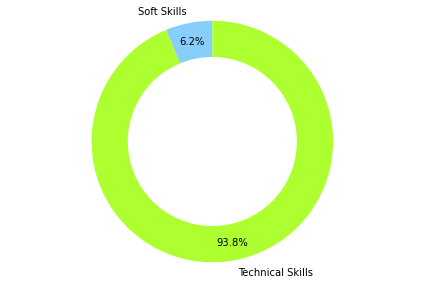

None
*******************************************
KEYWORDS
ML software (2)
NLP software (2)
AI software (2)
Stats software (2)
DE software (2)
DL software (2)
Python software (2)
NLP programming (5)
AI programming (5)
Stats programming (5)
DE programming (5)
Python programming (5)
ML system (5)
NLP system (5)
AI system (5)
Stats system (5)
DE system (5)
DL system (5)
Python based (1)
AI methods (1)
AI language (2)
DE systems (1)
ML learning (1)
NLP learning (1)
Stats learning (1)
DL learning (1)
Python learning (1)
********************DF********************
             Keywords_List
0          ML software (2)
1         NLP software (2)
2          AI software (2)
3       Stats software (2)
4          DE software (2)
5          DL software (2)
6      Python software (2)
7      NLP programming (5)
8       AI programming (5)
9    Stats programming (5)
10      DE programming (5)
11  Python programming (5)
12           ML system (5)
13          NLP system (5)
14           AI system (5)
15   

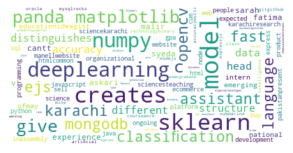


**************************************** WORLCLOUD FOR STRENGTH ****************************************


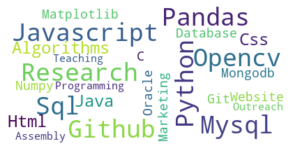


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************
 

******************************************* SOFT SKILLS CLASSIFICATION **************************************



<ipython-input-39-14cbadeba58c>:202: MatplotlibDeprecationWarning: normalize=None does not normalize if the sum is less than 1 but this behavior is deprecated since 3.3 until two minor releases later. After the deprecation period the default value will be normalize=True. To prevent normalization pass normalize=False 
  plt.pie(data1, colors = colors, labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.85)


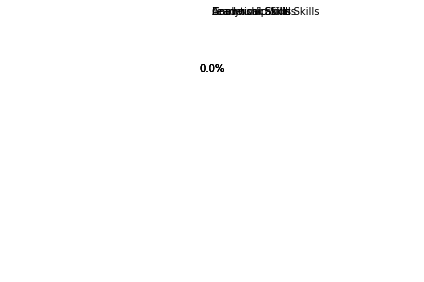


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



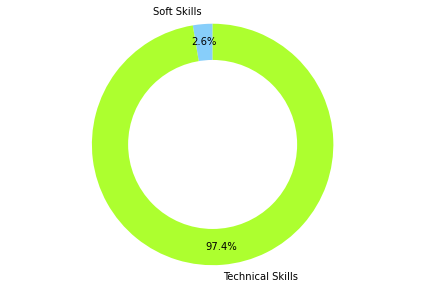

None
*******************************************
KEYWORDS
Stats may (1)
DE may (1)
DL may (1)
AI language (2)
NLP development (1)
DE development (1)
Python development (1)
NLP programming (1)
AI programming (1)
Stats programming (1)
DE programming (1)
Python programming (1)
AI java (1)
AI model (6)
ML data (2)
NLP data (2)
AI data (2)
Stats data (2)
DL data (2)
Python data (2)
DE systems (1)
NLP business (1)
********************DF********************
             Keywords_List
0            Stats may (1)
1               DE may (1)
2               DL may (1)
3          AI language (2)
4      NLP development (1)
5       DE development (1)
6   Python development (1)
7      NLP programming (1)
8       AI programming (1)
9    Stats programming (1)
10      DE programming (1)
11  Python programming (1)
12             AI java (1)
13            AI model (6)
14             ML data (2)
15            NLP data (2)
16             AI data (2)
17          Stats data (2)
18             DL data (2)
19   

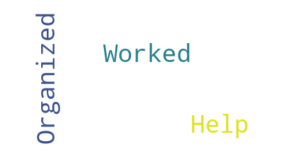

 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   ['Organized', 'Completed', 'Participated']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


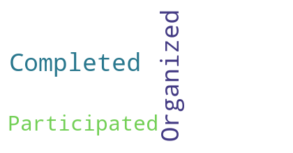

 
Measureable Results :   []

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************
No measureable result
 
Result driven skills :   ['Advance']

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************


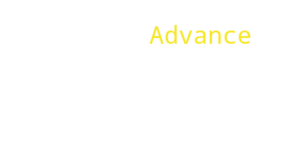

 
Strength :  ['Research', 'Netbeans', 'Bootstrap', 'Seo', 'History', 'Php', 'Python', 'Sql', 'Javascript', 'Mysql', 'Git', 'Wordpress', 'Oop', 'Html', 'Java', 'Css', 'C']
 
Education :  []

Experience []

***************************************** WORLCLOUD FOR RESUME ****************************************


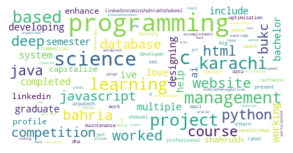


**************************************** WORLCLOUD FOR STRENGTH ****************************************


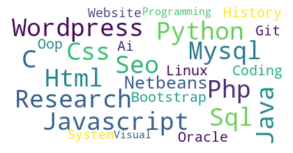


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


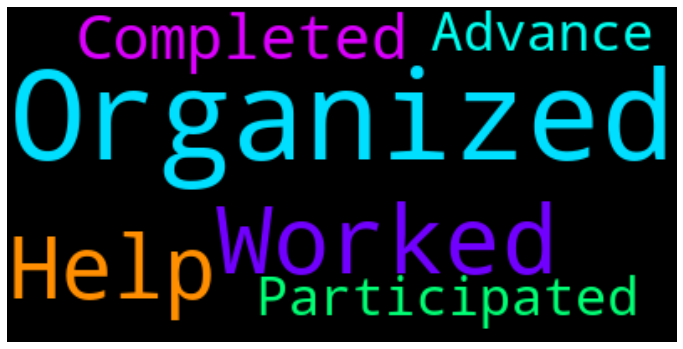


******************************************* SOFT SKILLS CLASSIFICATION **************************************



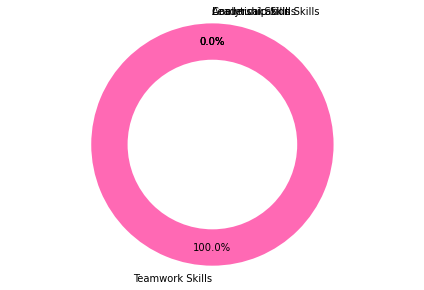


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



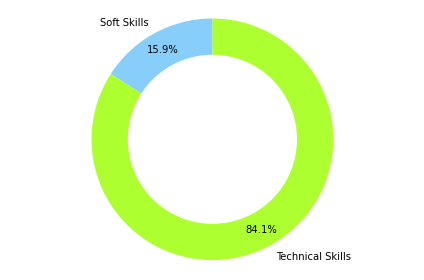

None
*******************************************
KEYWORDS
DE systems (1)
ML learning (3)
NLP learning (3)
Stats learning (3)
DL learning (3)
Python learning (3)
Python based (3)
ML software (1)
NLP software (1)
AI software (1)
Stats software (1)
DE software (1)
DL software (1)
Python software (1)
ML data (1)
NLP data (1)
AI data (1)
Stats data (1)
DL data (1)
Python data (1)
NLP programming (7)
AI programming (7)
Stats programming (7)
DE programming (7)
Python programming (7)
AI java (2)
Python using (5)
ML system (2)
NLP system (2)
AI system (2)
Stats system (2)
DE system (2)
DL system (2)
********************DF********************
             Keywords_List
0           DE systems (1)
1          ML learning (3)
2         NLP learning (3)
3       Stats learning (3)
4          DL learning (3)
5      Python learning (3)
6         Python based (3)
7          ML software (1)
8         NLP software (1)
9          AI software (1)
10      Stats software (1)
11         DE software (1)
12      

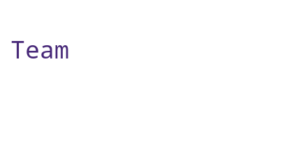

 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   []

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************
No action verbs
 
Measureable Results :   ['Sales']

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************


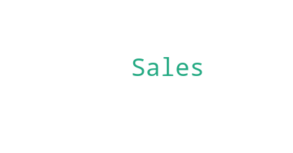

 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Physics', 'Nosql', 'Python', 'Etl', 'Sales', 'Oop', 'Mathematics', 'Java', 'C']
 
Education :  [('BS', '2017'), 'MS']

Experience 0

***************************************** WORLCLOUD FOR RESUME ****************************************


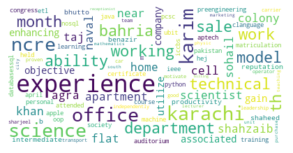


**************************************** WORLCLOUD FOR STRENGTH ****************************************


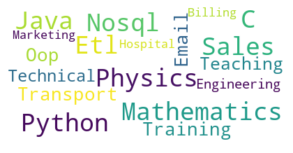


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


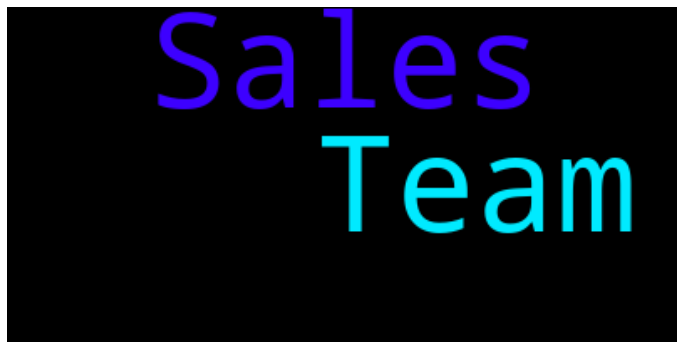


******************************************* SOFT SKILLS CLASSIFICATION **************************************



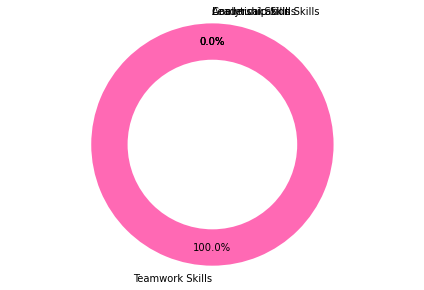


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



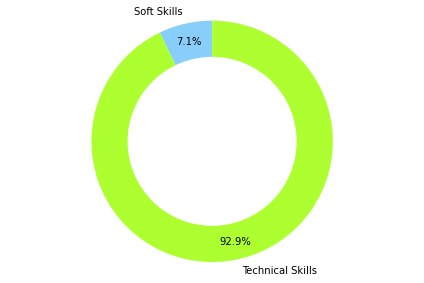

None
*******************************************
KEYWORDS
AI model (2)
ML one (1)
Stats one (1)
DE one (1)
DL one (1)
Python one (1)
AI language (1)
AI java (1)
ML learning (1)
NLP learning (1)
Stats learning (1)
DL learning (1)
Python learning (1)
DL also (1)
********************DF********************
          Keywords_List
0          AI model (2)
1            ML one (1)
2         Stats one (1)
3            DE one (1)
4            DL one (1)
5        Python one (1)
6       AI language (1)
7           AI java (1)
8       ML learning (1)
9      NLP learning (1)
10   Stats learning (1)
11      DL learning (1)
12  Python learning (1)
13          DL also (1)
['Shahzaib CV']
******************DATAF**************
   Candidate Name Subject    Keyword Count
0     shahzaib cv      AI     model      2
1     shahzaib cv      ML       one      1
2     shahzaib cv   Stats       one      1
3     shahzaib cv      DE       one      1
4     shahzaib cv      DL       one      1
5     shahzaib cv  Pytho

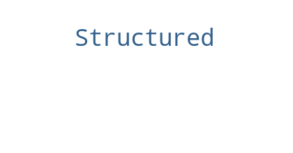

 
Measureable Results :   ['Growth']

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************


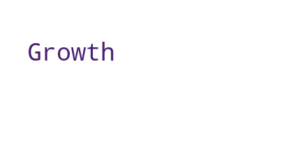

 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Ajax', 'Pandas', 'Python', 'Sql', 'Javascript', 'Mysql', 'Jquery', 'Github', 'Wordpress', 'Html', 'Css']
 
Education :  ['MS']

Experience []

***************************************** WORLCLOUD FOR RESUME ****************************************


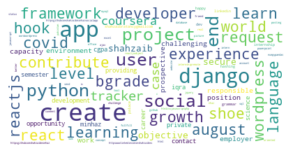


**************************************** WORLCLOUD FOR STRENGTH ****************************************


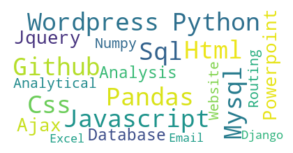


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


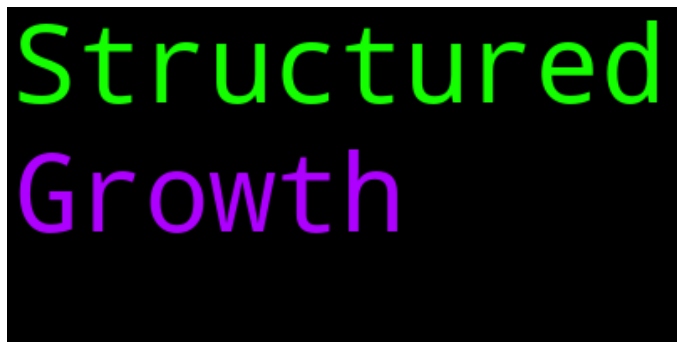


******************************************* SOFT SKILLS CLASSIFICATION **************************************



<ipython-input-39-14cbadeba58c>:202: MatplotlibDeprecationWarning: normalize=None does not normalize if the sum is less than 1 but this behavior is deprecated since 3.3 until two minor releases later. After the deprecation period the default value will be normalize=True. To prevent normalization pass normalize=False 
  plt.pie(data1, colors = colors, labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.85)


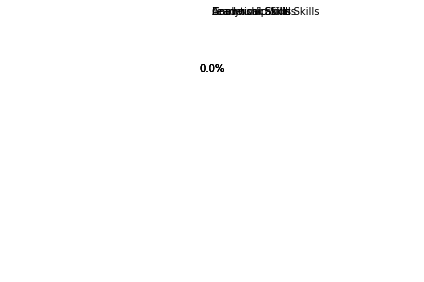


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



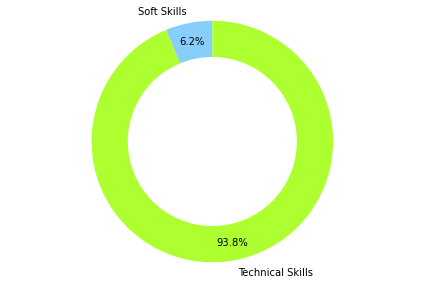

None
*******************************************
KEYWORDS
ML learning (2)
NLP learning (2)
Stats learning (2)
DL learning (2)
Python learning (2)
NLP development (1)
DE development (1)
Python development (1)
Stats learn (2)
ML one (1)
Stats one (1)
DE one (1)
DL one (1)
Python one (1)
Python using (4)
DL also (2)
ML used (1)
NLP used (1)
DE used (1)
Python used (1)
AI language (1)
ML data (1)
NLP data (1)
AI data (1)
Stats data (1)
DL data (1)
Python data (1)
********************DF********************
             Keywords_List
0          ML learning (2)
1         NLP learning (2)
2       Stats learning (2)
3          DL learning (2)
4      Python learning (2)
5      NLP development (1)
6       DE development (1)
7   Python development (1)
8          Stats learn (2)
9               ML one (1)
10           Stats one (1)
11              DE one (1)
12              DL one (1)
13          Python one (1)
14        Python using (4)
15             DL also (2)
16             ML used (1)
17     

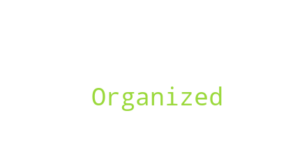

 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   ['Organized', 'Completed', 'Implemented']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


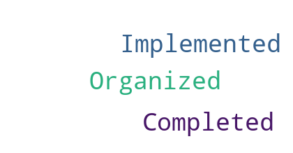

 
Measureable Results :   []

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************
No measureable result
 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Visualization', 'Statistics', 'Bootstrap', 'Dbms', 'Python', 'Sql', 'Algorithms', 'Mysql', 'Javafx', 'Oop', 'Html', 'Tableau', 'Analytics', 'Java', 'Css']
 
Education :  ['Ms']

Experience []

***************************************** WORLCLOUD FOR RESUME ****************************************


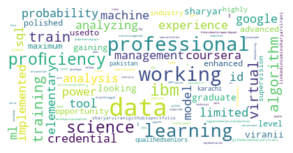


**************************************** WORLCLOUD FOR STRENGTH ****************************************


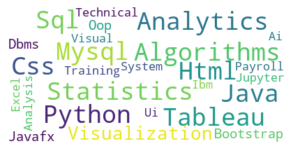


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


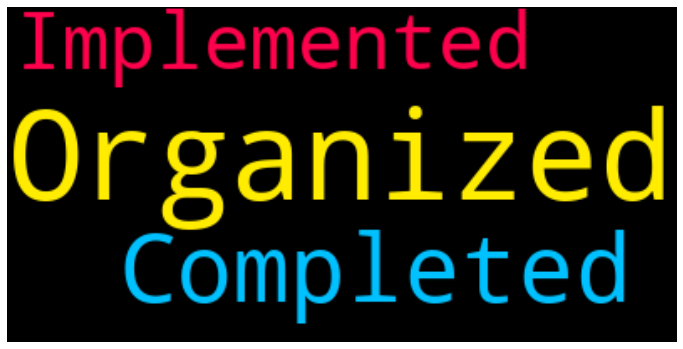


******************************************* SOFT SKILLS CLASSIFICATION **************************************



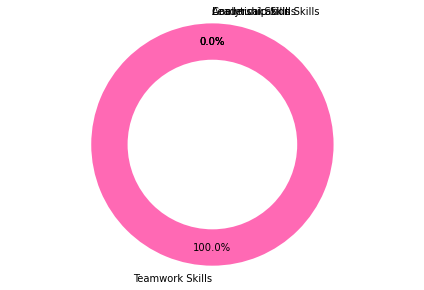


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



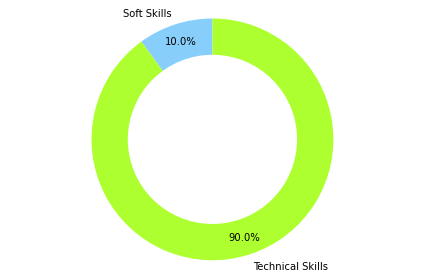

None
*******************************************
KEYWORDS
ML used (1)
NLP used (1)
DE used (1)
Python used (1)
ML data (11)
NLP data (11)
AI data (11)
Stats data (11)
DL data (11)
Python data (11)
ML learning (5)
NLP learning (5)
Stats learning (5)
DL learning (5)
Python learning (5)
AI model (3)
Python using (5)
ML system (2)
NLP system (2)
AI system (2)
Stats system (2)
DE system (2)
DL system (2)
AI java (1)
********************DF********************
          Keywords_List
0           ML used (1)
1          NLP used (1)
2           DE used (1)
3       Python used (1)
4          ML data (11)
5         NLP data (11)
6          AI data (11)
7       Stats data (11)
8          DL data (11)
9      Python data (11)
10      ML learning (5)
11     NLP learning (5)
12   Stats learning (5)
13      DL learning (5)
14  Python learning (5)
15         AI model (3)
16     Python using (5)
17        ML system (2)
18       NLP system (2)
19        AI system (2)
20     Stats system (2)
21        DE s

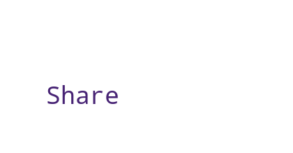

 
Communication Skills :  ['Write']

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************


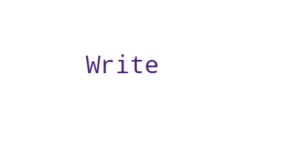

 
Action Verbs :   []

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************
No action verbs
 
Measureable Results :   ['Average']

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************


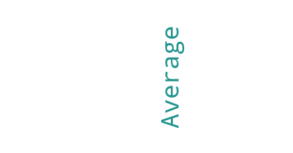

 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Bootstrap', 'Sql', 'Basic', 'Sqlite', 'Heroku', 'Html', 'Git', 'Css', 'C']
 
Education :  []

Experience []

***************************************** WORLCLOUD FOR RESUME ****************************************


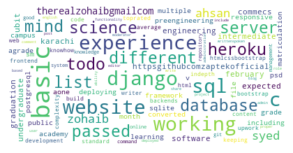


**************************************** WORLCLOUD FOR STRENGTH ****************************************


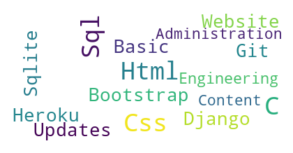


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


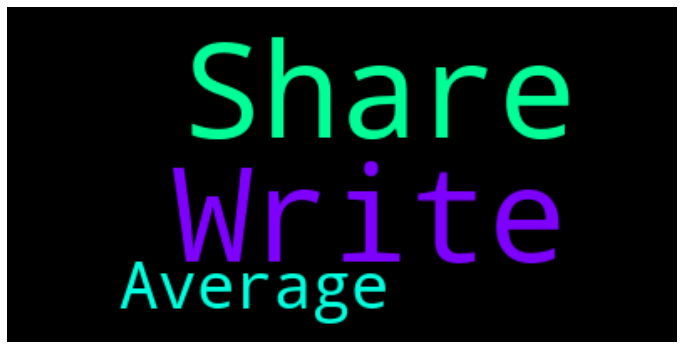


******************************************* SOFT SKILLS CLASSIFICATION **************************************



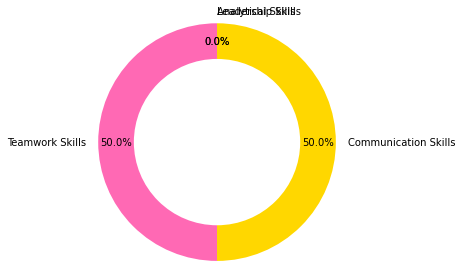


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



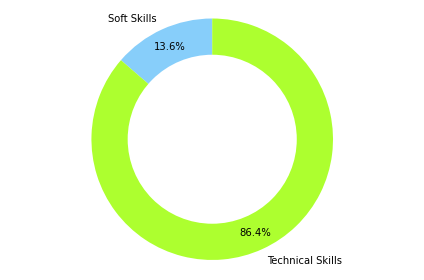

None
*******************************************
KEYWORDS
ML software (1)
NLP software (1)
AI software (1)
Stats software (1)
DE software (1)
DL software (1)
Python software (1)
ML one (1)
Stats one (1)
DE one (1)
DL one (1)
Python one (1)
ML learning (1)
NLP learning (1)
Stats learning (1)
DL learning (1)
Python learning (1)
NLP development (1)
DE development (1)
Python development (1)
Python using (3)
DE systems (1)
Python based (2)
********************DF********************
             Keywords_List
0          ML software (1)
1         NLP software (1)
2          AI software (1)
3       Stats software (1)
4          DE software (1)
5          DL software (1)
6      Python software (1)
7               ML one (1)
8            Stats one (1)
9               DE one (1)
10              DL one (1)
11          Python one (1)
12         ML learning (1)
13        NLP learning (1)
14      Stats learning (1)
15         DL learning (1)
16     Python learning (1)
17     NLP development (1)
18   

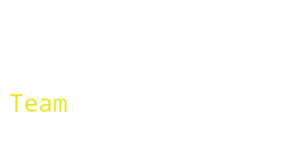

 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   ['Integrated']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


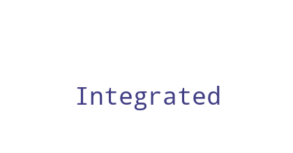

 
Measureable Results :   []

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************
No measureable result
 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Flask', 'Python', 'Matlab', 'Android', 'Oop', 'Java']
 
Education :  []

Experience []

***************************************** WORLCLOUD FOR RESUME ****************************************


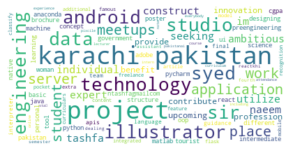


**************************************** WORLCLOUD FOR STRENGTH ****************************************


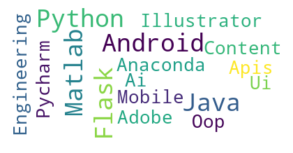


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


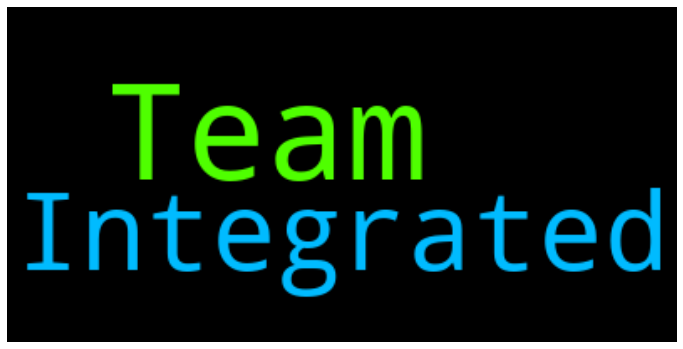


******************************************* SOFT SKILLS CLASSIFICATION **************************************



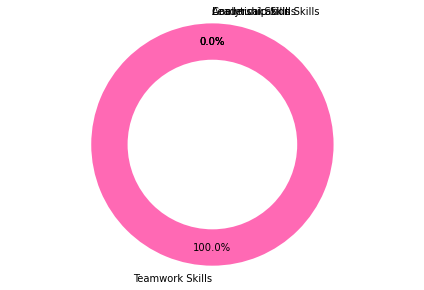


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



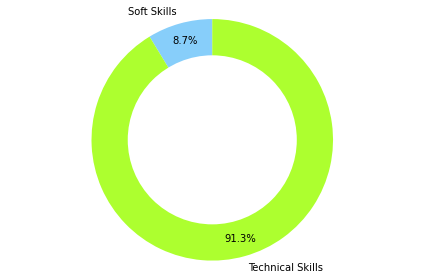

None
*******************************************
KEYWORDS
DL also (2)
ML learning (1)
NLP learning (1)
Stats learning (1)
DL learning (1)
Python learning (1)
ML data (2)
NLP data (2)
AI data (2)
Stats data (2)
DL data (2)
Python data (2)
AI java (1)
AI language (1)
Python using (1)
AI model (1)
********************DF********************
          Keywords_List
0           DL also (2)
1       ML learning (1)
2      NLP learning (1)
3    Stats learning (1)
4       DL learning (1)
5   Python learning (1)
6           ML data (2)
7          NLP data (2)
8           AI data (2)
9        Stats data (2)
10          DL data (2)
11      Python data (2)
12          AI java (1)
13      AI language (1)
14     Python using (1)
15         AI model (1)
['tafshaResume ']
******************DATAF**************
   Candidate Name Subject    Keyword Count
0   tafsharesume       DL      also      2
1   tafsharesume       ML  learning      1
2   tafsharesume      NLP  learning      1
3   tafsharesume    Stats

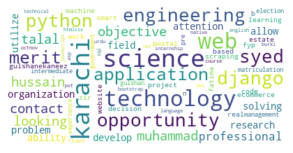


**************************************** WORLCLOUD FOR STRENGTH ****************************************


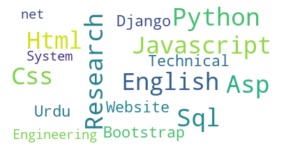


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************
 

******************************************* SOFT SKILLS CLASSIFICATION **************************************



<ipython-input-39-14cbadeba58c>:202: MatplotlibDeprecationWarning: normalize=None does not normalize if the sum is less than 1 but this behavior is deprecated since 3.3 until two minor releases later. After the deprecation period the default value will be normalize=True. To prevent normalization pass normalize=False 
  plt.pie(data1, colors = colors, labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.85)


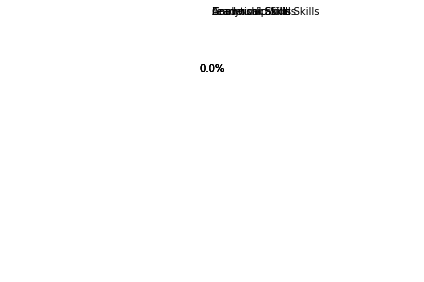


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



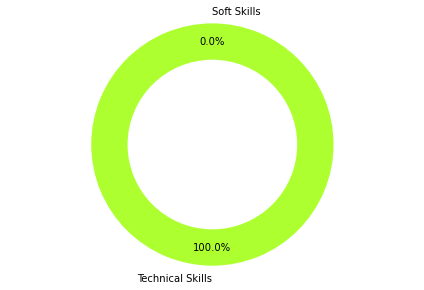

None
*******************************************
KEYWORDS
ML system (2)
NLP system (2)
AI system (2)
Stats system (2)
DE system (2)
DL system (2)
Python based (1)
ML learning (1)
NLP learning (1)
Stats learning (1)
DL learning (1)
Python learning (1)
Python using (1)
********************DF********************
          Keywords_List
0         ML system (2)
1        NLP system (2)
2         AI system (2)
3      Stats system (2)
4         DE system (2)
5         DL system (2)
6      Python based (1)
7       ML learning (1)
8      NLP learning (1)
9    Stats learning (1)
10      DL learning (1)
11  Python learning (1)
12     Python using (1)
['Talal Hussain CV']
******************DATAF**************
      Candidate Name Subject    Keyword Count
0   talal hussain cv      ML    system      2
1   talal hussain cv     NLP    system      2
2   talal hussain cv      AI    system      2
3   talal hussain cv   Stats    system      2
4   talal hussain cv      DE    system      2
5   talal hussain 

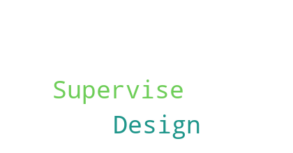

 
Teamwork Skills :  []

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************
No Teamwork skill
 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   []

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************
No action verbs
 
Measureable Results :   ['%']

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************
No measureable result
 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['S', 'Css', 'Python', 'Firebase', 'R', 'Html', 'Java', 'Github', 'C']
 
Education :  ['X']

Experience []

***************************************** WORLCLOUD FOR RESUME

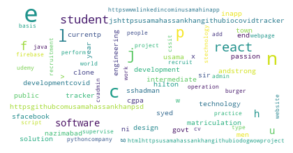


**************************************** WORLCLOUD FOR STRENGTH ****************************************


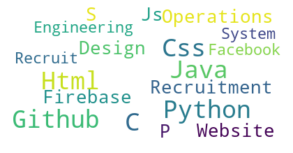


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


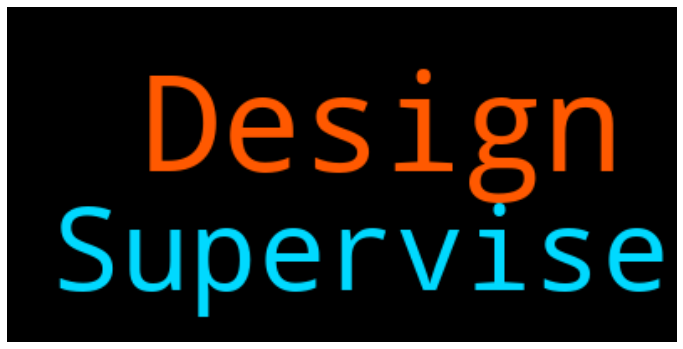


******************************************* SOFT SKILLS CLASSIFICATION **************************************



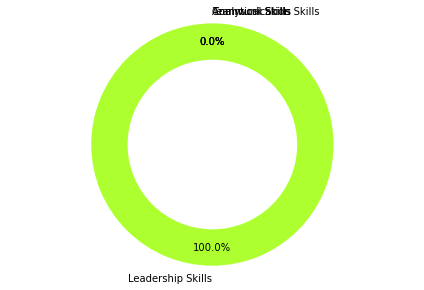


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



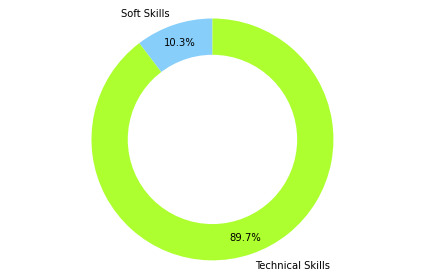

None
*******************************************
KEYWORDS
NLP development (2)
DE development (2)
Python development (2)
ML software (2)
NLP software (2)
AI software (2)
Stats software (2)
DE software (2)
DL software (2)
Python software (2)
ML system (1)
NLP system (1)
AI system (1)
Stats system (1)
DE system (1)
DL system (1)
AI java (1)
********************DF********************
             Keywords_List
0      NLP development (2)
1       DE development (2)
2   Python development (2)
3          ML software (2)
4         NLP software (2)
5          AI software (2)
6       Stats software (2)
7          DE software (2)
8          DL software (2)
9      Python software (2)
10           ML system (1)
11          NLP system (1)
12           AI system (1)
13        Stats system (1)
14           DE system (1)
15           DL system (1)
16             AI java (1)
['usamahassankhan-resume-jan-2021']
******************DATAF**************
                     Candidate Name Subject       Keyword

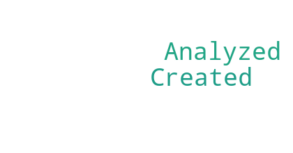

 
Leadership Skills :  ['Institute']

**************************************** WORLCLOUD FOR LEADERSHIP SKILLS ****************************************


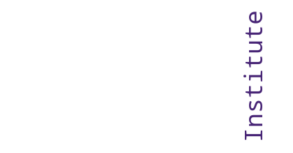

 
Teamwork Skills :  ['Worked', 'Supervised', 'Help']

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************


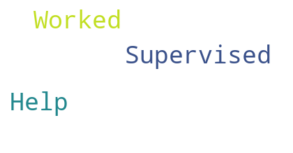

 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   ['Analyzed', 'Solved', 'Processed', 'Supervised', 'Collected']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


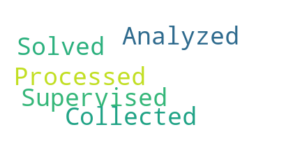

 
Measureable Results :   []

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************
No measureable result
 
Result driven skills :   ['Solved', 'Change']

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************


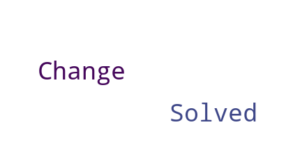

 
Strength :  ['Visualization', 'Postgis', 'Postgresql', 'Python', 'Arcgis', 'Javascript', 'Selenium', 'Automation', 'Gis', 'Processing', 'Matlab', 'Json', 'Html', 'Mathematics', 'Css']
 
Education :  ['BS', 'MS']

Experience []

***************************************** WORLCLOUD FOR RESUME ****************************************


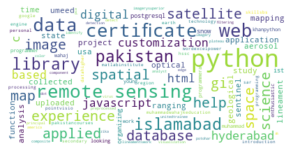


**************************************** WORLCLOUD FOR STRENGTH ****************************************


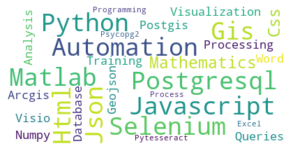


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


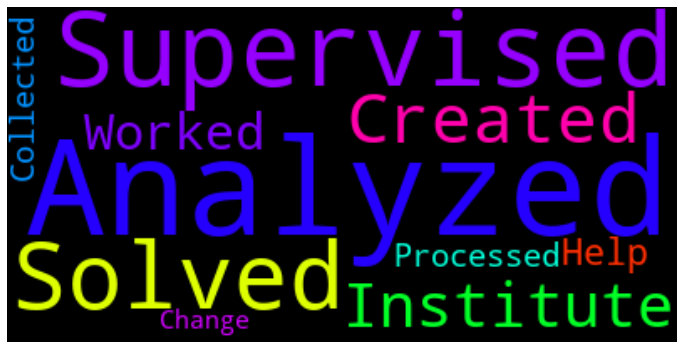


******************************************* SOFT SKILLS CLASSIFICATION **************************************



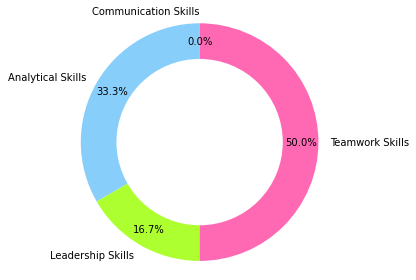


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



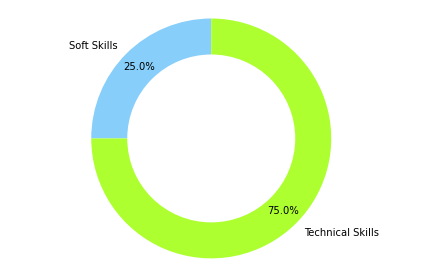

None
*******************************************
KEYWORDS
AI processing (1)
NLP programming (1)
AI programming (1)
Stats programming (1)
DE programming (1)
Python programming (1)
Python based (2)
Python using (12)
ML data (6)
NLP data (6)
AI data (6)
Stats data (6)
DL data (6)
Python data (6)
AI methods (1)
Stats process (1)
DL use (1)
AI model (1)
********************DF********************
             Keywords_List
0        AI processing (1)
1      NLP programming (1)
2       AI programming (1)
3    Stats programming (1)
4       DE programming (1)
5   Python programming (1)
6         Python based (2)
7        Python using (12)
8              ML data (6)
9             NLP data (6)
10             AI data (6)
11          Stats data (6)
12             DL data (6)
13         Python data (6)
14          AI methods (1)
15       Stats process (1)
16              DL use (1)
17            AI model (1)
['Wahaj', 'Resume']
******************DATAF**************
   Candidate Name Subject       Key

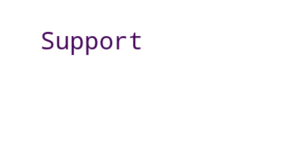

 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   []

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************
No action verbs
 
Measureable Results :   ['Growth']

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************


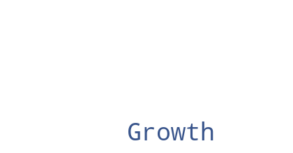

 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Crm', 'Sql', 'Firebase', 'Android', 'Xml', 'Urdu', 'English', 'Java']
 
Education :  []

Experience []

***************************************** WORLCLOUD FOR RESUME ****************************************


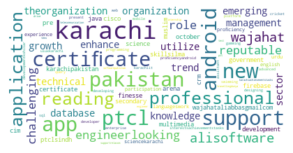


**************************************** WORLCLOUD FOR STRENGTH ****************************************


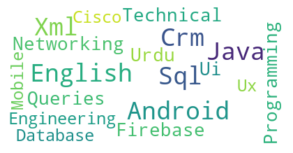


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


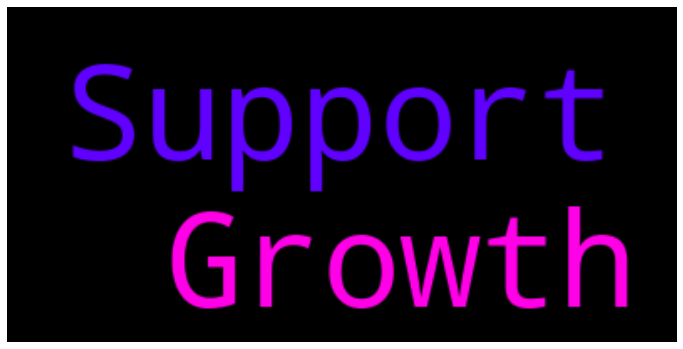


******************************************* SOFT SKILLS CLASSIFICATION **************************************



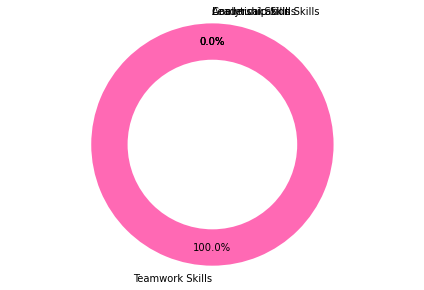


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



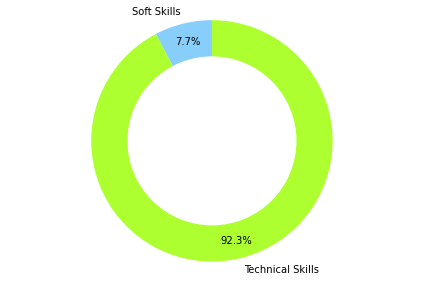

None
*******************************************
KEYWORDS
ML software (2)
NLP software (2)
AI software (2)
Stats software (2)
DE software (2)
DL software (2)
Python software (2)
AI java (1)
NLP development (2)
DE development (2)
Python development (2)
NLP programming (1)
AI programming (1)
Stats programming (1)
DE programming (1)
Python programming (1)
********************DF********************
             Keywords_List
0          ML software (2)
1         NLP software (2)
2          AI software (2)
3       Stats software (2)
4          DE software (2)
5          DL software (2)
6      Python software (2)
7              AI java (1)
8      NLP development (2)
9       DE development (2)
10  Python development (2)
11     NLP programming (1)
12      AI programming (1)
13   Stats programming (1)
14      DE programming (1)
15  Python programming (1)
["Wajahat's Resume.pdf"]
******************DATAF**************
          Candidate Name Subject       Keyword Count
0   wajahat's resume.pdf   

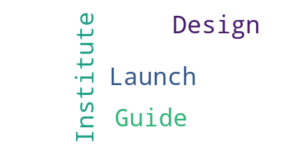

 
Teamwork Skills :  ['Team']

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************


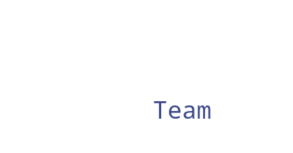

 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   ['Designed']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


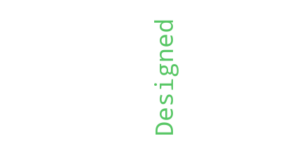

 
Measureable Results :   []

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************
No measureable result
 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Writing', 'Python', 'Music', 'Basic', 'Urdu', 'Html', 'English', 'Calculus', 'Animation', 'Css']
 
Education :  []

Experience []

***************************************** WORLCLOUD FOR RESUME ****************************************


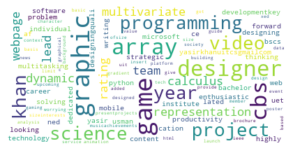


**************************************** WORLCLOUD FOR STRENGTH ****************************************


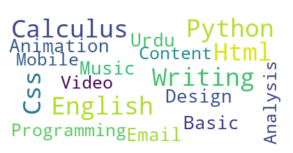


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


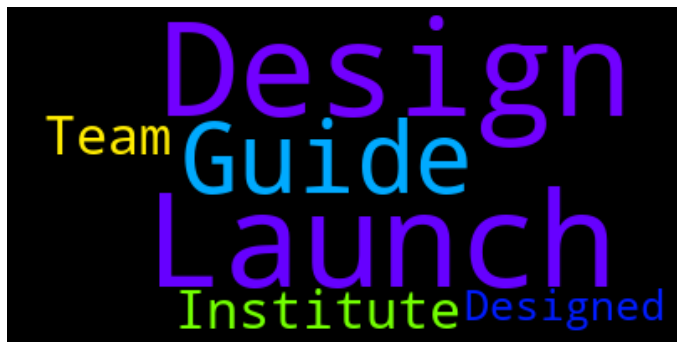


******************************************* SOFT SKILLS CLASSIFICATION **************************************



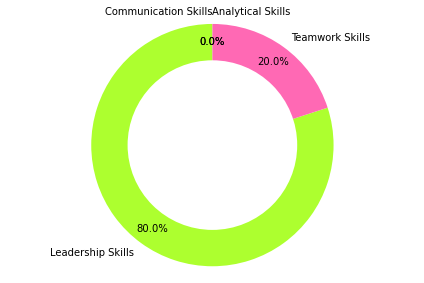


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



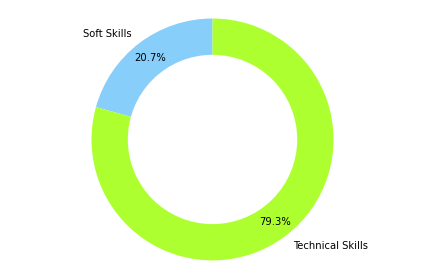

None
*******************************************
KEYWORDS
ML software (1)
NLP software (1)
AI software (1)
Stats software (1)
DE software (1)
DL software (1)
Python software (1)
NLP development (1)
DE development (1)
Python development (1)
NLP programming (2)
AI programming (2)
Stats programming (2)
DE programming (2)
Python programming (2)
ML data (1)
NLP data (1)
AI data (1)
Stats data (1)
DL data (1)
Python data (1)
Python based (1)
Python using (1)
********************DF********************
             Keywords_List
0          ML software (1)
1         NLP software (1)
2          AI software (1)
3       Stats software (1)
4          DE software (1)
5          DL software (1)
6      Python software (1)
7      NLP development (1)
8       DE development (1)
9   Python development (1)
10     NLP programming (2)
11      AI programming (2)
12   Stats programming (2)
13      DE programming (2)
14  Python programming (2)
15             ML data (1)
16            NLP data (1)
17            

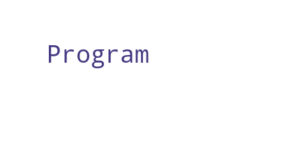

 
Leadership Skills :  ['Institute']

**************************************** WORLCLOUD FOR LEADERSHIP SKILLS ****************************************


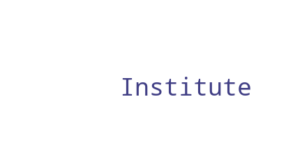

 
Teamwork Skills :  ['Organized', 'Team']

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************


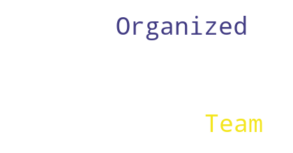

 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   ['Organized', 'Completed']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


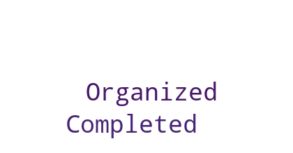

 
Measureable Results :   ['%']

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************
No measureable result
 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Statistics', 'Python', 'Mysql', 'Negotiation', 'C']
 
Education :  ['BS']

Experience 0

***************************************** WORLCLOUD FOR RESUME ****************************************


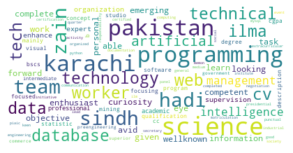


**************************************** WORLCLOUD FOR STRENGTH ****************************************


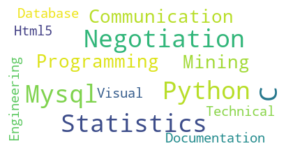


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


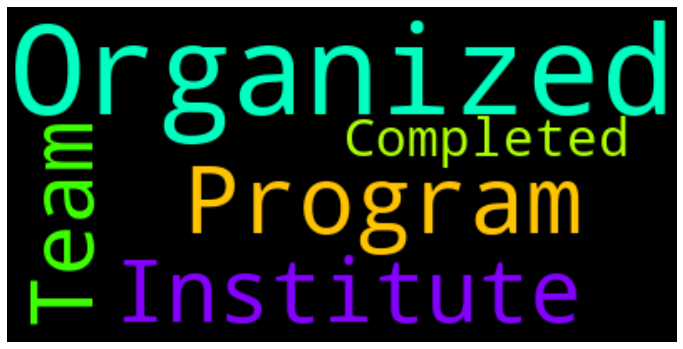


******************************************* SOFT SKILLS CLASSIFICATION **************************************



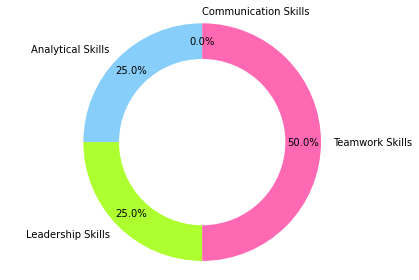


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



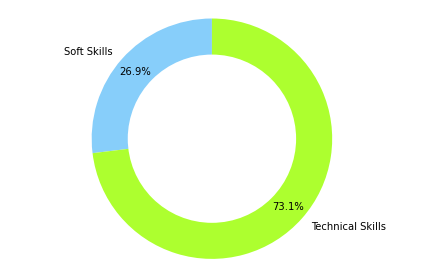

None
*******************************************
KEYWORDS
Stats learn (1)
DL also (2)
NLP programming (4)
AI programming (4)
Stats programming (4)
DE programming (4)
Python programming (4)
ML software (1)
NLP software (1)
AI software (1)
Stats software (1)
DE software (1)
DL software (1)
Python software (1)
Python using (2)
ML data (2)
NLP data (2)
AI data (2)
Stats data (2)
DL data (2)
Python data (2)
********************DF********************
             Keywords_List
0          Stats learn (1)
1              DL also (2)
2      NLP programming (4)
3       AI programming (4)
4    Stats programming (4)
5       DE programming (4)
6   Python programming (4)
7          ML software (1)
8         NLP software (1)
9          AI software (1)
10      Stats software (1)
11         DE software (1)
12         DL software (1)
13     Python software (1)
14        Python using (2)
15             ML data (2)
16            NLP data (2)
17             AI data (2)
18          Stats data (2)
19         

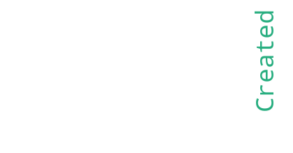

 
Leadership Skills :  []

**************************************** WORLCLOUD FOR LEADERSHIP SKILLS ****************************************
No leadership skill
 
Teamwork Skills :  ['Worked', 'Managed', 'Team']

**************************************** WORLCLOUD FOR TEAMWORK SKILLS ****************************************


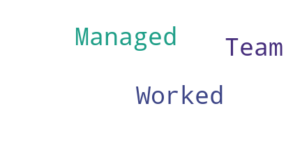

 
Communication Skills :  []

***************************************** WORLCLOUD FOR COMMUNICATION SKILLS ****************************************
No communication skill
 
Action Verbs :   ['Simplified', 'Arranged']

***************************************** WORLCLOUD FOR ACTION VERBS ****************************************


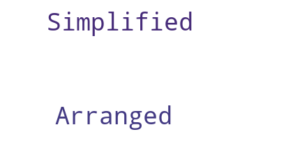

 
Measureable Results :   ['%', 'Growth']

**************************************** WORLCLOUD FOR MEASUREABLE RESULT ****************************************


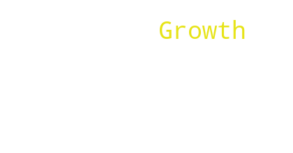

 
Result driven skills :   []

**************************************** WORLCLOUD FOR RESULT DRIVEN SKILLS ****************************************
No result driven skill
 
Strength :  ['Sql', 'Algorithms', 'Wordpress', 'Urdu', 'Visualization', 'Statistics', 'Python', 'Opencv', 'Processing', 'Analytics', 'Dynamodb', 'C', 'Pentaho', 'Etl', 'Mysql', 'Sqoop', 'Html', 'English', 'Mandarin', 'Bootstrap', 'Pandas', 'Php', 'Hadoop', 'Css']
 
Education :  [('BS', '2016')]

Experience 0

***************************************** WORLCLOUD FOR RESUME ****************************************


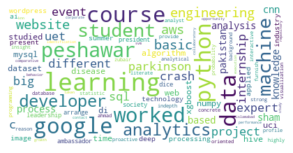


**************************************** WORLCLOUD FOR STRENGTH ****************************************


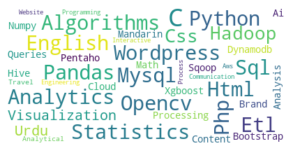


**************************************** WORLCLOUD FOR SOFT SKILLS ****************************************


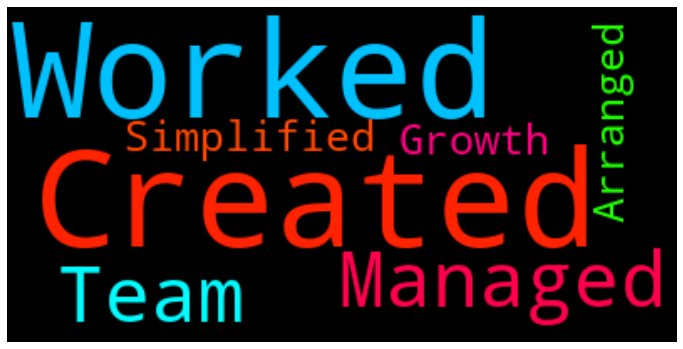


******************************************* SOFT SKILLS CLASSIFICATION **************************************



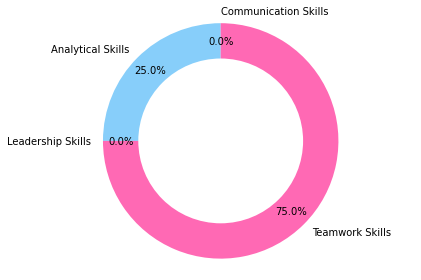


******************************************* SOFT SKILLS vs TECHNICAL SKILLS **************************************



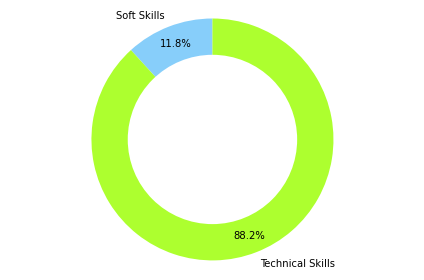

None
*******************************************
KEYWORDS
Stats process (2)
ML data (7)
NLP data (7)
AI data (7)
Stats data (7)
DL data (7)
Python data (7)
NLP programming (1)
AI programming (1)
Stats programming (1)
DE programming (1)
Python programming (1)
Python based (2)
ML learning (9)
NLP learning (9)
Stats learning (9)
DL learning (9)
Python learning (9)
ML used (3)
NLP used (3)
DE used (3)
Python used (3)
Python using (3)
AI model (1)
ML one (1)
Stats one (1)
DE one (1)
DL one (1)
Python one (1)
NLP development (1)
DE development (1)
Python development (1)
ML software (1)
NLP software (1)
AI software (1)
Stats software (1)
DE software (1)
DL software (1)
Python software (1)
AI processing (2)
********************DF********************
             Keywords_List
0        Stats process (2)
1              ML data (7)
2             NLP data (7)
3              AI data (7)
4           Stats data (7)
5              DL data (7)
6          Python data (7)
7      NLP programming (1)
8    

In [41]:
#Code to execute the above functions 
final_db=pd.DataFrame()
i=0
while i < len(onlyfiles):
    file=onlyfiles[i]
    data=main(file)
    print(data)
    dat=create_profile(file)
    final_db=final_db.append(dat)
    i+=1

In [42]:
#Code to count words under each category and visualize it through MAtplotlib
final_db2 = final_db['Keyword'].groupby([final_db['Candidate Name'], final_db['Subject']]).count().unstack()
final_db2.reset_index(inplace = True)
final_db2.fillna(0,inplace=True)
candidate_data = final_db2.iloc[:,1:]
candidate_data.index = final_db2['Candidate Name']
#the candidate profile in a csv format
cand=candidate_data.to_csv('candidate_profile.csv')
cand_profile=pd.read_csv('candidate_profile.csv')
cand_profile

,Candidate Name,AI,DE,DL,ML,NLP,Python,Stats
0,ahmed zubair - resume,5.0,5.0,4.0,5.0,5.0,5.0,5.0
1,akram's resume,3.0,0.0,2.0,3.0,2.0,4.0,3.0
2,arhum hayat qazi's resume,2.0,2.0,1.0,1.0,3.0,5.0,2.0
3,asher h khan resume,4.0,5.0,2.0,3.0,4.0,5.0,3.0
4,cv (areeb aziz),3.0,4.0,3.0,2.0,3.0,3.0,4.0
5,cv-hammadraza,2.0,2.0,2.0,2.0,3.0,4.0,2.0
6,daniyal resume,6.0,3.0,3.0,4.0,4.0,5.0,4.0
7,faizainullahkhalohocv,3.0,3.0,2.0,2.0,4.0,4.0,4.0
8,farrukhkhancv,4.0,4.0,5.0,4.0,5.0,4.0,4.0
9,ghulam,4.0,3.0,2.0,3.0,5.0,4.0,4.0


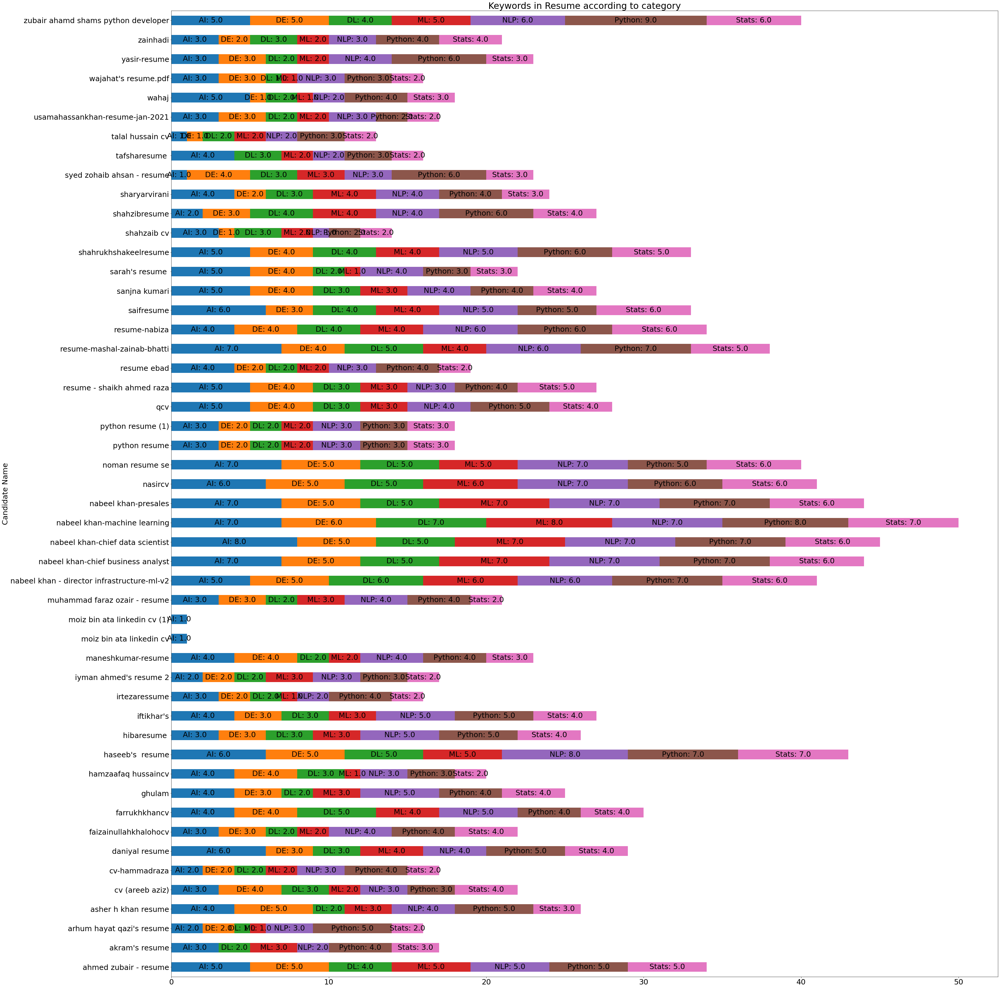

In [43]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams.update({'font.size': 25})
ax = candidate_data.plot.barh(title="Keywords in Resume according to category", legend=False, figsize=(50,60),stacked=True)
skills = []
for j in candidate_data.columns:
    for i in candidate_data.index:
        skill = str(j)+": " + str(candidate_data.loc[i][j])
        skills.append(skill)
patches = ax.patches
for skill, rect in zip(skills, patches):
    width = rect.get_width()
    if width > 0:
        x = rect.get_x()
        y = rect.get_y()
        height = rect.get_height()
        ax.text(x + width/2., y + height/2., skill, ha='center', va='center')
plt.show()

# HEATMAP

In [44]:
final_db['Keyword'].groupby([final_db['Candidate Name'], final_db['Subject']]).count().unstack()

Subject,AI,DE,DL,ML,NLP,Python,Stats
Candidate Name,,,,,,,
ahmed zubair - resume,5.0,5.0,4.0,5.0,5.0,5.0,5.0
akram's resume,3.0,NaN,2.0,3.0,2.0,4.0,3.0
arhum hayat qazi's resume,2.0,2.0,1.0,1.0,3.0,5.0,2.0
asher h khan resume,4.0,5.0,2.0,3.0,4.0,5.0,3.0
cv (areeb aziz),3.0,4.0,3.0,2.0,3.0,3.0,4.0
cv-hammadraza,2.0,2.0,2.0,2.0,3.0,4.0,2.0
daniyal resume,6.0,3.0,3.0,4.0,4.0,5.0,4.0
faizainullahkhalohocv,3.0,3.0,2.0,2.0,4.0,4.0,4.0
farrukhkhancv,4.0,4.0,5.0,4.0,5.0,4.0,4.0


In [45]:
data = (
    final_db
    .groupby(final_db['Candidate Name'])
    .Subject
    .value_counts()
    .unstack()
    .fillna(0)
)
sns.set_theme()

In [46]:
plt.figure(dpi=1800)
sns.heatmap(data,linewidths=.12)

<AxesSubplot:xlabel='Subject', ylabel='Candidate Name'>

# VISUALIZING SKILLS OF EMLOYEES

In [47]:
df2 = pd.read_csv("Details.csv")

In [48]:
df2.drop(['Expereince','Soft Skills'],inplace = True,axis =1)

In [49]:
import numpy as np

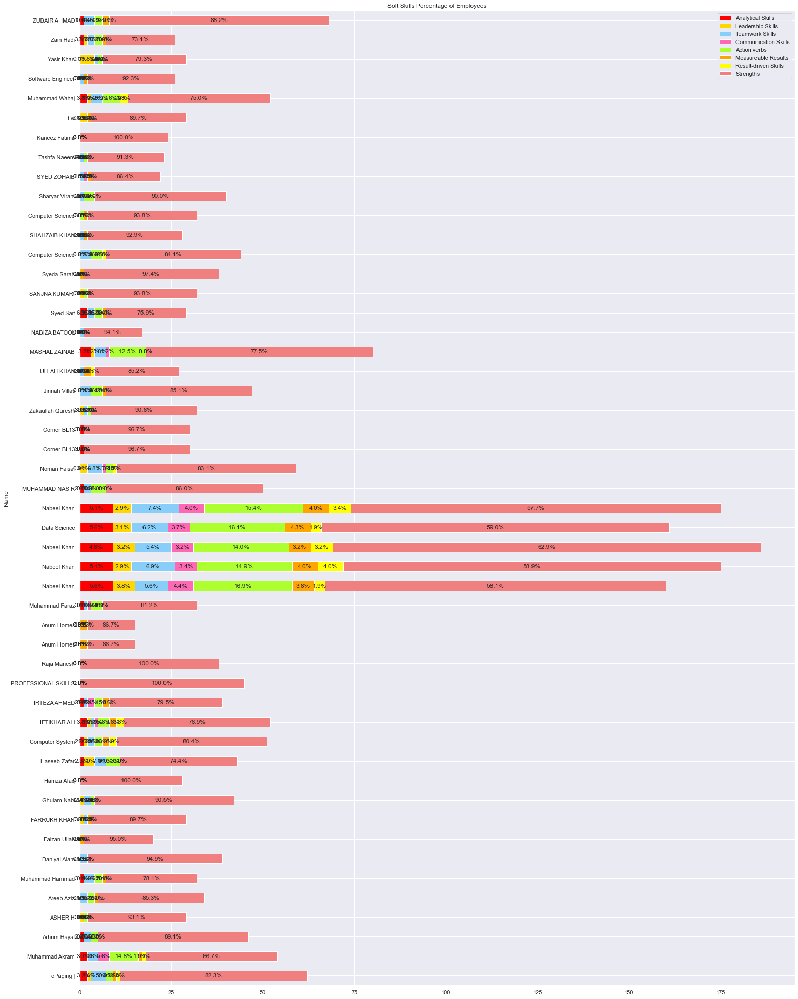

In [50]:
colors = ['red','gold','lightskyblue','hotpink','greenyellow','orange','yellow','lightcoral']
df2.plot(
  x = 'Name', 
  kind = 'barh', 
  color = colors,
  stacked = True, 
  figsize = (25,35),
  title = 'Soft Skills Percentage of Employees', 
  mark_right = True)

df_total = df2['Strengths'] + df2["Analytical Skills"] + df2["Leadership Skills"] + df2["Teamwork Skills"] + df2["Communication Skills"] + df2["Action verbs"] + df2["Measureable Results"] + df2["Result-driven Skills"]
df_rel = df2[df2.columns[1:]].div(df_total, 0)*100

for n in df_rel:
    for i, (cs, ab, pc) in enumerate(zip(df2.iloc[:, 1:].cumsum(1)[n], df2[n], df_rel[n])):

        plt.text(cs - ab / 2, i, str(np.round(pc, 1)) + '%', va = 'center', ha = 'center')

# COMPARING SOFT SKILLS vs TECHNICAL SKILLS of EMPLOYEES

In [51]:
df3 = pd.read_csv("Details.csv")

In [52]:
df3.drop(['Expereince','Analytical Skills','Leadership Skills','Communication Skills','Teamwork Skills','Action verbs','Measureable Results','Result-driven Skills'],inplace = True,axis =1)

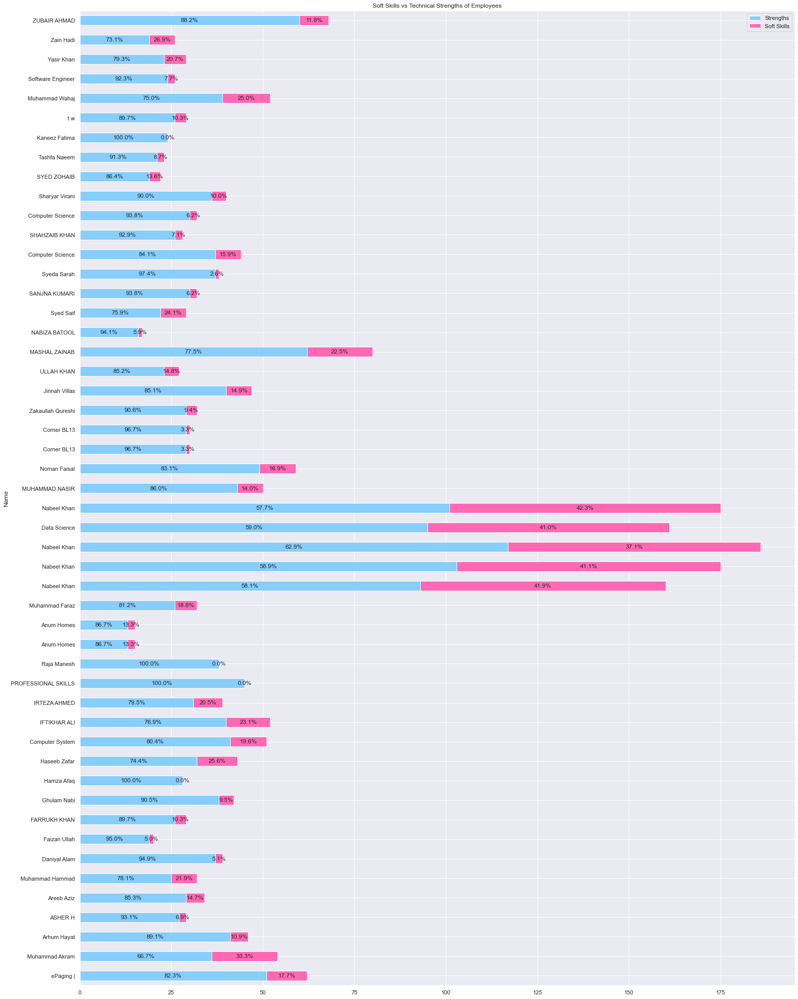

In [53]:
colors = ['lightskyblue','hotpink']
df3.plot(
  x = 'Name', 
  kind = 'barh', 
  color = colors,
  stacked = True, 
  figsize = (25,35),
  title = 'Soft Skills vs Technical Strengths of Employees', 
  mark_right = True)

df_total = df3['Strengths'] + df3["Soft Skills"]
df_rel = df3[df3.columns[1:]].div(df_total, 0)*100

for n in df_rel:
    for i, (cs, ab, pc) in enumerate(zip(df3.iloc[:, 1:].cumsum(1)[n], df3[n], df_rel[n])):

        plt.text(cs - ab / 2, i, str(np.round(pc, 1)) + '%', va = 'center', ha = 'center')

# EDUCATION VISUALIZATION

In [54]:
x = pd.read_csv("Personal Details.csv")

In [55]:
# Compute percentages from csv
degrees = set(x['Education'])
percentages = []
for degree in degrees:
    percentages.append(x[x['Education'] == degree].shape[0])
percentages = np.array(percentages)
percentages = ((percentages / percentages.sum()) * 100)

In [56]:
# Create labels for tree map
labels = [degree + '\n({0:.1f}%)'.format(percentage) for degree, percentage in zip(degrees, percentages)]

In [57]:
%matplotlib inline
import squarify
sns.set()
# Create figure
plt.figure(figsize=(25, 25), dpi=500)
squarify.plot(percentages, label=labels, color=sns.color_palette('colorblind', len(degrees)))
plt.axis('off')
# Add title
plt.title('Degrees')
# Show plot
plt.show()

# SKILLS SCORING

In [58]:
df2 = pd.read_csv("Details.csv")

In [59]:
group_analyticalskills = df2[df2.columns[2]].tolist()
group_leadershipskills = df2[df2.columns[3]].tolist()
group_teamworkskills = df2[df2.columns[4]].tolist()
group_communicationskills = df2[df2.columns[5]].tolist()
group_actionverbs = df2[df2.columns[6]].tolist()
group_measureableresults = df2[df2.columns[7]].tolist()
group_resultdrivenskills = df2[df2.columns[8]].tolist()
group_strengths = df2[df2.columns[9]].tolist()

In [60]:
data = pd.DataFrame({'Skills': ['Analytical'] * len(group_analyticalskills) + ['Leadership'] * len(group_leadershipskills)
                    + ['Teamwork'] * len(group_teamworkskills) + ['Communication'] * len(group_communicationskills) + 
                    ['Action verbs'] * len(group_actionverbs) + ['Measureable Results'] * len(group_measureableresults)
                    + ['Result-driven'] * len(group_resultdrivenskills) + ['Technical'] * len(group_strengths),
                    'Skills score': group_analyticalskills + group_leadershipskills + group_teamworkskills + group_communicationskills + 
                     group_actionverbs + group_measureableresults + group_resultdrivenskills + group_strengths})

C:\Miniconda-38\envs\env3.8\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


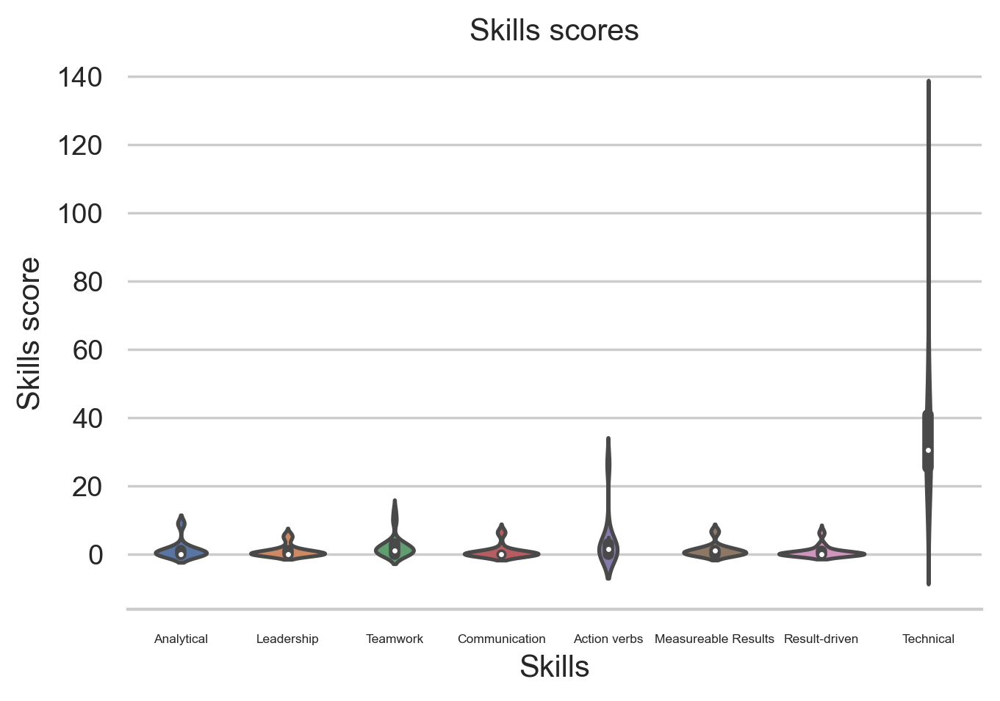

In [61]:
# Create figure
plt.figure(dpi=250)
plt.rc('xtick', labelsize=5)
# Set style
sns.set_style('whitegrid')
# Create boxplot
sns.violinplot('Skills', 'Skills score', data=data)
# Despine
sns.despine(left=True, right=True, top=True)
# Add title
plt.title('Skills scores')
# Show plot
plt.show()

# EMPLOYEES EXPERIENCE

In [62]:
df3 = pd.read_csv("Details.csv")

In [63]:
df3['Expereince'].replace({"[]": "0"}, inplace=True)

In [64]:
m = df3['Name'].tolist()
n = df3['Expereince'].tolist()

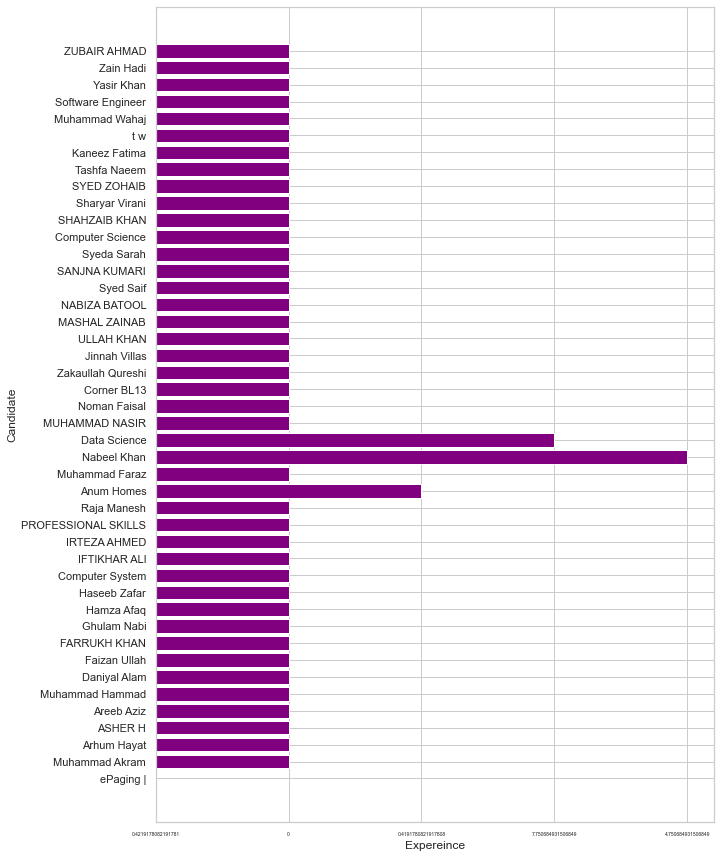

In [65]:
%matplotlib inline
plt.figure(figsize = (10, 15))
plt.barh(m,n,color = 'purple')
plt.xlabel('Expereince')
plt.ylabel('Candidate')
plt.show()

In [66]:
import pandas as pd
df4 = pd.read_csv("Details.csv")

In [67]:
p = df4['Soft Skills'] + df4['Strengths']
p

0      62
1      54
2      46
3      29
4      34
5      32
6      39
7      20
8      29
9      42
10     28
11     43
12     51
13     52
14     39
15     45
16     38
17     15
18     15
19     32
20    160
21    175
22    186
23    161
24    175
25     50
26     59
27     30
28     30
29     32
30     47
31     27
32     80
33     17
34     29
35     32
36     38
37     44
38     28
39     32
40     40
41     22
42     23
43     24
44     29
45     52
46     26
47     29
48     26
49     68
dtype: int64

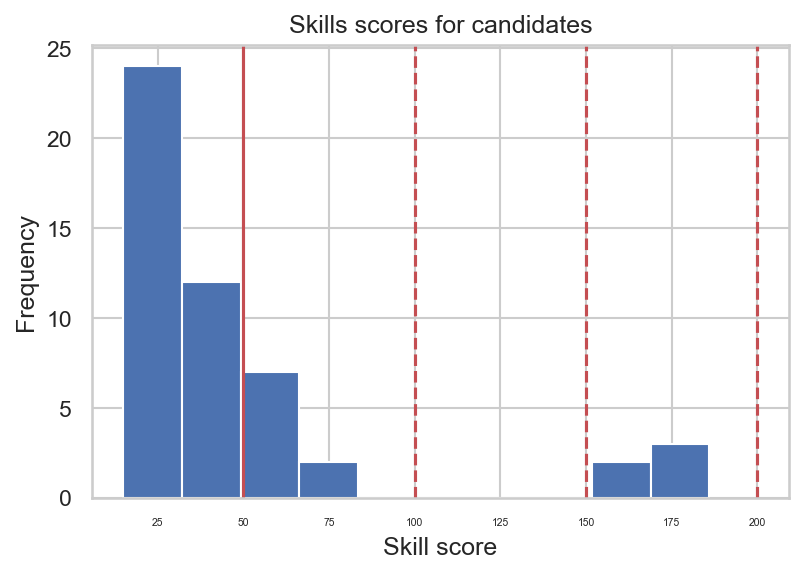

In [68]:
import matplotlib.pyplot as plt
# Create figure
plt.figure(figsize=(6, 4), dpi=150)
# Create histogram
plt.hist(p, bins=10)
plt.axvline(x=50, color='r')
plt.axvline(x=100, color='r', linestyle= '--')
plt.axvline(x=150, color='r', linestyle= '--')
plt.axvline(x=200, color='r', linestyle= '--')
# Add labels and title
plt.xlabel('Skill score')
plt.ylabel('Frequency')
plt.title('Skills scores for candidates')
# Show plot
plt.show()